In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import random

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from cluster_filter import cfilter, cassign

from External.ICT.calculate_ICT import calculate_ICT, calculate_sub_ICTs
from External.clustering import centers, k_means_pp
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.create_k_nearest import patch_together

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest"
metric = "euclidean"
dataset = "non_convex"
ICT_algorithm = "cluster_all"


min_cluster_size = 12
small_behavior = "reassign"

# image loading
n = number_of_nodes = 1000
Random = True
image_name = "image"

# for the filename
parameters = "2-0_5-1000"

In [6]:
def load_image(filename):
    a=plt.imread(filename+'.png')
    rgb_weights = [0.2989, 0.5870, 0.1140]
    
    grayscale_image = np.dot(a[...,:3], rgb_weights)>0
    
    return grayscale_image
    
    
def sample_points_from_image(n,img,Random=True):
    if not Random:
        random.seed(42)
    non_zero = np.where(img!=0)
    # non_zero=np.vstack((non_zero[0],non_zero[1])).T
    
    
    idx = random.sample(range(len(non_zero[0])),n)
    
    x_coord = non_zero[0][idx]
    y_coord = non_zero[1][idx]
    return x_coord,y_coord

In [7]:
# Compute the position array
img = load_image(image_name)
position = np.array(sample_points_from_image(n,img,Random)).T
position = StandardScaler().fit_transform(position)

sklearn is done: 0.18737053871154785
My own part is done: 0.001093149185180664


  0%|          | 0/1 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/6359 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6359 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 6359 -> 5767
update Arr 5767 -> 5234
update Arr 5234 -> 4757
update Arr 4757 -> 4323
update Arr 4323 -> 3928
update Arr 3928 -> 3565
update Arr 3565 -> 3240
update Arr 3240 -> 2940
update Arr 2940 -> 2669
update Arr 2669 -> 2422
update Arr 2422 -> 2194
update Arr 2194 -> 1990
update Arr 1990 -> 1804
update Arr 1804 -> 1636
update Arr 1636 -> 1487
update Arr 1487 -> 1349
update Arr 1349 -> 1225
update Arr 1225 -> 1111
update Arr 1111 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 999


create edgeId array:   0%|          | 0/999 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/999 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

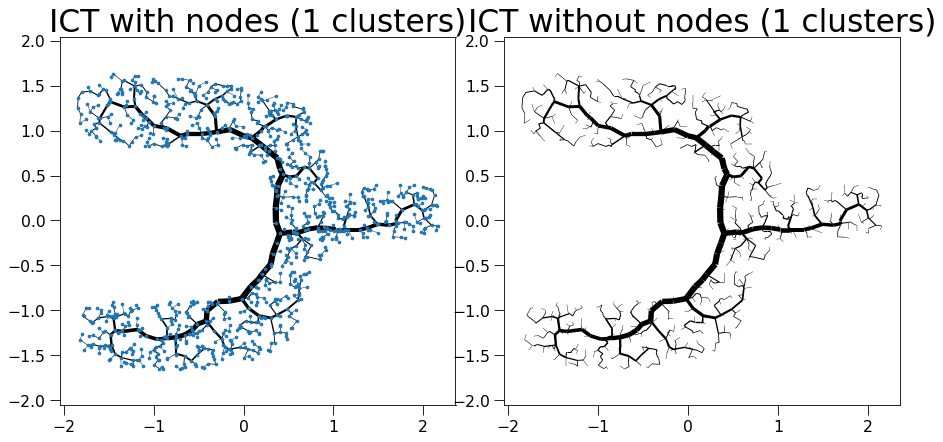

sklearn is done: 0.030268192291259766
My own part is done: 0.0006575584411621094


  0%|          | 0/2 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/2206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/347 [00:00<?, ?it/s]

update Arr 2206 -> 1994
update Arr 1994 -> 1795
update Arr 1795 -> 1629
update Arr 1629 -> 1475
update Arr 1475 -> 1340
update Arr 1340 -> 1218
update Arr 1218 -> 1104
update Arr 1104 -> 1002
update Arr 1002 -> 909
update Arr 909 -> 821
update Arr 821 -> 745
update Arr 745 -> 675
update Arr 675 -> 610
update Arr 610 -> 554
update Arr 554 -> 498
update Arr 498 -> 444
update Arr 444 -> 398
update Arr 398 -> 358
update Arr 358 -> 355
update Arr 355 -> 353
update Arr 353 -> 350
update Arr 350 -> 348
update Arr 348 -> 347
Final k: 11


create edgeId array:   0%|          | 0/4158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/651 [00:00<?, ?it/s]

update Arr 4158 -> 3772
update Arr 3772 -> 3427
update Arr 3427 -> 3101
update Arr 3101 -> 2809
update Arr 2809 -> 2553
update Arr 2553 -> 2319
update Arr 2319 -> 2103
update Arr 2103 -> 1906
update Arr 1906 -> 1730
update Arr 1730 -> 1572
update Arr 1572 -> 1427
update Arr 1427 -> 1292
update Arr 1292 -> 1172
update Arr 1172 -> 1064
update Arr 1064 -> 966
update Arr 966 -> 878
update Arr 878 -> 791
update Arr 791 -> 713
update Arr 713 -> 660
update Arr 660 -> 656
update Arr 656 -> 654
update Arr 654 -> 652
update Arr 652 -> 651


Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1002 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1002 -> 999


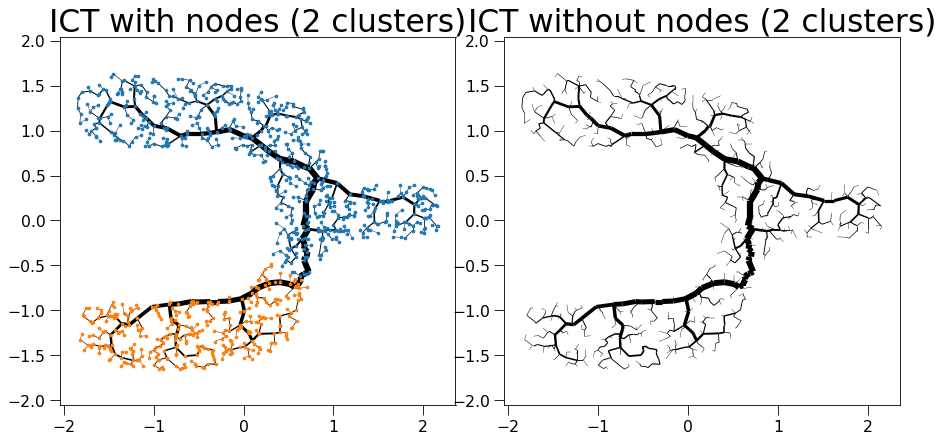

sklearn is done: 0.031986236572265625
My own part is done: 0.0005536079406738281


  0%|          | 0/3 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1774 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1774 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/276 [00:00<?, ?it/s]

update Arr 1774 -> 1603
update Arr 1603 -> 1451
update Arr 1451 -> 1319
update Arr 1319 -> 1199
update Arr 1199 -> 1087
update Arr 1087 -> 987
update Arr 987 -> 894
update Arr 894 -> 810
update Arr 810 -> 733
update Arr 733 -> 665
update Arr 665 -> 593
update Arr 593 -> 537
update Arr 537 -> 484
update Arr 484 -> 434
update Arr 434 -> 394
update Arr 394 -> 358
update Arr 358 -> 324
update Arr 324 -> 291
update Arr 291 -> 286
update Arr 286 -> 282
update Arr 282 -> 279
update Arr 279 -> 277
update Arr 277 -> 276
Final k: 11


create edgeId array:   0%|          | 0/2045 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2045 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/322 [00:00<?, ?it/s]

update Arr 2045 -> 1856
update Arr 1856 -> 1678
update Arr 1678 -> 1519
update Arr 1519 -> 1373
update Arr 1373 -> 1244
update Arr 1244 -> 1128
update Arr 1128 -> 1021
update Arr 1021 -> 923
update Arr 923 -> 839
update Arr 839 -> 762
update Arr 762 -> 690
update Arr 690 -> 627
update Arr 627 -> 563
update Arr 563 -> 508
update Arr 508 -> 458
update Arr 458 -> 414
update Arr 414 -> 375
update Arr 375 -> 333
update Arr 333 -> 330
update Arr 330 -> 328
update Arr 328 -> 325
update Arr 325 -> 323
update Arr 323 -> 322
Final k: 11


create edgeId array:   0%|          | 0/2568 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2568 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/399 [00:00<?, ?it/s]

update Arr 2568 -> 2328
update Arr 2328 -> 2105
update Arr 2105 -> 1910
update Arr 1910 -> 1736
update Arr 1736 -> 1572
update Arr 1572 -> 1425
update Arr 1425 -> 1295
update Arr 1295 -> 1177
update Arr 1177 -> 1062
update Arr 1062 -> 963
update Arr 963 -> 868
update Arr 868 -> 789
update Arr 789 -> 716
update Arr 716 -> 650
update Arr 650 -> 590
update Arr 590 -> 527
update Arr 527 -> 476
update Arr 476 -> 426
update Arr 426 -> 408
update Arr 408 -> 404
update Arr 404 -> 402
update Arr 402 -> 399


Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1005 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1005 -> 999


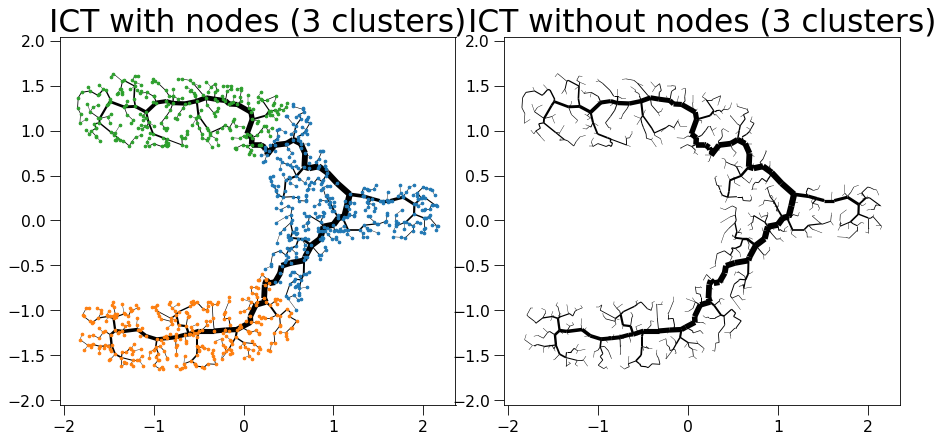

sklearn is done: 0.044774532318115234
My own part is done: 0.0005414485931396484


  0%|          | 0/4 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/2040 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2040 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/312 [00:00<?, ?it/s]

update Arr 2040 -> 1853
update Arr 1853 -> 1677
update Arr 1677 -> 1520
update Arr 1520 -> 1381
update Arr 1381 -> 1254
update Arr 1254 -> 1136
update Arr 1136 -> 1027
update Arr 1027 -> 931
update Arr 931 -> 843
update Arr 843 -> 760
update Arr 760 -> 690
update Arr 690 -> 627
update Arr 627 -> 566
update Arr 566 -> 509
update Arr 509 -> 461
update Arr 461 -> 419
update Arr 419 -> 379
update Arr 379 -> 337
update Arr 337 -> 321
update Arr 321 -> 318
update Arr 318 -> 315
update Arr 315 -> 313
update Arr 313 -> 312
Final k: 11


create edgeId array:   0%|          | 0/1998 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1998 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/314 [00:00<?, ?it/s]

update Arr 1998 -> 1814
update Arr 1814 -> 1649
update Arr 1649 -> 1490
update Arr 1490 -> 1346
update Arr 1346 -> 1223
update Arr 1223 -> 1109
update Arr 1109 -> 1004
update Arr 1004 -> 909
update Arr 909 -> 825
update Arr 825 -> 747
update Arr 747 -> 677
update Arr 677 -> 615
update Arr 615 -> 557
update Arr 557 -> 500
update Arr 500 -> 454
update Arr 454 -> 412
update Arr 412 -> 373
update Arr 373 -> 339
update Arr 339 -> 322
update Arr 322 -> 320
update Arr 320 -> 317
update Arr 317 -> 315
update Arr 315 -> 314
Final k: 11


create edgeId array:   0%|          | 0/1265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/198 [00:00<?, ?it/s]

update Arr 1265 -> 1143
update Arr 1143 -> 1039
update Arr 1039 -> 934
update Arr 934 -> 844
update Arr 844 -> 763
update Arr 763 -> 692
update Arr 692 -> 628
update Arr 628 -> 564
update Arr 564 -> 507
update Arr 507 -> 457
update Arr 457 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 293
update Arr 293 -> 262
update Arr 262 -> 233
update Arr 233 -> 208
update Arr 208 -> 203
update Arr 203 -> 201
update Arr 201 -> 199
update Arr 199 -> 198
Final k: 11


create edgeId array:   0%|          | 0/1109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/172 [00:00<?, ?it/s]

update Arr 1109 -> 1008
update Arr 1008 -> 910
update Arr 910 -> 819
update Arr 819 -> 743
update Arr 743 -> 670
update Arr 670 -> 606
update Arr 606 -> 548
update Arr 548 -> 494
update Arr 494 -> 448
update Arr 448 -> 404
update Arr 404 -> 363
update Arr 363 -> 328
update Arr 328 -> 298
update Arr 298 -> 267
update Arr 267 -> 241
update Arr 241 -> 219
update Arr 219 -> 199
update Arr 199 -> 181
update Arr 181 -> 177
update Arr 177 -> 175
update Arr 175 -> 173
update Arr 173 -> 172


Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1006 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1006 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1006 -> 999
added 2 edges early


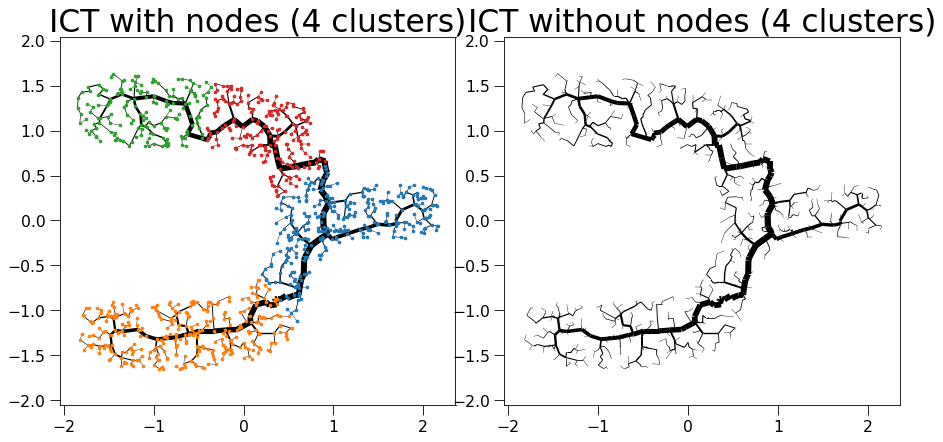

sklearn is done: 0.06421399116516113
My own part is done: 0.0006270408630371094


  0%|          | 0/5 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1108 -> 1002
update Arr 1002 -> 905
update Arr 905 -> 821
update Arr 821 -> 746
update Arr 746 -> 676
update Arr 676 -> 614
update Arr 614 -> 552
update Arr 552 -> 501
update Arr 501 -> 453
update Arr 453 -> 406
update Arr 406 -> 368
update Arr 368 -> 331
update Arr 331 -> 300
update Arr 300 -> 269
update Arr 269 -> 243
update Arr 243 -> 212
update Arr 212 -> 188
update Arr 188 -> 183
update Arr 183 -> 179
update Arr 179 -> 176
update Arr 176 -> 174
update Arr 174 -> 173
Final k: 11


create edgeId array:   0%|          | 0/1109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/172 [00:00<?, ?it/s]

update Arr 1109 -> 1008
update Arr 1008 -> 910
update Arr 910 -> 819
update Arr 819 -> 743
update Arr 743 -> 670
update Arr 670 -> 606
update Arr 606 -> 548
update Arr 548 -> 494
update Arr 494 -> 448
update Arr 448 -> 404
update Arr 404 -> 363
update Arr 363 -> 328
update Arr 328 -> 298
update Arr 298 -> 267
update Arr 267 -> 241
update Arr 241 -> 219
update Arr 219 -> 199
update Arr 199 -> 181
update Arr 181 -> 177
update Arr 177 -> 175
update Arr 175 -> 173
update Arr 173 -> 172
Final k: 11


create edgeId array:   0%|          | 0/1254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/194 [00:00<?, ?it/s]

update Arr 1254 -> 1137
update Arr 1137 -> 1022
update Arr 1022 -> 921
update Arr 921 -> 836
update Arr 836 -> 758
update Arr 758 -> 689
update Arr 689 -> 623
update Arr 623 -> 565
update Arr 565 -> 509
update Arr 509 -> 457
update Arr 457 -> 412
update Arr 412 -> 374
update Arr 374 -> 337
update Arr 337 -> 304
update Arr 304 -> 276
update Arr 276 -> 250
update Arr 250 -> 220
update Arr 220 -> 204
update Arr 204 -> 200
update Arr 200 -> 197
update Arr 197 -> 195
update Arr 195 -> 194
Final k: 11


create edgeId array:   0%|          | 0/1273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/198 [00:00<?, ?it/s]

update Arr 1273 -> 1157
update Arr 1157 -> 1043
update Arr 1043 -> 938
update Arr 938 -> 847
update Arr 847 -> 764
update Arr 764 -> 692
update Arr 692 -> 624
update Arr 624 -> 562
update Arr 562 -> 505
update Arr 505 -> 458
update Arr 458 -> 413
update Arr 413 -> 374
update Arr 374 -> 338
update Arr 338 -> 303
update Arr 303 -> 273
update Arr 273 -> 237
update Arr 237 -> 214
update Arr 214 -> 208
update Arr 208 -> 204
update Arr 204 -> 201
update Arr 201 -> 199
update Arr 199 -> 198
Final k: 11


create edgeId array:   0%|          | 0/1669 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1669 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/258 [00:00<?, ?it/s]

update Arr 1669 -> 1513
update Arr 1513 -> 1372
update Arr 1372 -> 1232
update Arr 1232 -> 1118
update Arr 1118 -> 1013
update Arr 1013 -> 914
update Arr 914 -> 828
update Arr 828 -> 748
update Arr 748 -> 679
update Arr 679 -> 617
update Arr 617 -> 549
update Arr 549 -> 496
update Arr 496 -> 444
update Arr 444 -> 400
update Arr 400 -> 362
update Arr 362 -> 328
update Arr 328 -> 290
update Arr 290 -> 268
update Arr 268 -> 264
update Arr 264 -> 261
update Arr 261 -> 259
update Arr 259 -> 258


Patching the components together:   0%|          | 0/5 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1007 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1007 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1007 -> 999
added 3 edges early


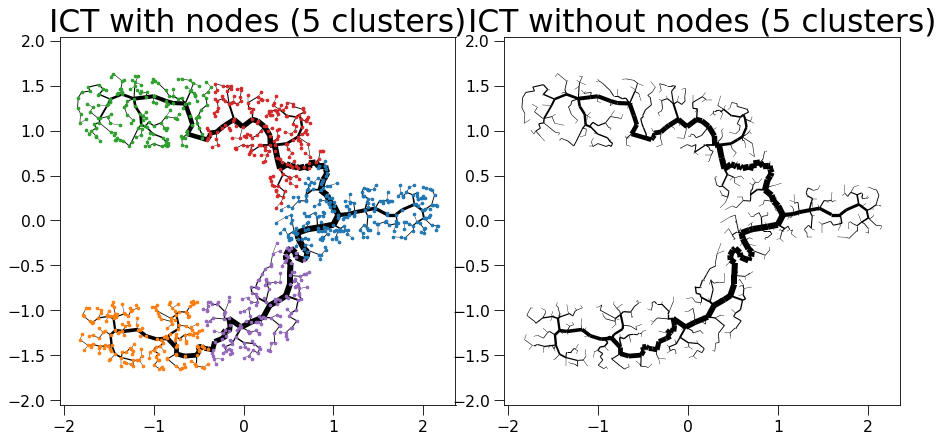

sklearn is done: 0.0550837516784668
My own part is done: 0.00074005126953125


  0%|          | 0/6 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1032 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1032 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 1032 -> 933
update Arr 933 -> 844
update Arr 844 -> 765
update Arr 765 -> 693
update Arr 693 -> 627
update Arr 627 -> 569
update Arr 569 -> 514
update Arr 514 -> 454
update Arr 454 -> 410
update Arr 410 -> 367
update Arr 367 -> 333
update Arr 333 -> 301
update Arr 301 -> 273
update Arr 273 -> 245
update Arr 245 -> 213
update Arr 213 -> 193
update Arr 193 -> 171
update Arr 171 -> 167
update Arr 167 -> 163
update Arr 163 -> 162
update Arr 162 -> 161
Final k: 11


create edgeId array:   0%|          | 0/1066 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1066 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/165 [00:00<?, ?it/s]

update Arr 1066 -> 962
update Arr 962 -> 866
update Arr 866 -> 778
update Arr 778 -> 696
update Arr 696 -> 631
update Arr 631 -> 570
update Arr 570 -> 517
update Arr 517 -> 468
update Arr 468 -> 425
update Arr 425 -> 386
update Arr 386 -> 350
update Arr 350 -> 316
update Arr 316 -> 280
update Arr 280 -> 252
update Arr 252 -> 223
update Arr 223 -> 199
update Arr 199 -> 179
update Arr 179 -> 174
update Arr 174 -> 170
update Arr 170 -> 168
update Arr 168 -> 166
update Arr 166 -> 165
Final k: 11


create edgeId array:   0%|          | 0/1261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/195 [00:00<?, ?it/s]

update Arr 1261 -> 1138
update Arr 1138 -> 1022
update Arr 1022 -> 920
update Arr 920 -> 833
update Arr 833 -> 755
update Arr 755 -> 681
update Arr 681 -> 615
update Arr 615 -> 556
update Arr 556 -> 504
update Arr 504 -> 458
update Arr 458 -> 415
update Arr 415 -> 374
update Arr 374 -> 336
update Arr 336 -> 302
update Arr 302 -> 270
update Arr 270 -> 243
update Arr 243 -> 219
update Arr 219 -> 205
update Arr 205 -> 200
update Arr 200 -> 198
update Arr 198 -> 196
update Arr 196 -> 195
Final k: 11


create edgeId array:   0%|          | 0/1224 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1224 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/189 [00:00<?, ?it/s]

update Arr 1224 -> 1107
update Arr 1107 -> 992
update Arr 992 -> 889
update Arr 889 -> 805
update Arr 805 -> 730
update Arr 730 -> 663
update Arr 663 -> 599
update Arr 599 -> 541
update Arr 541 -> 490
update Arr 490 -> 431
update Arr 431 -> 388
update Arr 388 -> 351
update Arr 351 -> 319
update Arr 319 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 214
update Arr 214 -> 197
update Arr 197 -> 195
update Arr 195 -> 192
update Arr 192 -> 190
update Arr 190 -> 189
Final k: 11


create edgeId array:   0%|          | 0/720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 720 -> 652
update Arr 652 -> 587
update Arr 587 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 275
update Arr 275 -> 248
update Arr 248 -> 218
update Arr 218 -> 195
update Arr 195 -> 177
update Arr 177 -> 154
update Arr 154 -> 136
update Arr 136 -> 121
update Arr 121 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/1121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1121 -> 1018
update Arr 1018 -> 924
update Arr 924 -> 837
update Arr 837 -> 760
update Arr 760 -> 685
update Arr 685 -> 619
update Arr 619 -> 557
update Arr 557 -> 502
update Arr 502 -> 454
update Arr 454 -> 412
update Arr 412 -> 369
update Arr 369 -> 334
update Arr 334 -> 303
update Arr 303 -> 274
update Arr 274 -> 247
update Arr 247 -> 213
update Arr 213 -> 184
update Arr 184 -> 180
update Arr 180 -> 177
update Arr 177 -> 176
update Arr 176 -> 173


Patching the components together:   0%|          | 0/6 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1010 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1010 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1010 -> 999
added 4 edges early


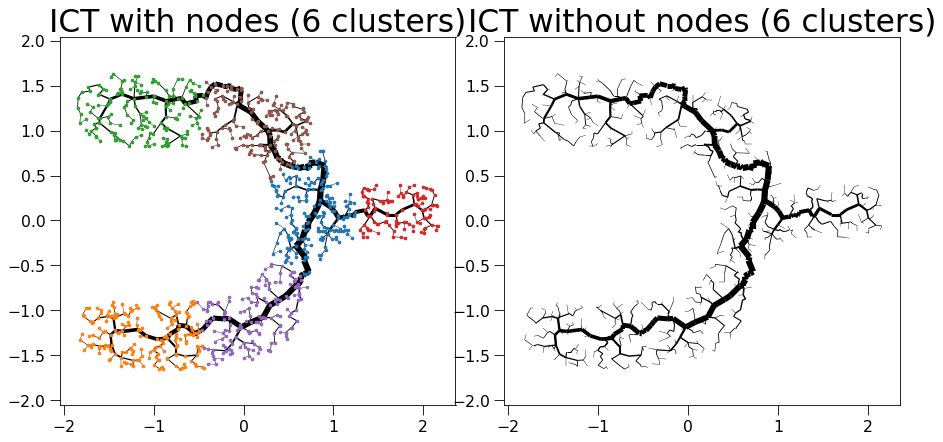

sklearn is done: 0.053871870040893555
My own part is done: 0.0008199214935302734


  0%|          | 0/7 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/751 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/751 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/116 [00:00<?, ?it/s]

update Arr 751 -> 679
update Arr 679 -> 611
update Arr 611 -> 552
update Arr 552 -> 496
update Arr 496 -> 450
update Arr 450 -> 405
update Arr 405 -> 365
update Arr 365 -> 330
update Arr 330 -> 297
update Arr 297 -> 266
update Arr 266 -> 240
update Arr 240 -> 216
update Arr 216 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 140
update Arr 140 -> 126
update Arr 126 -> 122
update Arr 122 -> 118
update Arr 118 -> 117
update Arr 117 -> 116
Final k: 11


create edgeId array:   0%|          | 0/1091 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1091 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 1091 -> 986
update Arr 986 -> 887
update Arr 887 -> 794
update Arr 794 -> 716
update Arr 716 -> 645
update Arr 645 -> 586
update Arr 586 -> 529
update Arr 529 -> 479
update Arr 479 -> 431
update Arr 431 -> 386
update Arr 386 -> 342
update Arr 342 -> 310
update Arr 310 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 202
update Arr 202 -> 183
update Arr 183 -> 179
update Arr 179 -> 174
update Arr 174 -> 172
update Arr 172 -> 170
update Arr 170 -> 169
Final k: 11


create edgeId array:   0%|          | 0/1225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/191 [00:00<?, ?it/s]

update Arr 1225 -> 1105
update Arr 1105 -> 1002
update Arr 1002 -> 907
update Arr 907 -> 824
update Arr 824 -> 746
update Arr 746 -> 675
update Arr 675 -> 613
update Arr 613 -> 553
update Arr 553 -> 501
update Arr 501 -> 451
update Arr 451 -> 408
update Arr 408 -> 370
update Arr 370 -> 333
update Arr 333 -> 302
update Arr 302 -> 272
update Arr 272 -> 246
update Arr 246 -> 215
update Arr 215 -> 201
update Arr 201 -> 196
update Arr 196 -> 194
update Arr 194 -> 192
update Arr 192 -> 191
Final k: 11


create edgeId array:   0%|          | 0/721 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/721 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 721 -> 654
update Arr 654 -> 587
update Arr 587 -> 530
update Arr 530 -> 481
update Arr 481 -> 432
update Arr 432 -> 388
update Arr 388 -> 351
update Arr 351 -> 315
update Arr 315 -> 280
update Arr 280 -> 253
update Arr 253 -> 224
update Arr 224 -> 199
update Arr 199 -> 179
update Arr 179 -> 161
update Arr 161 -> 134
update Arr 134 -> 120
update Arr 120 -> 118
update Arr 118 -> 114
update Arr 114 -> 111
update Arr 111 -> 109
update Arr 109 -> 108
Final k: 11


create edgeId array:   0%|          | 0/720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 720 -> 652
update Arr 652 -> 587
update Arr 587 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 275
update Arr 275 -> 248
update Arr 248 -> 218
update Arr 218 -> 195
update Arr 195 -> 177
update Arr 177 -> 154
update Arr 154 -> 136
update Arr 136 -> 121
update Arr 121 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/877 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/877 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/137 [00:00<?, ?it/s]

update Arr 877 -> 791
update Arr 791 -> 706
update Arr 706 -> 639
update Arr 639 -> 577
update Arr 577 -> 522
update Arr 522 -> 465
update Arr 465 -> 417
update Arr 417 -> 377
update Arr 377 -> 342
update Arr 342 -> 296
update Arr 296 -> 263
update Arr 263 -> 238
update Arr 238 -> 215
update Arr 215 -> 191
update Arr 191 -> 173
update Arr 173 -> 151
update Arr 151 -> 147
update Arr 147 -> 141
update Arr 141 -> 140
update Arr 140 -> 138
update Arr 138 -> 137
Final k: 11


create edgeId array:   0%|          | 0/1041 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1041 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 1041 -> 939
update Arr 939 -> 852
update Arr 852 -> 770
update Arr 770 -> 698
update Arr 698 -> 634
update Arr 634 -> 576
update Arr 576 -> 520
update Arr 520 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 348
update Arr 348 -> 314
update Arr 314 -> 283
update Arr 283 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 166
update Arr 166 -> 164
update Arr 164 -> 162
update Arr 162 -> 161


Patching the components together:   0%|          | 0/7 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1012 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1012 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1012 -> 999
added 5 edges early


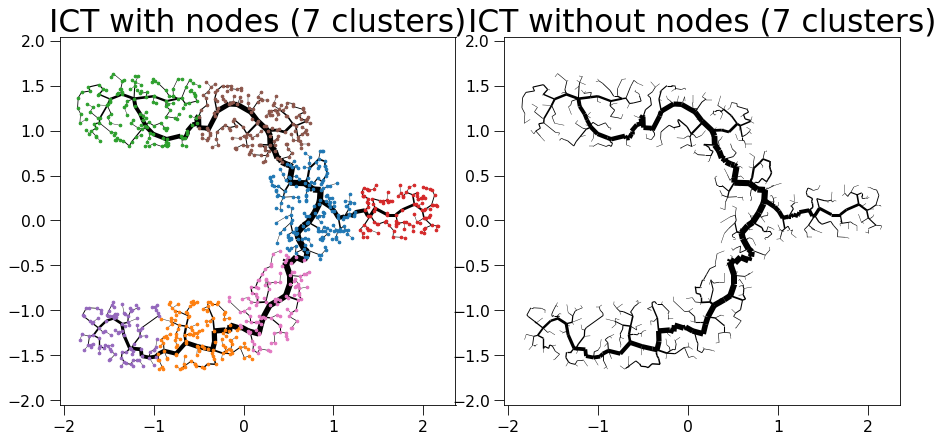

sklearn is done: 0.06787109375
My own part is done: 0.0008347034454345703


  0%|          | 0/8 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 720 -> 652
update Arr 652 -> 587
update Arr 587 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 275
update Arr 275 -> 248
update Arr 248 -> 218
update Arr 218 -> 195
update Arr 195 -> 177
update Arr 177 -> 154
update Arr 154 -> 136
update Arr 136 -> 121
update Arr 121 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/684 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/684 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 684 -> 616
update Arr 616 -> 547
update Arr 547 -> 495
update Arr 495 -> 444
update Arr 444 -> 402
update Arr 402 -> 360
update Arr 360 -> 325
update Arr 325 -> 295
update Arr 295 -> 268
update Arr 268 -> 239
update Arr 239 -> 215
update Arr 215 -> 192
update Arr 192 -> 173
update Arr 173 -> 156
update Arr 156 -> 141
update Arr 141 -> 120
update Arr 120 -> 112
update Arr 112 -> 108
update Arr 108 -> 105
update Arr 105 -> 103
update Arr 103 -> 102
Final k: 11


create edgeId array:   0%|          | 0/706 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/706 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 706 -> 639
update Arr 639 -> 575
update Arr 575 -> 511
update Arr 511 -> 463
update Arr 463 -> 418
update Arr 418 -> 377
update Arr 377 -> 341
update Arr 341 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 228
update Arr 228 -> 206
update Arr 206 -> 184
update Arr 184 -> 165
update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 121
update Arr 121 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/864 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/864 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 864 -> 776
update Arr 776 -> 704
update Arr 704 -> 638
update Arr 638 -> 579
update Arr 579 -> 524
update Arr 524 -> 474
update Arr 474 -> 426
update Arr 426 -> 383
update Arr 383 -> 346
update Arr 346 -> 308
update Arr 308 -> 274
update Arr 274 -> 242
update Arr 242 -> 219
update Arr 219 -> 195
update Arr 195 -> 177
update Arr 177 -> 157
update Arr 157 -> 146
update Arr 146 -> 140
update Arr 140 -> 139
update Arr 139 -> 137
update Arr 137 -> 136
Final k: 11


create edgeId array:   0%|          | 0/763 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/763 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/118 [00:00<?, ?it/s]

update Arr 763 -> 687
update Arr 687 -> 622
update Arr 622 -> 562
update Arr 562 -> 505
update Arr 505 -> 445
update Arr 445 -> 404
update Arr 404 -> 365
update Arr 365 -> 329
update Arr 329 -> 299
update Arr 299 -> 269
update Arr 269 -> 241
update Arr 241 -> 217
update Arr 217 -> 189
update Arr 189 -> 163
update Arr 163 -> 144
update Arr 144 -> 127
update Arr 127 -> 124
update Arr 124 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
Final k: 11


create edgeId array:   0%|          | 0/929 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/929 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/144 [00:00<?, ?it/s]

update Arr 929 -> 843
update Arr 843 -> 761
update Arr 761 -> 675
update Arr 675 -> 610
update Arr 610 -> 552
update Arr 552 -> 499
update Arr 499 -> 448
update Arr 448 -> 405
update Arr 405 -> 368
update Arr 368 -> 328
update Arr 328 -> 295
update Arr 295 -> 262
update Arr 262 -> 233
update Arr 233 -> 210
update Arr 210 -> 181
update Arr 181 -> 160
update Arr 160 -> 151
update Arr 151 -> 148
update Arr 148 -> 146
update Arr 146 -> 145
update Arr 145 -> 145
Final k: 11


create edgeId array:   0%|          | 0/692 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/692 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 692 -> 622
update Arr 622 -> 553
update Arr 553 -> 502
update Arr 502 -> 455
update Arr 455 -> 413
update Arr 413 -> 374
update Arr 374 -> 333
update Arr 333 -> 298
update Arr 298 -> 267
update Arr 267 -> 239
update Arr 239 -> 214
update Arr 214 -> 190
update Arr 190 -> 167
update Arr 167 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 112
update Arr 112 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
Final k: 11


create edgeId array:   0%|          | 0/1067 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1067 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 1067 -> 964
update Arr 964 -> 867
update Arr 867 -> 787
update Arr 787 -> 705
update Arr 705 -> 633
update Arr 633 -> 572
update Arr 572 -> 516
update Arr 516 -> 469
update Arr 469 -> 425
update Arr 425 -> 380
update Arr 380 -> 345
update Arr 345 -> 312
update Arr 312 -> 278
update Arr 278 -> 252
update Arr 252 -> 218
update Arr 218 -> 193
update Arr 193 -> 174
update Arr 174 -> 170
update Arr 170 -> 165
update Arr 165 -> 165
update Arr 165 -> 164


Patching the components together:   0%|          | 0/8 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1016 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1016 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1016 -> 999
added 6 edges early


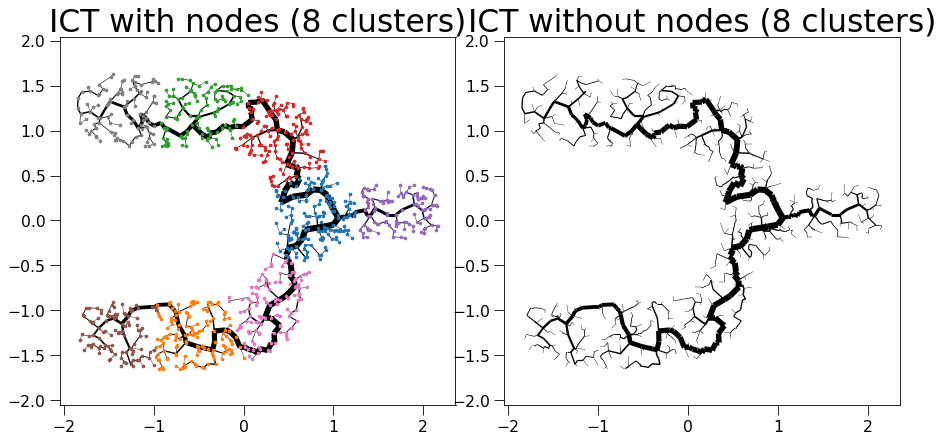

sklearn is done: 0.07253479957580566
My own part is done: 0.0005619525909423828


  0%|          | 0/9 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/856 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/856 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 856 -> 774
update Arr 774 -> 694
update Arr 694 -> 627
update Arr 627 -> 568
update Arr 568 -> 516
update Arr 516 -> 465
update Arr 465 -> 418
update Arr 418 -> 377
update Arr 377 -> 338
update Arr 338 -> 299
update Arr 299 -> 268
update Arr 268 -> 240
update Arr 240 -> 213
update Arr 213 -> 189
update Arr 189 -> 167
update Arr 167 -> 148
update Arr 148 -> 137
update Arr 137 -> 134
update Arr 134 -> 132
update Arr 132 -> 131
update Arr 131 -> 131
Final k: 11


create edgeId array:   0%|          | 0/539 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/539 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 539 -> 485
update Arr 485 -> 440
update Arr 440 -> 398
update Arr 398 -> 361
update Arr 361 -> 326
update Arr 326 -> 282
update Arr 282 -> 254
update Arr 254 -> 222
update Arr 222 -> 201
update Arr 201 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 125
update Arr 125 -> 103
update Arr 103 -> 91
update Arr 91 -> 89
update Arr 89 -> 86
update Arr 86 -> 83
update Arr 83 -> 80
Final k: 11


create edgeId array:   0%|          | 0/642 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/642 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 642 -> 573
update Arr 573 -> 520
update Arr 520 -> 463
update Arr 463 -> 420
update Arr 420 -> 381
update Arr 381 -> 343
update Arr 343 -> 306
update Arr 306 -> 278
update Arr 278 -> 251
update Arr 251 -> 227
update Arr 227 -> 205
update Arr 205 -> 184
update Arr 184 -> 165
update Arr 165 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 106
update Arr 106 -> 103
update Arr 103 -> 101
update Arr 101 -> 100
Final k: 11


create edgeId array:   0%|          | 0/692 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/692 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 692 -> 622
update Arr 622 -> 553
update Arr 553 -> 502
update Arr 502 -> 455
update Arr 455 -> 413
update Arr 413 -> 374
update Arr 374 -> 333
update Arr 333 -> 298
update Arr 298 -> 267
update Arr 267 -> 239
update Arr 239 -> 214
update Arr 214 -> 190
update Arr 190 -> 167
update Arr 167 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 112
update Arr 112 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
Final k: 11


create edgeId array:   0%|          | 0/720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 720 -> 652
update Arr 652 -> 587
update Arr 587 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 275
update Arr 275 -> 248
update Arr 248 -> 218
update Arr 218 -> 195
update Arr 195 -> 177
update Arr 177 -> 154
update Arr 154 -> 136
update Arr 136 -> 121
update Arr 121 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/621 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/621 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 621 -> 553
update Arr 553 -> 497
update Arr 497 -> 451
update Arr 451 -> 408
update Arr 408 -> 368
update Arr 368 -> 328
update Arr 328 -> 295
update Arr 295 -> 267
update Arr 267 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 118
update Arr 118 -> 104
update Arr 104 -> 104
update Arr 104 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/699 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/699 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/110 [00:00<?, ?it/s]

update Arr 699 -> 629
update Arr 629 -> 554
update Arr 554 -> 485
update Arr 485 -> 439
update Arr 439 -> 399
update Arr 399 -> 362
update Arr 362 -> 328
update Arr 328 -> 295
update Arr 295 -> 267
update Arr 267 -> 240
update Arr 240 -> 213
update Arr 213 -> 190
update Arr 190 -> 168
update Arr 168 -> 148
update Arr 148 -> 131
update Arr 131 -> 120
update Arr 120 -> 116
update Arr 116 -> 113
update Arr 113 -> 111
update Arr 111 -> 110
Final k: 11


create edgeId array:   0%|          | 0/896 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/896 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 896 -> 808
update Arr 808 -> 732
update Arr 732 -> 652
update Arr 652 -> 592
update Arr 592 -> 529
update Arr 529 -> 480
update Arr 480 -> 433
update Arr 433 -> 393
update Arr 393 -> 354
update Arr 354 -> 315
update Arr 315 -> 284
update Arr 284 -> 258
update Arr 258 -> 228
update Arr 228 -> 203
update Arr 203 -> 184
update Arr 184 -> 162
update Arr 162 -> 151
update Arr 151 -> 147
update Arr 147 -> 144
update Arr 144 -> 142
update Arr 142 -> 141
Final k: 11


create edgeId array:   0%|          | 0/755 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/755 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 755 -> 685
update Arr 685 -> 620
update Arr 620 -> 550
update Arr 550 -> 493
update Arr 493 -> 444
update Arr 444 -> 403
update Arr 403 -> 361
update Arr 361 -> 326
update Arr 326 -> 286
update Arr 286 -> 255
update Arr 255 -> 229
update Arr 229 -> 205
update Arr 205 -> 185
update Arr 185 -> 167
update Arr 167 -> 151
update Arr 151 -> 134
update Arr 134 -> 128
update Arr 128 -> 121
update Arr 121 -> 120
update Arr 120 -> 120
update Arr 120 -> 119


Patching the components together:   0%|          | 0/9 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1022 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1022 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1022 -> 999
added 7 edges early


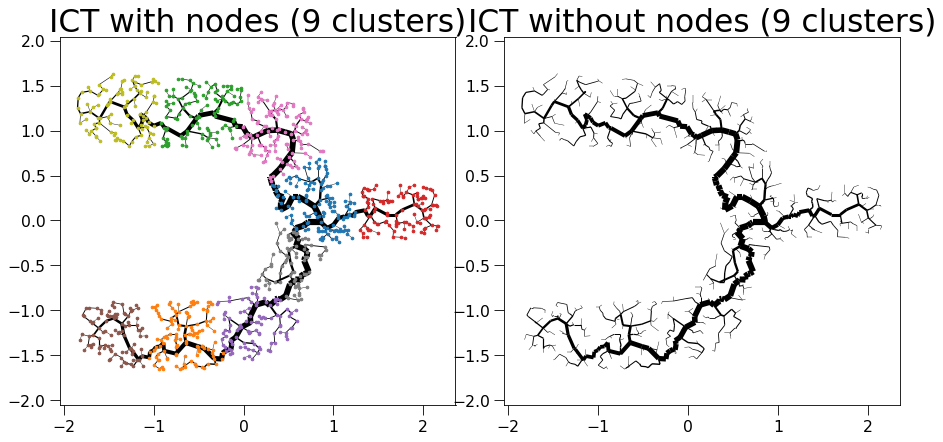

sklearn is done: 0.08899855613708496
My own part is done: 0.0006310939788818359


  0%|          | 0/10 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/621 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/621 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 621 -> 553
update Arr 553 -> 497
update Arr 497 -> 451
update Arr 451 -> 408
update Arr 408 -> 368
update Arr 368 -> 328
update Arr 328 -> 295
update Arr 295 -> 267
update Arr 267 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 118
update Arr 118 -> 104
update Arr 104 -> 104
update Arr 104 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/757 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/757 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/116 [00:00<?, ?it/s]

update Arr 757 -> 687
update Arr 687 -> 621
update Arr 621 -> 563
update Arr 563 -> 510
update Arr 510 -> 459
update Arr 459 -> 415
update Arr 415 -> 377
update Arr 377 -> 341
update Arr 341 -> 307
update Arr 307 -> 279
update Arr 279 -> 252
update Arr 252 -> 229
update Arr 229 -> 203
update Arr 203 -> 183
update Arr 183 -> 166
update Arr 166 -> 144
update Arr 144 -> 128
update Arr 128 -> 125
update Arr 125 -> 120
update Arr 120 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 117
Final k: 11


create edgeId array:   0%|          | 0/607 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/607 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 607 -> 548
update Arr 548 -> 481
update Arr 481 -> 434
update Arr 434 -> 393
update Arr 393 -> 355
update Arr 355 -> 319
update Arr 319 -> 286
update Arr 286 -> 259
update Arr 259 -> 233
update Arr 233 -> 210
update Arr 210 -> 190
update Arr 190 -> 171
update Arr 171 -> 150
update Arr 150 -> 136
update Arr 136 -> 121
update Arr 121 -> 105
update Arr 105 -> 98
update Arr 98 -> 93
update Arr 93 -> 91
update Arr 91 -> 89
Final k: 11


create edgeId array:   0%|          | 0/692 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/692 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 692 -> 622
update Arr 622 -> 553
update Arr 553 -> 502
update Arr 502 -> 455
update Arr 455 -> 413
update Arr 413 -> 374
update Arr 374 -> 333
update Arr 333 -> 298
update Arr 298 -> 267
update Arr 267 -> 239
update Arr 239 -> 214
update Arr 214 -> 190
update Arr 190 -> 167
update Arr 167 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 112
update Arr 112 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
Final k: 11


create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 515 -> 466
update Arr 466 -> 407
update Arr 407 -> 368
update Arr 368 -> 333
update Arr 333 -> 297
update Arr 297 -> 265
update Arr 265 -> 240
update Arr 240 -> 217
update Arr 217 -> 191
update Arr 191 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 122
update Arr 122 -> 106
update Arr 106 -> 93
update Arr 93 -> 88
update Arr 88 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/755 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/755 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 755 -> 685
update Arr 685 -> 620
update Arr 620 -> 550
update Arr 550 -> 493
update Arr 493 -> 444
update Arr 444 -> 403
update Arr 403 -> 361
update Arr 361 -> 326
update Arr 326 -> 286
update Arr 286 -> 255
update Arr 255 -> 229
update Arr 229 -> 205
update Arr 205 -> 185
update Arr 185 -> 167
update Arr 167 -> 151
update Arr 151 -> 134
update Arr 134 -> 128
update Arr 128 -> 121
update Arr 121 -> 120
update Arr 120 -> 120
update Arr 120 -> 119
Final k: 11


create edgeId array:   0%|          | 0/646 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/646 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 646 -> 576
update Arr 576 -> 521
update Arr 521 -> 472
update Arr 472 -> 429
update Arr 429 -> 388
update Arr 388 -> 351
update Arr 351 -> 318
update Arr 318 -> 285
update Arr 285 -> 257
update Arr 257 -> 231
update Arr 231 -> 209
update Arr 209 -> 186
update Arr 186 -> 167
update Arr 167 -> 150
update Arr 150 -> 129
update Arr 129 -> 116
update Arr 116 -> 111
update Arr 111 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
Final k: 11


create edgeId array:   0%|          | 0/560 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/560 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/87 [00:00<?, ?it/s]

update Arr 560 -> 503
update Arr 503 -> 457
update Arr 457 -> 414
update Arr 414 -> 376
update Arr 376 -> 339
update Arr 339 -> 307
update Arr 307 -> 273
update Arr 273 -> 244
update Arr 244 -> 218
update Arr 218 -> 194
update Arr 194 -> 174
update Arr 174 -> 155
update Arr 155 -> 135
update Arr 135 -> 120
update Arr 120 -> 103
update Arr 103 -> 97
update Arr 97 -> 93
update Arr 93 -> 90
update Arr 90 -> 88
update Arr 88 -> 87
Final k: 11


create edgeId array:   0%|          | 0/647 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/647 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 647 -> 588
update Arr 588 -> 534
update Arr 534 -> 484
update Arr 484 -> 434
update Arr 434 -> 392
update Arr 392 -> 355
update Arr 355 -> 321
update Arr 321 -> 291
update Arr 291 -> 264
update Arr 264 -> 234
update Arr 234 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
Final k: 11


create edgeId array:   0%|          | 0/636 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/636 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 636 -> 574
update Arr 574 -> 512
update Arr 512 -> 460
update Arr 460 -> 416
update Arr 416 -> 376
update Arr 376 -> 341
update Arr 341 -> 306
update Arr 306 -> 277
update Arr 277 -> 250
update Arr 250 -> 221
update Arr 221 -> 198
update Arr 198 -> 174
update Arr 174 -> 157
update Arr 157 -> 131
update Arr 131 -> 114
update Arr 114 -> 109
update Arr 109 -> 105
update Arr 105 -> 102
update Arr 102 -> 100
update Arr 100 -> 99


Patching the components together:   0%|          | 0/10 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1019 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1019 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1019 -> 999
added 8 edges early


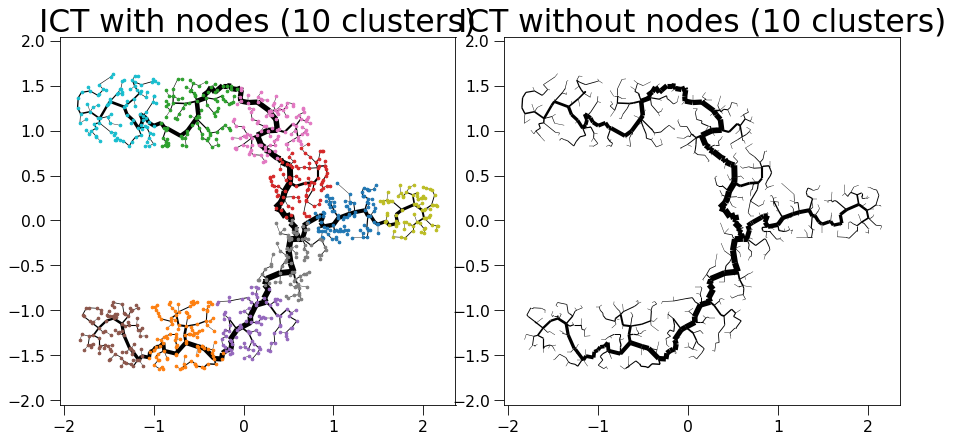

sklearn is done: 0.09716343879699707
My own part is done: 0.0007181167602539062


  0%|          | 0/11 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/714 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/714 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 714 -> 649
update Arr 649 -> 582
update Arr 582 -> 525
update Arr 525 -> 472
update Arr 472 -> 429
update Arr 429 -> 384
update Arr 384 -> 347
update Arr 347 -> 315
update Arr 315 -> 283
update Arr 283 -> 255
update Arr 255 -> 228
update Arr 228 -> 201
update Arr 201 -> 177
update Arr 177 -> 160
update Arr 160 -> 141
update Arr 141 -> 121
update Arr 121 -> 119
update Arr 119 -> 116
update Arr 116 -> 116
update Arr 116 -> 111
update Arr 111 -> 110
update Arr 110 -> 110
Final k: 11


create edgeId array:   0%|          | 0/621 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/621 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 621 -> 553
update Arr 553 -> 497
update Arr 497 -> 451
update Arr 451 -> 408
update Arr 408 -> 368
update Arr 368 -> 328
update Arr 328 -> 295
update Arr 295 -> 267
update Arr 267 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 118
update Arr 118 -> 104
update Arr 104 -> 104
update Arr 104 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/600 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/600 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 600 -> 541
update Arr 541 -> 479
update Arr 479 -> 422
update Arr 422 -> 382
update Arr 382 -> 346
update Arr 346 -> 309
update Arr 309 -> 270
update Arr 270 -> 245
update Arr 245 -> 220
update Arr 220 -> 196
update Arr 196 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 128
update Arr 128 -> 115
update Arr 115 -> 103
update Arr 103 -> 96
update Arr 96 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
Final k: 11


create edgeId array:   0%|          | 0/468 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/468 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 468 -> 420
update Arr 420 -> 374
update Arr 374 -> 338
update Arr 338 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 204
update Arr 204 -> 184
update Arr 184 -> 164
update Arr 164 -> 144
update Arr 144 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 91
update Arr 91 -> 80
update Arr 80 -> 76
update Arr 76 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
Final k: 11


create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 515 -> 466
update Arr 466 -> 407
update Arr 407 -> 368
update Arr 368 -> 333
update Arr 333 -> 297
update Arr 297 -> 265
update Arr 265 -> 240
update Arr 240 -> 217
update Arr 217 -> 191
update Arr 191 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 122
update Arr 122 -> 106
update Arr 106 -> 93
update Arr 93 -> 88
update Arr 88 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/647 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/647 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 647 -> 588
update Arr 588 -> 534
update Arr 534 -> 484
update Arr 484 -> 434
update Arr 434 -> 392
update Arr 392 -> 355
update Arr 355 -> 321
update Arr 321 -> 291
update Arr 291 -> 264
update Arr 264 -> 234
update Arr 234 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
Final k: 11


create edgeId array:   0%|          | 0/606 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/606 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 606 -> 549
update Arr 549 -> 490
update Arr 490 -> 429
update Arr 429 -> 389
update Arr 389 -> 353
update Arr 353 -> 318
update Arr 318 -> 287
update Arr 287 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 180
update Arr 180 -> 162
update Arr 162 -> 140
update Arr 140 -> 127
update Arr 127 -> 110
update Arr 110 -> 105
update Arr 105 -> 101
update Arr 101 -> 98
update Arr 98 -> 96
update Arr 96 -> 95
Final k: 11


create edgeId array:   0%|          | 0/755 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/755 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 755 -> 685
update Arr 685 -> 620
update Arr 620 -> 550
update Arr 550 -> 493
update Arr 493 -> 444
update Arr 444 -> 403
update Arr 403 -> 361
update Arr 361 -> 326
update Arr 326 -> 286
update Arr 286 -> 255
update Arr 255 -> 229
update Arr 229 -> 205
update Arr 205 -> 185
update Arr 185 -> 167
update Arr 167 -> 151
update Arr 151 -> 134
update Arr 134 -> 128
update Arr 128 -> 121
update Arr 121 -> 120
update Arr 120 -> 120
update Arr 120 -> 119
Final k: 11


create edgeId array:   0%|          | 0/489 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/489 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 489 -> 443
update Arr 443 -> 389
update Arr 389 -> 348
update Arr 348 -> 314
update Arr 314 -> 284
update Arr 284 -> 246
update Arr 246 -> 223
update Arr 223 -> 198
update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 139
update Arr 139 -> 125
update Arr 125 -> 109
update Arr 109 -> 97
update Arr 97 -> 85
update Arr 85 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/563 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/563 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 563 -> 503
update Arr 503 -> 451
update Arr 451 -> 402
update Arr 402 -> 359
update Arr 359 -> 314
update Arr 314 -> 279
update Arr 279 -> 242
update Arr 242 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 118
update Arr 118 -> 104
update Arr 104 -> 98
update Arr 98 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
Final k: 11


create edgeId array:   0%|          | 0/478 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/478 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 478 -> 425
update Arr 425 -> 371
update Arr 371 -> 319
update Arr 319 -> 289
update Arr 289 -> 261
update Arr 261 -> 236
update Arr 236 -> 211
update Arr 211 -> 191
update Arr 191 -> 172
update Arr 172 -> 151
update Arr 151 -> 137
update Arr 137 -> 120
update Arr 120 -> 108
update Arr 108 -> 92
update Arr 92 -> 81
update Arr 81 -> 77
update Arr 77 -> 74
update Arr 74 -> 72
update Arr 72 -> 71


Patching the components together:   0%|          | 0/11 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1020 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1020 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1020 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 5 edges early


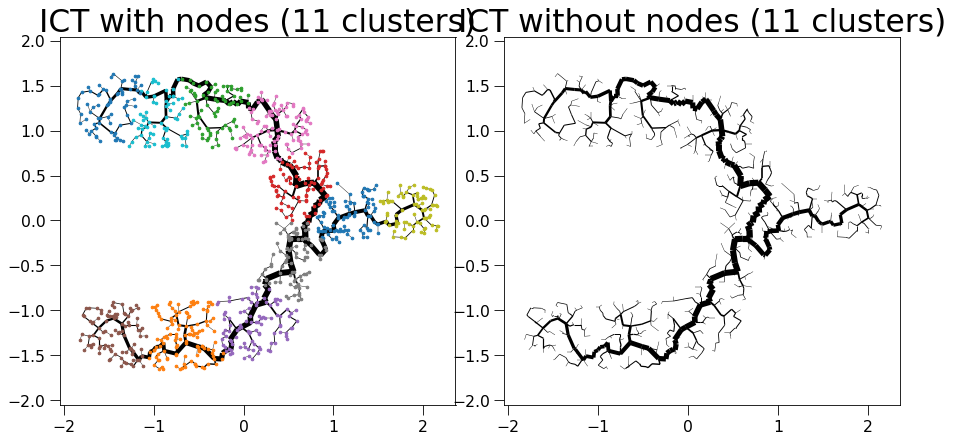

sklearn is done: 0.09138011932373047
My own part is done: 0.0006864070892333984


  0%|          | 0/12 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/489 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/489 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 489 -> 443
update Arr 443 -> 389
update Arr 389 -> 348
update Arr 348 -> 314
update Arr 314 -> 284
update Arr 284 -> 246
update Arr 246 -> 223
update Arr 223 -> 198
update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 139
update Arr 139 -> 125
update Arr 125 -> 109
update Arr 109 -> 97
update Arr 97 -> 85
update Arr 85 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/538 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/538 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 538 -> 481
update Arr 481 -> 433
update Arr 433 -> 391
update Arr 391 -> 354
update Arr 354 -> 320
update Arr 320 -> 285
update Arr 285 -> 259
update Arr 259 -> 234
update Arr 234 -> 203
update Arr 203 -> 178
update Arr 178 -> 156
update Arr 156 -> 139
update Arr 139 -> 123
update Arr 123 -> 108
update Arr 108 -> 96
update Arr 96 -> 91
update Arr 91 -> 87
update Arr 87 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
Final k: 11


create edgeId array:   0%|          | 0/540 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/540 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 540 -> 480
update Arr 480 -> 423
update Arr 423 -> 383
update Arr 383 -> 345
update Arr 345 -> 308
update Arr 308 -> 274
update Arr 274 -> 242
update Arr 242 -> 219
update Arr 219 -> 194
update Arr 194 -> 163
update Arr 163 -> 145
update Arr 145 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 83
Final k: 11


create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 453 -> 404
update Arr 404 -> 359
update Arr 359 -> 326
update Arr 326 -> 295
update Arr 295 -> 264
update Arr 264 -> 234
update Arr 234 -> 211
update Arr 211 -> 185
update Arr 185 -> 161
update Arr 161 -> 141
update Arr 141 -> 127
update Arr 127 -> 113
update Arr 113 -> 102
update Arr 102 -> 88
update Arr 88 -> 77
update Arr 77 -> 73
update Arr 73 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/621 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/621 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 621 -> 553
update Arr 553 -> 497
update Arr 497 -> 451
update Arr 451 -> 408
update Arr 408 -> 368
update Arr 368 -> 328
update Arr 328 -> 295
update Arr 295 -> 267
update Arr 267 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 118
update Arr 118 -> 104
update Arr 104 -> 104
update Arr 104 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 515 -> 465
update Arr 465 -> 417
update Arr 417 -> 379
update Arr 379 -> 340
update Arr 340 -> 308
update Arr 308 -> 274
update Arr 274 -> 248
update Arr 248 -> 225
update Arr 225 -> 202
update Arr 202 -> 182
update Arr 182 -> 160
update Arr 160 -> 144
update Arr 144 -> 130
update Arr 130 -> 111
update Arr 111 -> 100
update Arr 100 -> 86
update Arr 86 -> 86
update Arr 86 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
Final k: 11


create edgeId array:   0%|          | 0/502 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/502 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 502 -> 448
update Arr 448 -> 403
update Arr 403 -> 364
update Arr 364 -> 327
update Arr 327 -> 294
update Arr 294 -> 263
update Arr 263 -> 237
update Arr 237 -> 212
update Arr 212 -> 192
update Arr 192 -> 172
update Arr 172 -> 156
update Arr 156 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 89
update Arr 89 -> 86
update Arr 86 -> 82
update Arr 82 -> 77
update Arr 77 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/641 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/641 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 641 -> 576
update Arr 576 -> 515
update Arr 515 -> 460
update Arr 460 -> 410
update Arr 410 -> 366
update Arr 366 -> 331
update Arr 331 -> 299
update Arr 299 -> 266
update Arr 266 -> 240
update Arr 240 -> 217
update Arr 217 -> 194
update Arr 194 -> 175
update Arr 175 -> 157
update Arr 157 -> 141
update Arr 141 -> 126
update Arr 126 -> 110
update Arr 110 -> 109
update Arr 109 -> 105
update Arr 105 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
Final k: 11


create edgeId array:   0%|          | 0/517 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/517 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 517 -> 469
update Arr 469 -> 402
update Arr 402 -> 365
update Arr 365 -> 317
update Arr 317 -> 283
update Arr 283 -> 253
update Arr 253 -> 225
update Arr 225 -> 204
update Arr 204 -> 183
update Arr 183 -> 157
update Arr 157 -> 141
update Arr 141 -> 128
update Arr 128 -> 111
update Arr 111 -> 89
update Arr 89 -> 86
update Arr 86 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/493 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/493 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 493 -> 446
update Arr 446 -> 400
update Arr 400 -> 348
update Arr 348 -> 313
update Arr 313 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 203
update Arr 203 -> 182
update Arr 182 -> 164
update Arr 164 -> 145
update Arr 145 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 88
update Arr 88 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
update Arr 80 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
Final k: 11


create edgeId array:   0%|          | 0/686 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/686 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/105 [00:00<?, ?it/s]

update Arr 686 -> 620
update Arr 620 -> 554
update Arr 554 -> 486
update Arr 486 -> 441
update Arr 441 -> 398
update Arr 398 -> 358
update Arr 358 -> 324
update Arr 324 -> 293
update Arr 293 -> 260
update Arr 260 -> 229
update Arr 229 -> 198
update Arr 198 -> 176
update Arr 176 -> 157
update Arr 157 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 114
update Arr 114 -> 109
update Arr 109 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
update Arr 106 -> 106


Patching the components together:   0%|          | 0/12 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1021 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1021 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1021 -> 999
added 10 edges early


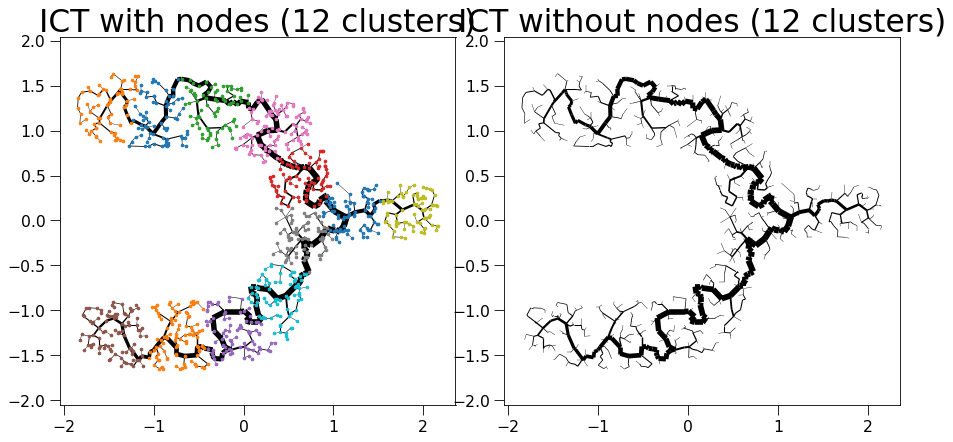

sklearn is done: 0.09128022193908691
My own part is done: 0.0009374618530273438


  0%|          | 0/13 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/475 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/475 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 475 -> 427
update Arr 427 -> 381
update Arr 381 -> 345
update Arr 345 -> 304
update Arr 304 -> 276
update Arr 276 -> 248
update Arr 248 -> 225
update Arr 225 -> 199
update Arr 199 -> 180
update Arr 180 -> 158
update Arr 158 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 77
update Arr 77 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/374 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/374 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 374 -> 335
update Arr 335 -> 301
update Arr 301 -> 270
update Arr 270 -> 245
update Arr 245 -> 220
update Arr 220 -> 199
update Arr 199 -> 179
update Arr 179 -> 160
update Arr 160 -> 144
update Arr 144 -> 130
update Arr 130 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 76
update Arr 76 -> 67
update Arr 67 -> 63
update Arr 63 -> 58
update Arr 58 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/514 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/514 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 514 -> 459
update Arr 459 -> 400
update Arr 400 -> 358
update Arr 358 -> 325
update Arr 325 -> 293
update Arr 293 -> 265
update Arr 265 -> 240
update Arr 240 -> 217
update Arr 217 -> 197
update Arr 197 -> 173
update Arr 173 -> 155
update Arr 155 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 86
update Arr 86 -> 86
update Arr 86 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
Final k: 11


create edgeId array:   0%|          | 0/561 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/561 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 561 -> 501
update Arr 501 -> 443
update Arr 443 -> 397
update Arr 397 -> 356
update Arr 356 -> 317
update Arr 317 -> 281
update Arr 281 -> 255
update Arr 255 -> 231
update Arr 231 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 152
update Arr 152 -> 138
update Arr 138 -> 122
update Arr 122 -> 109
update Arr 109 -> 95
update Arr 95 -> 95
update Arr 95 -> 90
update Arr 90 -> 88
update Arr 88 -> 86
update Arr 86 -> 85
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/516 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/516 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 516 -> 459
update Arr 459 -> 416
update Arr 416 -> 375
update Arr 375 -> 331
update Arr 331 -> 300
update Arr 300 -> 268
update Arr 268 -> 237
update Arr 237 -> 214
update Arr 214 -> 188
update Arr 188 -> 168
update Arr 168 -> 150
update Arr 150 -> 135
update Arr 135 -> 120
update Arr 120 -> 101
update Arr 101 -> 89
update Arr 89 -> 85
update Arr 85 -> 82
update Arr 82 -> 80
update Arr 80 -> 79
Final k: 11


create edgeId array:   0%|          | 0/516 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/516 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 516 -> 465
update Arr 465 -> 418
update Arr 418 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 280
update Arr 280 -> 249
update Arr 249 -> 221
update Arr 221 -> 197
update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 127
update Arr 127 -> 114
update Arr 114 -> 101
update Arr 101 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
Final k: 11


create edgeId array:   0%|          | 0/514 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/514 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 514 -> 465
update Arr 465 -> 420
update Arr 420 -> 366
update Arr 366 -> 329
update Arr 329 -> 295
update Arr 295 -> 264
update Arr 264 -> 238
update Arr 238 -> 216
update Arr 216 -> 195
update Arr 195 -> 170
update Arr 170 -> 148
update Arr 148 -> 134
update Arr 134 -> 114
update Arr 114 -> 101
update Arr 101 -> 91
update Arr 91 -> 86
update Arr 86 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 484 -> 429
update Arr 429 -> 383
update Arr 383 -> 319
update Arr 319 -> 284
update Arr 284 -> 256
update Arr 256 -> 228
update Arr 228 -> 204
update Arr 204 -> 182
update Arr 182 -> 164
update Arr 164 -> 141
update Arr 141 -> 125
update Arr 125 -> 111
update Arr 111 -> 95
update Arr 95 -> 83
update Arr 83 -> 81
update Arr 81 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/475 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/475 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 475 -> 422
update Arr 422 -> 374
update Arr 374 -> 338
update Arr 338 -> 306
update Arr 306 -> 275
update Arr 275 -> 243
update Arr 243 -> 219
update Arr 219 -> 197
update Arr 197 -> 177
update Arr 177 -> 156
update Arr 156 -> 141
update Arr 141 -> 125
update Arr 125 -> 108
update Arr 108 -> 94
update Arr 94 -> 84
update Arr 84 -> 80
update Arr 80 -> 76
update Arr 76 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/505 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/505 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 505 -> 458
update Arr 458 -> 405
update Arr 405 -> 361
update Arr 361 -> 326
update Arr 326 -> 293
update Arr 293 -> 266
update Arr 266 -> 240
update Arr 240 -> 218
update Arr 218 -> 197
update Arr 197 -> 178
update Arr 178 -> 156
update Arr 156 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 85
update Arr 85 -> 82
update Arr 82 -> 80
update Arr 80 -> 79
Final k: 11


create edgeId array:   0%|          | 0/414 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/414 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 414 -> 358
update Arr 358 -> 322
update Arr 322 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 208
update Arr 208 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 76
update Arr 76 -> 71
update Arr 71 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/641 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/641 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 641 -> 578
update Arr 578 -> 523
update Arr 523 -> 449
update Arr 449 -> 404
update Arr 404 -> 364
update Arr 364 -> 328
update Arr 328 -> 297
update Arr 297 -> 269
update Arr 269 -> 241
update Arr 241 -> 215
update Arr 215 -> 188
update Arr 188 -> 164
update Arr 164 -> 149
update Arr 149 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 104
update Arr 104 -> 101
update Arr 101 -> 99
update Arr 99 -> 98


Patching the components together:   0%|          | 0/13 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1017 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1017 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1017 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


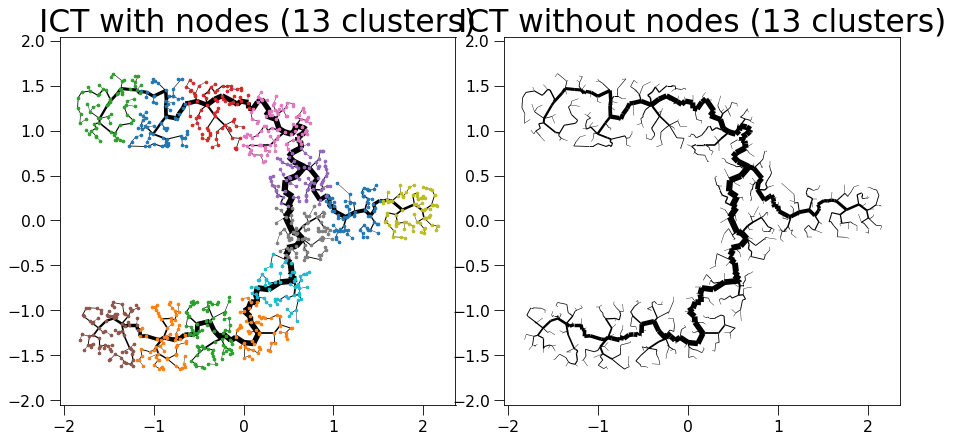

sklearn is done: 0.10210323333740234
My own part is done: 0.0007543563842773438


  0%|          | 0/14 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/493 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/493 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 493 -> 446
update Arr 446 -> 400
update Arr 400 -> 348
update Arr 348 -> 313
update Arr 313 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 203
update Arr 203 -> 182
update Arr 182 -> 164
update Arr 164 -> 145
update Arr 145 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 88
update Arr 88 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
update Arr 80 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
Final k: 11


create edgeId array:   0%|          | 0/531 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/531 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 531 -> 471
update Arr 471 -> 414
update Arr 414 -> 374
update Arr 374 -> 336
update Arr 336 -> 299
update Arr 299 -> 265
update Arr 265 -> 233
update Arr 233 -> 211
update Arr 211 -> 186
update Arr 186 -> 162
update Arr 162 -> 144
update Arr 144 -> 126
update Arr 126 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 88
update Arr 88 -> 85
update Arr 85 -> 83
update Arr 83 -> 82
Final k: 11


create edgeId array:   0%|          | 0/561 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/561 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 561 -> 504
update Arr 504 -> 447
update Arr 447 -> 406
update Arr 406 -> 369
update Arr 369 -> 335
update Arr 335 -> 299
update Arr 299 -> 271
update Arr 271 -> 243
update Arr 243 -> 219
update Arr 219 -> 194
update Arr 194 -> 173
update Arr 173 -> 157
update Arr 157 -> 139
update Arr 139 -> 114
update Arr 114 -> 96
update Arr 96 -> 93
update Arr 93 -> 91
update Arr 91 -> 88
update Arr 88 -> 86
update Arr 86 -> 85
Final k: 11


create edgeId array:   0%|          | 0/464 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/464 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 464 -> 418
update Arr 418 -> 375
update Arr 375 -> 328
update Arr 328 -> 293
update Arr 293 -> 265
update Arr 265 -> 234
update Arr 234 -> 211
update Arr 211 -> 190
update Arr 190 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 117
update Arr 117 -> 103
update Arr 103 -> 89
update Arr 89 -> 78
update Arr 78 -> 74
update Arr 74 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/324 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/324 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 324 -> 286
update Arr 286 -> 248
update Arr 248 -> 222
update Arr 222 -> 201
update Arr 201 -> 174
update Arr 174 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 113
update Arr 113 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 66
update Arr 66 -> 57
update Arr 57 -> 54
update Arr 54 -> 51
update Arr 51 -> 48
update Arr 48 -> 48
Final k: 11


create edgeId array:   0%|          | 0/511 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/511 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 511 -> 463
update Arr 463 -> 408
update Arr 408 -> 360
update Arr 360 -> 326
update Arr 326 -> 291
update Arr 291 -> 262
update Arr 262 -> 238
update Arr 238 -> 211
update Arr 211 -> 189
update Arr 189 -> 167
update Arr 167 -> 149
update Arr 149 -> 132
update Arr 132 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 82
update Arr 82 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/420 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/420 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 420 -> 377
update Arr 377 -> 333
update Arr 333 -> 301
update Arr 301 -> 266
update Arr 266 -> 238
update Arr 238 -> 209
update Arr 209 -> 188
update Arr 188 -> 163
update Arr 163 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 81
update Arr 81 -> 70
update Arr 70 -> 68
update Arr 68 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
Final k: 11


create edgeId array:   0%|          | 0/523 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/523 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 523 -> 475
update Arr 475 -> 428
update Arr 428 -> 386
update Arr 386 -> 343
update Arr 343 -> 311
update Arr 311 -> 281
update Arr 281 -> 246
update Arr 246 -> 220
update Arr 220 -> 196
update Arr 196 -> 176
update Arr 176 -> 159
update Arr 159 -> 143
update Arr 143 -> 124
update Arr 124 -> 107
update Arr 107 -> 97
update Arr 97 -> 92
update Arr 92 -> 88
update Arr 88 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
Final k: 11


create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 472 -> 426
update Arr 426 -> 369
update Arr 369 -> 328
update Arr 328 -> 283
update Arr 283 -> 254
update Arr 254 -> 228
update Arr 228 -> 202
update Arr 202 -> 178
update Arr 178 -> 160
update Arr 160 -> 141
update Arr 141 -> 128
update Arr 128 -> 114
update Arr 114 -> 94
update Arr 94 -> 82
update Arr 82 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/444 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/444 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 444 -> 402
update Arr 402 -> 357
update Arr 357 -> 324
update Arr 324 -> 287
update Arr 287 -> 258
update Arr 258 -> 229
update Arr 229 -> 203
update Arr 203 -> 180
update Arr 180 -> 162
update Arr 162 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 81
update Arr 81 -> 78
update Arr 78 -> 74
update Arr 74 -> 70
update Arr 70 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 453 -> 404
update Arr 404 -> 359
update Arr 359 -> 326
update Arr 326 -> 295
update Arr 295 -> 264
update Arr 264 -> 234
update Arr 234 -> 211
update Arr 211 -> 185
update Arr 185 -> 161
update Arr 161 -> 141
update Arr 141 -> 127
update Arr 127 -> 113
update Arr 113 -> 102
update Arr 102 -> 88
update Arr 88 -> 77
update Arr 77 -> 73
update Arr 73 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/499 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/499 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 499 -> 450
update Arr 450 -> 408
update Arr 408 -> 370
update Arr 370 -> 334
update Arr 334 -> 303
update Arr 303 -> 273
update Arr 273 -> 245
update Arr 245 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 121
update Arr 121 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/335 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/335 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 335 -> 290
update Arr 290 -> 243
update Arr 243 -> 218
update Arr 218 -> 197
update Arr 197 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 113
update Arr 113 -> 102
update Arr 102 -> 89
update Arr 89 -> 74
update Arr 74 -> 66
update Arr 66 -> 60
update Arr 60 -> 55
update Arr 55 -> 53
update Arr 53 -> 50


Patching the components together:   0%|          | 0/14 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1022 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1022 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1022 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


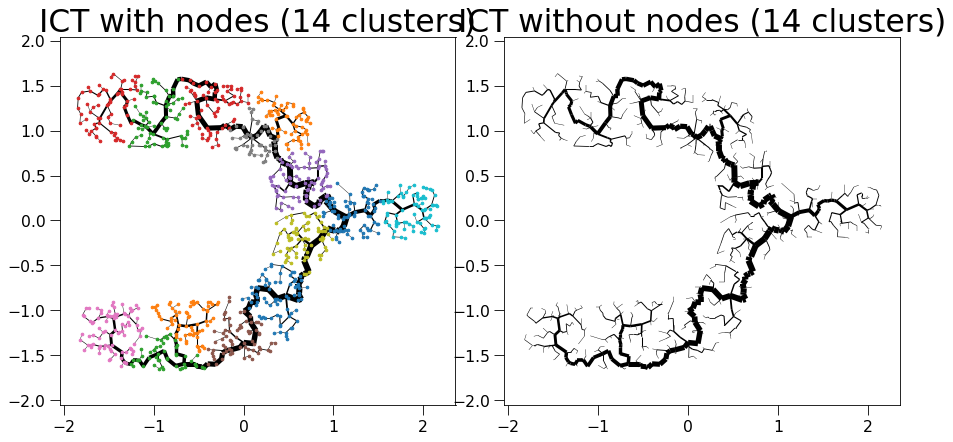

sklearn is done: 0.10178756713867188
My own part is done: 0.0005774497985839844


  0%|          | 0/15 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/483 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/483 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 483 -> 433
update Arr 433 -> 382
update Arr 382 -> 345
update Arr 345 -> 311
update Arr 311 -> 282
update Arr 282 -> 251
update Arr 251 -> 222
update Arr 222 -> 201
update Arr 201 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/498 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/498 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 498 -> 445
update Arr 445 -> 401
update Arr 401 -> 361
update Arr 361 -> 328
update Arr 328 -> 296
update Arr 296 -> 267
update Arr 267 -> 241
update Arr 241 -> 216
update Arr 216 -> 192
update Arr 192 -> 168
update Arr 168 -> 146
update Arr 146 -> 129
update Arr 129 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 84
update Arr 84 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/449 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/449 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 449 -> 408
update Arr 408 -> 355
update Arr 355 -> 321
update Arr 321 -> 290
update Arr 290 -> 259
update Arr 259 -> 231
update Arr 231 -> 204
update Arr 204 -> 184
update Arr 184 -> 153
update Arr 153 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 88
update Arr 88 -> 75
update Arr 75 -> 72
update Arr 72 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/363 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/363 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 363 -> 323
update Arr 323 -> 291
update Arr 291 -> 253
update Arr 253 -> 226
update Arr 226 -> 201
update Arr 201 -> 179
update Arr 179 -> 155
update Arr 155 -> 139
update Arr 139 -> 119
update Arr 119 -> 108
update Arr 108 -> 95
update Arr 95 -> 80
update Arr 80 -> 66
update Arr 66 -> 57
update Arr 57 -> 56
update Arr 56 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/324 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/324 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 324 -> 281
update Arr 281 -> 245
update Arr 245 -> 220
update Arr 220 -> 197
update Arr 197 -> 176
update Arr 176 -> 154
update Arr 154 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 84
update Arr 84 -> 73
update Arr 73 -> 61
update Arr 61 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/378 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/378 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 378 -> 338
update Arr 338 -> 305
update Arr 305 -> 271
update Arr 271 -> 244
update Arr 244 -> 221
update Arr 221 -> 197
update Arr 197 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 121
update Arr 121 -> 109
update Arr 109 -> 96
update Arr 96 -> 80
update Arr 80 -> 70
update Arr 70 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
update Arr 56 -> 56
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/438 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/438 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 438 -> 391
update Arr 391 -> 350
update Arr 350 -> 315
update Arr 315 -> 284
update Arr 284 -> 258
update Arr 258 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 169
update Arr 169 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 69
update Arr 69 -> 67
update Arr 67 -> 66
Final k: 11


create edgeId array:   0%|          | 0/574 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/574 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 574 -> 518
update Arr 518 -> 469
update Arr 469 -> 409
update Arr 409 -> 370
update Arr 370 -> 336
update Arr 336 -> 302
update Arr 302 -> 270
update Arr 270 -> 238
update Arr 238 -> 215
update Arr 215 -> 192
update Arr 192 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 120
update Arr 120 -> 105
update Arr 105 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
Final k: 11


create edgeId array:   0%|          | 0/403 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/403 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 403 -> 360
update Arr 360 -> 321
update Arr 321 -> 281
update Arr 281 -> 254
update Arr 254 -> 220
update Arr 220 -> 199
update Arr 199 -> 177
update Arr 177 -> 153
update Arr 153 -> 135
update Arr 135 -> 117
update Arr 117 -> 106
update Arr 106 -> 94
update Arr 94 -> 76
update Arr 76 -> 73
update Arr 73 -> 69
update Arr 69 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
Final k: 11


create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 484 -> 434
update Arr 434 -> 387
update Arr 387 -> 350
update Arr 350 -> 314
update Arr 314 -> 284
update Arr 284 -> 251
update Arr 251 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/373 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/373 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 373 -> 339
update Arr 339 -> 300
update Arr 300 -> 259
update Arr 259 -> 231
update Arr 231 -> 209
update Arr 209 -> 187
update Arr 187 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 116
update Arr 116 -> 103
update Arr 103 -> 88
update Arr 88 -> 73
update Arr 73 -> 65
update Arr 65 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/395 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/395 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 395 -> 358
update Arr 358 -> 323
update Arr 323 -> 291
update Arr 291 -> 257
update Arr 257 -> 230
update Arr 230 -> 206
update Arr 206 -> 183
update Arr 183 -> 163
update Arr 163 -> 146
update Arr 146 -> 129
update Arr 129 -> 114
update Arr 114 -> 99
update Arr 99 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/495 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/495 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 495 -> 438
update Arr 438 -> 374
update Arr 374 -> 337
update Arr 337 -> 304
update Arr 304 -> 276
update Arr 276 -> 248
update Arr 248 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 162
update Arr 162 -> 145
update Arr 145 -> 129
update Arr 129 -> 113
update Arr 113 -> 101
update Arr 101 -> 87
update Arr 87 -> 82
update Arr 82 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/366 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/366 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 366 -> 330
update Arr 330 -> 283
update Arr 283 -> 255
update Arr 255 -> 226
update Arr 226 -> 203
update Arr 203 -> 178
update Arr 178 -> 159
update Arr 159 -> 138
update Arr 138 -> 122
update Arr 122 -> 108
update Arr 108 -> 92
update Arr 92 -> 82
update Arr 82 -> 70
update Arr 70 -> 64
update Arr 64 -> 64
update Arr 64 -> 59
update Arr 59 -> 57
update Arr 57 -> 55
update Arr 55 -> 54


Patching the components together:   0%|          | 0/15 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1026 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1026 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1026 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


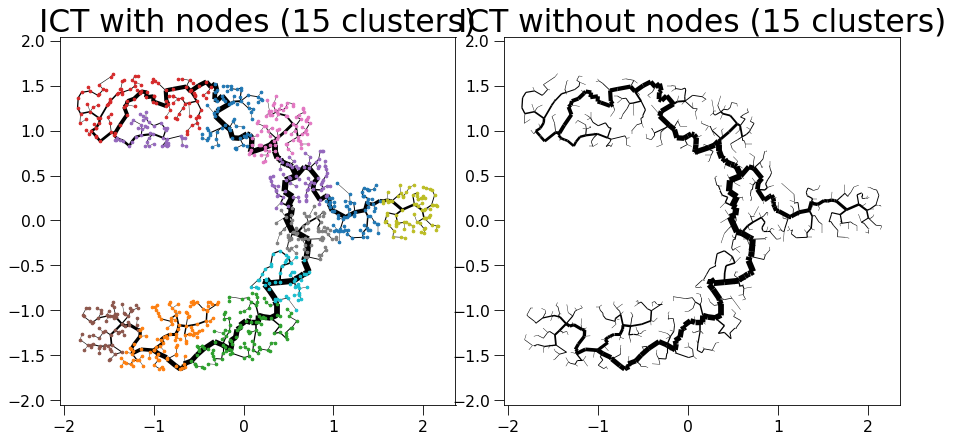

sklearn is done: 0.10458731651306152
My own part is done: 0.0009295940399169922


  0%|          | 0/16 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 291 -> 248
update Arr 248 -> 223
update Arr 223 -> 201
update Arr 201 -> 180
update Arr 180 -> 155
update Arr 155 -> 138
update Arr 138 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 64
update Arr 64 -> 54
update Arr 54 -> 49
update Arr 49 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/413 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/413 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 413 -> 370
update Arr 370 -> 333
update Arr 333 -> 301
update Arr 301 -> 269
update Arr 269 -> 240
update Arr 240 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 155
update Arr 155 -> 137
update Arr 137 -> 122
update Arr 122 -> 108
update Arr 108 -> 87
update Arr 87 -> 78
update Arr 78 -> 71
update Arr 71 -> 69
update Arr 69 -> 66
update Arr 66 -> 64
update Arr 64 -> 63
Final k: 11


create edgeId array:   0%|          | 0/519 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/519 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 519 -> 469
update Arr 469 -> 424
update Arr 424 -> 385
update Arr 385 -> 346
update Arr 346 -> 312
update Arr 312 -> 279
update Arr 279 -> 253
update Arr 253 -> 226
update Arr 226 -> 200
update Arr 200 -> 177
update Arr 177 -> 156
update Arr 156 -> 136
update Arr 136 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 90
update Arr 90 -> 84
update Arr 84 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 270 -> 240
update Arr 240 -> 214
update Arr 214 -> 193
update Arr 193 -> 173
update Arr 173 -> 155
update Arr 155 -> 138
update Arr 138 -> 121
update Arr 121 -> 102
update Arr 102 -> 82
update Arr 82 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 45
update Arr 45 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/470 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/470 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 470 -> 421
update Arr 421 -> 377
update Arr 377 -> 342
update Arr 342 -> 305
update Arr 305 -> 277
update Arr 277 -> 246
update Arr 246 -> 220
update Arr 220 -> 197
update Arr 197 -> 174
update Arr 174 -> 154
update Arr 154 -> 134
update Arr 134 -> 116
update Arr 116 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 76
update Arr 76 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/480 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/480 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 480 -> 431
update Arr 431 -> 388
update Arr 388 -> 350
update Arr 350 -> 316
update Arr 316 -> 287
update Arr 287 -> 260
update Arr 260 -> 235
update Arr 235 -> 213
update Arr 213 -> 187
update Arr 187 -> 167
update Arr 167 -> 148
update Arr 148 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 86
update Arr 86 -> 80
update Arr 80 -> 76
update Arr 76 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
Final k: 11


create edgeId array:   0%|          | 0/470 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/470 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 470 -> 425
update Arr 425 -> 380
update Arr 380 -> 338
update Arr 338 -> 301
update Arr 301 -> 273
update Arr 273 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 129
update Arr 129 -> 117
update Arr 117 -> 99
update Arr 99 -> 89
update Arr 89 -> 81
update Arr 81 -> 78
update Arr 78 -> 74
update Arr 74 -> 71
Final k: 11


create edgeId array:   0%|          | 0/346 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/346 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 346 -> 311
update Arr 311 -> 280
update Arr 280 -> 246
update Arr 246 -> 222
update Arr 222 -> 201
update Arr 201 -> 171
update Arr 171 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 101
update Arr 101 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
update Arr 51 -> 51
Final k: 11


create edgeId array:   0%|          | 0/360 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/360 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 360 -> 316
update Arr 316 -> 278
update Arr 278 -> 250
update Arr 250 -> 227
update Arr 227 -> 205
update Arr 205 -> 183
update Arr 183 -> 166
update Arr 166 -> 144
update Arr 144 -> 128
update Arr 128 -> 115
update Arr 115 -> 90
update Arr 90 -> 74
update Arr 74 -> 63
update Arr 63 -> 59
update Arr 59 -> 57
update Arr 57 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/524 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/524 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 524 -> 464
update Arr 464 -> 407
update Arr 407 -> 369
update Arr 369 -> 331
update Arr 331 -> 298
update Arr 298 -> 267
update Arr 267 -> 242
update Arr 242 -> 214
update Arr 214 -> 193
update Arr 193 -> 173
update Arr 173 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 91
update Arr 91 -> 87
update Arr 87 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
Final k: 11


create edgeId array:   0%|          | 0/400 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/400 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 400 -> 354
update Arr 354 -> 308
update Arr 308 -> 279
update Arr 279 -> 253
update Arr 253 -> 229
update Arr 229 -> 204
update Arr 204 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 73
update Arr 73 -> 69
update Arr 69 -> 66
update Arr 66 -> 64
update Arr 64 -> 63
Final k: 11


create edgeId array:   0%|          | 0/414 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/414 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 414 -> 358
update Arr 358 -> 322
update Arr 322 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 208
update Arr 208 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 76
update Arr 76 -> 71
update Arr 71 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/343 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/343 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 343 -> 307
update Arr 307 -> 271
update Arr 271 -> 245
update Arr 245 -> 218
update Arr 218 -> 198
update Arr 198 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 60
update Arr 60 -> 55
update Arr 55 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/426 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/426 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 426 -> 378
update Arr 378 -> 331
update Arr 331 -> 292
update Arr 292 -> 263
update Arr 263 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 174
update Arr 174 -> 146
update Arr 146 -> 130
update Arr 130 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 76
update Arr 76 -> 72
update Arr 72 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 294 -> 252
update Arr 252 -> 225
update Arr 225 -> 200
update Arr 200 -> 179
update Arr 179 -> 159
update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 71
update Arr 71 -> 58
update Arr 58 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45


Patching the components together:   0%|          | 0/16 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1027 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1027 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1027 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


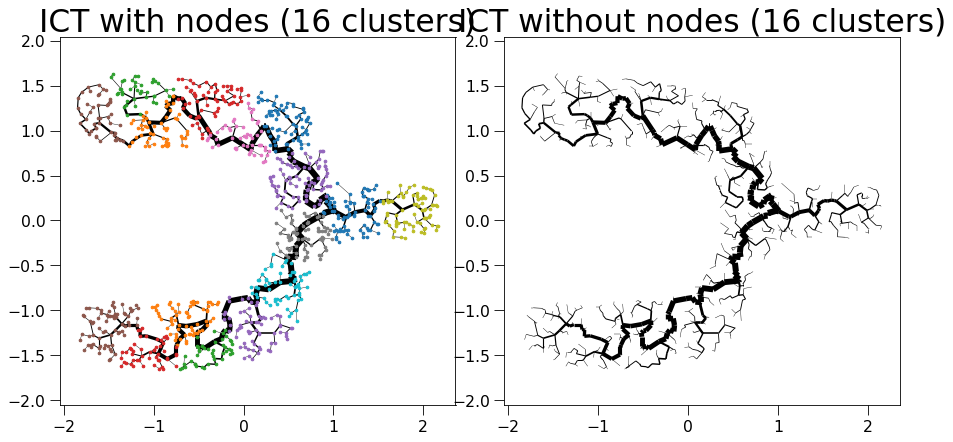

sklearn is done: 0.10730552673339844
My own part is done: 0.0004210472106933594


  0%|          | 0/17 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/336 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/336 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 336 -> 302
update Arr 302 -> 262
update Arr 262 -> 235
update Arr 235 -> 213
update Arr 213 -> 183
update Arr 183 -> 163
update Arr 163 -> 148
update Arr 148 -> 130
update Arr 130 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 81
update Arr 81 -> 67
update Arr 67 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/414 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/414 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 414 -> 358
update Arr 358 -> 322
update Arr 322 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 208
update Arr 208 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 76
update Arr 76 -> 71
update Arr 71 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/338 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/338 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 338 -> 303
update Arr 303 -> 264
update Arr 264 -> 239
update Arr 239 -> 210
update Arr 210 -> 187
update Arr 187 -> 168
update Arr 168 -> 146
update Arr 146 -> 127
update Arr 127 -> 114
update Arr 114 -> 102
update Arr 102 -> 88
update Arr 88 -> 72
update Arr 72 -> 62
update Arr 62 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/457 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/457 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 457 -> 412
update Arr 412 -> 358
update Arr 358 -> 323
update Arr 323 -> 290
update Arr 290 -> 252
update Arr 252 -> 220
update Arr 220 -> 199
update Arr 199 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 125
update Arr 125 -> 103
update Arr 103 -> 92
update Arr 92 -> 81
update Arr 81 -> 77
update Arr 77 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
update Arr 71 -> 71
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 387 -> 338
update Arr 338 -> 302
update Arr 302 -> 269
update Arr 269 -> 239
update Arr 239 -> 217
update Arr 217 -> 193
update Arr 193 -> 173
update Arr 173 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 96
update Arr 96 -> 85
update Arr 85 -> 74
update Arr 74 -> 69
update Arr 69 -> 65
update Arr 65 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 476 -> 425
update Arr 425 -> 374
update Arr 374 -> 339
update Arr 339 -> 308
update Arr 308 -> 278
update Arr 278 -> 250
update Arr 250 -> 221
update Arr 221 -> 200
update Arr 200 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 128
update Arr 128 -> 116
update Arr 116 -> 101
update Arr 101 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
Final k: 11


create edgeId array:   0%|          | 0/509 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/509 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 509 -> 461
update Arr 461 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 87
update Arr 87 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/357 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/357 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 357 -> 323
update Arr 323 -> 283
update Arr 283 -> 253
update Arr 253 -> 229
update Arr 229 -> 207
update Arr 207 -> 184
update Arr 184 -> 166
update Arr 166 -> 149
update Arr 149 -> 129
update Arr 129 -> 109
update Arr 109 -> 96
update Arr 96 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 61
update Arr 61 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 319 -> 283
update Arr 283 -> 241
update Arr 241 -> 212
update Arr 212 -> 183
update Arr 183 -> 164
update Arr 164 -> 146
update Arr 146 -> 130
update Arr 130 -> 115
update Arr 115 -> 98
update Arr 98 -> 82
update Arr 82 -> 74
update Arr 74 -> 64
update Arr 64 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/494 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/494 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 494 -> 445
update Arr 445 -> 401
update Arr 401 -> 361
update Arr 361 -> 322
update Arr 322 -> 290
update Arr 290 -> 260
update Arr 260 -> 234
update Arr 234 -> 211
update Arr 211 -> 190
update Arr 190 -> 168
update Arr 168 -> 152
update Arr 152 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
update Arr 76 -> 74
update Arr 74 -> 73
Final k: 11


create edgeId array:   0%|          | 0/366 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/366 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 366 -> 331
update Arr 331 -> 286
update Arr 286 -> 257
update Arr 257 -> 228
update Arr 228 -> 203
update Arr 203 -> 184
update Arr 184 -> 163
update Arr 163 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 107
update Arr 107 -> 93
update Arr 93 -> 84
update Arr 84 -> 70
update Arr 70 -> 65
update Arr 65 -> 61
update Arr 61 -> 57
update Arr 57 -> 55
Final k: 11


create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 294 -> 252
update Arr 252 -> 225
update Arr 225 -> 200
update Arr 200 -> 179
update Arr 179 -> 159
update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 71
update Arr 71 -> 58
update Arr 58 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/456 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/456 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 456 -> 410
update Arr 410 -> 363
update Arr 363 -> 328
update Arr 328 -> 293
update Arr 293 -> 263
update Arr 263 -> 238
update Arr 238 -> 212
update Arr 212 -> 191
update Arr 191 -> 170
update Arr 170 -> 148
update Arr 148 -> 131
update Arr 131 -> 116
update Arr 116 -> 104
update Arr 104 -> 88
update Arr 88 -> 80
update Arr 80 -> 75
update Arr 75 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/409 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/409 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 409 -> 360
update Arr 360 -> 324
update Arr 324 -> 294
update Arr 294 -> 265
update Arr 265 -> 235
update Arr 235 -> 210
update Arr 210 -> 186
update Arr 186 -> 165
update Arr 165 -> 145
update Arr 145 -> 129
update Arr 129 -> 117
update Arr 117 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 69
update Arr 69 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
Final k: 11


create edgeId array:   0%|          | 0/344 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/344 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 344 -> 300
update Arr 300 -> 264
update Arr 264 -> 237
update Arr 237 -> 210
update Arr 210 -> 186
update Arr 186 -> 161
update Arr 161 -> 143
update Arr 143 -> 128
update Arr 128 -> 115
update Arr 115 -> 98
update Arr 98 -> 85
update Arr 85 -> 72
update Arr 72 -> 65
update Arr 65 -> 61
update Arr 61 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/303 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 303 -> 261
update Arr 261 -> 220
update Arr 220 -> 194
update Arr 194 -> 176
update Arr 176 -> 158
update Arr 158 -> 139
update Arr 139 -> 124
update Arr 124 -> 109
update Arr 109 -> 95
update Arr 95 -> 84
update Arr 84 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 50
update Arr 50 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/281 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/281 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 281 -> 252
update Arr 252 -> 213
update Arr 213 -> 189
update Arr 189 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 71
update Arr 71 -> 62
update Arr 62 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 43
update Arr 43 -> 42


Patching the components together:   0%|          | 0/17 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1031 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1031 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1031 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000


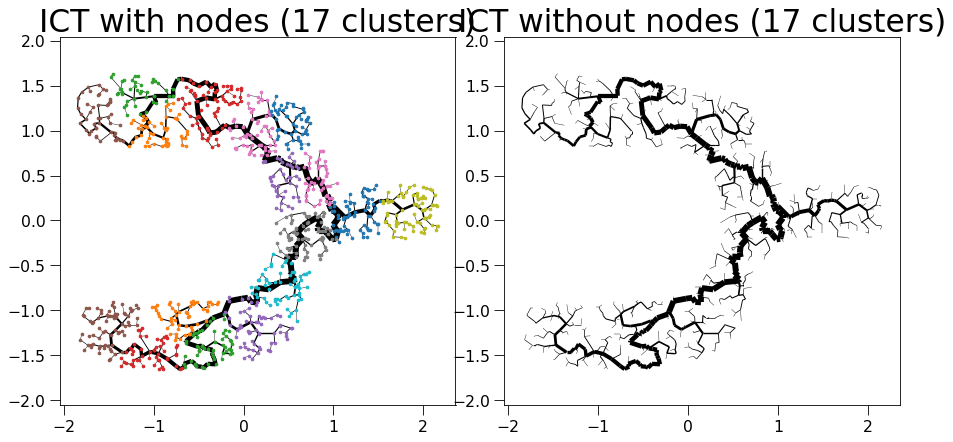

sklearn is done: 0.12031006813049316
My own part is done: 0.0006275177001953125


  0%|          | 0/18 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/393 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/393 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 393 -> 339
update Arr 339 -> 295
update Arr 295 -> 268
update Arr 268 -> 242
update Arr 242 -> 217
update Arr 217 -> 194
update Arr 194 -> 175
update Arr 175 -> 154
update Arr 154 -> 135
update Arr 135 -> 118
update Arr 118 -> 102
update Arr 102 -> 85
update Arr 85 -> 68
update Arr 68 -> 65
update Arr 65 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 313 -> 271
update Arr 271 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 173
update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 125
update Arr 125 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 69
update Arr 69 -> 58
update Arr 58 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 313 -> 283
update Arr 283 -> 235
update Arr 235 -> 201
update Arr 201 -> 180
update Arr 180 -> 162
update Arr 162 -> 145
update Arr 145 -> 130
update Arr 130 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 56
update Arr 56 -> 51
update Arr 51 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/296 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/296 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 296 -> 264
update Arr 264 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 173
update Arr 173 -> 152
update Arr 152 -> 132
update Arr 132 -> 117
update Arr 117 -> 104
update Arr 104 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 59
update Arr 59 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/446 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/446 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 446 -> 398
update Arr 398 -> 354
update Arr 354 -> 320
update Arr 320 -> 288
update Arr 288 -> 256
update Arr 256 -> 228
update Arr 228 -> 205
update Arr 205 -> 182
update Arr 182 -> 164
update Arr 164 -> 149
update Arr 149 -> 133
update Arr 133 -> 119
update Arr 119 -> 103
update Arr 103 -> 87
update Arr 87 -> 78
update Arr 78 -> 74
update Arr 74 -> 69
update Arr 69 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/440 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/440 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 440 -> 395
update Arr 395 -> 336
update Arr 336 -> 305
update Arr 305 -> 274
update Arr 274 -> 248
update Arr 248 -> 224
update Arr 224 -> 197
update Arr 197 -> 175
update Arr 175 -> 157
update Arr 157 -> 135
update Arr 135 -> 122
update Arr 122 -> 109
update Arr 109 -> 99
update Arr 99 -> 83
update Arr 83 -> 73
update Arr 73 -> 71
update Arr 71 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/299 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/299 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 299 -> 260
update Arr 260 -> 233
update Arr 233 -> 211
update Arr 211 -> 189
update Arr 189 -> 169
update Arr 169 -> 153
update Arr 153 -> 134
update Arr 134 -> 121
update Arr 121 -> 107
update Arr 107 -> 91
update Arr 91 -> 82
update Arr 82 -> 70
update Arr 70 -> 60
update Arr 60 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/444 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/444 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 444 -> 395
update Arr 395 -> 351
update Arr 351 -> 304
update Arr 304 -> 272
update Arr 272 -> 247
update Arr 247 -> 220
update Arr 220 -> 197
update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 91
update Arr 91 -> 79
update Arr 79 -> 75
update Arr 75 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/470 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/470 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 470 -> 421
update Arr 421 -> 377
update Arr 377 -> 342
update Arr 342 -> 305
update Arr 305 -> 277
update Arr 277 -> 246
update Arr 246 -> 220
update Arr 220 -> 197
update Arr 197 -> 174
update Arr 174 -> 154
update Arr 154 -> 134
update Arr 134 -> 116
update Arr 116 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 76
update Arr 76 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/427 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/427 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 427 -> 384
update Arr 384 -> 349
update Arr 349 -> 316
update Arr 316 -> 287
update Arr 287 -> 258
update Arr 258 -> 229
update Arr 229 -> 199
update Arr 199 -> 179
update Arr 179 -> 161
update Arr 161 -> 140
update Arr 140 -> 123
update Arr 123 -> 108
update Arr 108 -> 90
update Arr 90 -> 78
update Arr 78 -> 75
update Arr 75 -> 71
update Arr 71 -> 67
update Arr 67 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 321 -> 280
update Arr 280 -> 247
update Arr 247 -> 215
update Arr 215 -> 191
update Arr 191 -> 171
update Arr 171 -> 154
update Arr 154 -> 133
update Arr 133 -> 120
update Arr 120 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 300 -> 266
update Arr 266 -> 230
update Arr 230 -> 202
update Arr 202 -> 181
update Arr 181 -> 164
update Arr 164 -> 149
update Arr 149 -> 131
update Arr 131 -> 113
update Arr 113 -> 97
update Arr 97 -> 87
update Arr 87 -> 73
update Arr 73 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 46
update Arr 46 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/305 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/305 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 305 -> 272
update Arr 272 -> 243
update Arr 243 -> 214
update Arr 214 -> 192
update Arr 192 -> 171
update Arr 171 -> 152
update Arr 152 -> 135
update Arr 135 -> 118
update Arr 118 -> 104
update Arr 104 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 47
Final k: 11


create edgeId array:   0%|          | 0/288 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/288 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 288 -> 253
update Arr 253 -> 219
update Arr 219 -> 191
update Arr 191 -> 167
update Arr 167 -> 149
update Arr 149 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 46
update Arr 46 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/407 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/407 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 407 -> 358
update Arr 358 -> 318
update Arr 318 -> 289
update Arr 289 -> 262
update Arr 262 -> 237
update Arr 237 -> 214
update Arr 214 -> 193
update Arr 193 -> 170
update Arr 170 -> 150
update Arr 150 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 60
Final k: 11


create edgeId array:   0%|          | 0/394 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/394 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 394 -> 350
update Arr 350 -> 318
update Arr 318 -> 289
update Arr 289 -> 259
update Arr 259 -> 227
update Arr 227 -> 202
update Arr 202 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 132
update Arr 132 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 75
update Arr 75 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/298 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/298 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 298 -> 251
update Arr 251 -> 227
update Arr 227 -> 205
update Arr 205 -> 183
update Arr 183 -> 164
update Arr 164 -> 149
update Arr 149 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 59
update Arr 59 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/373 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/373 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 373 -> 332
update Arr 332 -> 282
update Arr 282 -> 256
update Arr 256 -> 230
update Arr 230 -> 208
update Arr 208 -> 187
update Arr 187 -> 166
update Arr 166 -> 149
update Arr 149 -> 131
update Arr 131 -> 119
update Arr 119 -> 101
update Arr 101 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 64
update Arr 64 -> 61
update Arr 61 -> 59
update Arr 59 -> 58


Patching the components together:   0%|          | 0/18 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1036 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1036 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1036 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


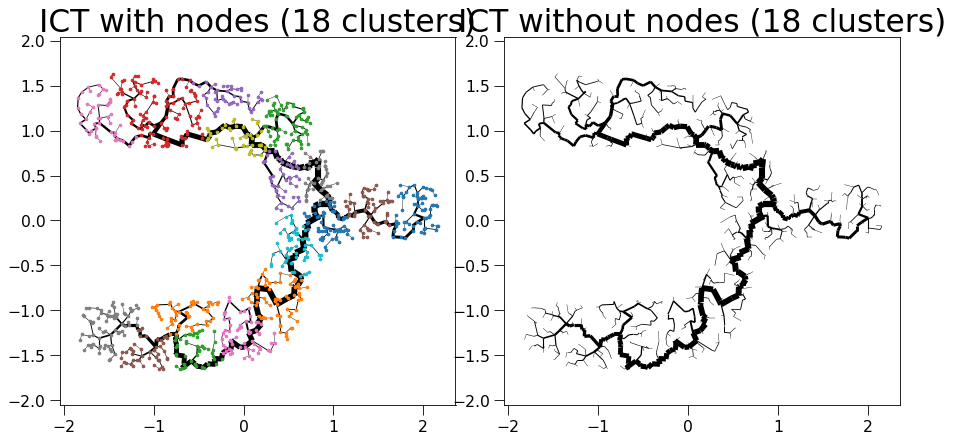

sklearn is done: 0.11770367622375488
My own part is done: 0.0010504722595214844


  0%|          | 0/19 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/423 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/423 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 423 -> 377
update Arr 377 -> 333
update Arr 333 -> 298
update Arr 298 -> 267
update Arr 267 -> 238
update Arr 238 -> 211
update Arr 211 -> 188
update Arr 188 -> 168
update Arr 168 -> 150
update Arr 150 -> 133
update Arr 133 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 72
update Arr 72 -> 68
update Arr 68 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
Final k: 11


create edgeId array:   0%|          | 0/433 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/433 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 433 -> 375
update Arr 375 -> 326
update Arr 326 -> 292
update Arr 292 -> 264
update Arr 264 -> 236
update Arr 236 -> 214
update Arr 214 -> 194
update Arr 194 -> 173
update Arr 173 -> 152
update Arr 152 -> 121
update Arr 121 -> 106
update Arr 106 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 69
update Arr 69 -> 66
update Arr 66 -> 64
update Arr 64 -> 63
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/333 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/333 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 333 -> 297
update Arr 297 -> 265
update Arr 265 -> 239
update Arr 239 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 124
update Arr 124 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 243 -> 218
update Arr 218 -> 191
update Arr 191 -> 162
update Arr 162 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 71
update Arr 71 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 387 -> 351
update Arr 351 -> 316
update Arr 316 -> 284
update Arr 284 -> 252
update Arr 252 -> 229
update Arr 229 -> 208
update Arr 208 -> 188
update Arr 188 -> 168
update Arr 168 -> 152
update Arr 152 -> 133
update Arr 133 -> 120
update Arr 120 -> 101
update Arr 101 -> 91
update Arr 91 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 291 -> 249
update Arr 249 -> 219
update Arr 219 -> 194
update Arr 194 -> 175
update Arr 175 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 79
update Arr 79 -> 67
update Arr 67 -> 58
update Arr 58 -> 53
update Arr 53 -> 50
update Arr 50 -> 45
update Arr 45 -> 44
update Arr 44 -> 44
Final k: 11


create edgeId array:   0%|          | 0/483 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/483 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 483 -> 433
update Arr 433 -> 382
update Arr 382 -> 347
update Arr 347 -> 313
update Arr 313 -> 282
update Arr 282 -> 250
update Arr 250 -> 226
update Arr 226 -> 196
update Arr 196 -> 176
update Arr 176 -> 159
update Arr 159 -> 142
update Arr 142 -> 125
update Arr 125 -> 102
update Arr 102 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 228
update Arr 228 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/399 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/399 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 399 -> 359
update Arr 359 -> 316
update Arr 316 -> 271
update Arr 271 -> 241
update Arr 241 -> 215
update Arr 215 -> 191
update Arr 191 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 111
update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/418 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/418 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 418 -> 379
update Arr 379 -> 335
update Arr 335 -> 287
update Arr 287 -> 255
update Arr 255 -> 228
update Arr 228 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 69
update Arr 69 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
Final k: 11


create edgeId array:   0%|          | 0/473 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/473 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 473 -> 427
update Arr 427 -> 387
update Arr 387 -> 351
update Arr 351 -> 317
update Arr 317 -> 287
update Arr 287 -> 255
update Arr 255 -> 230
update Arr 230 -> 202
update Arr 202 -> 178
update Arr 178 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 80
update Arr 80 -> 80
update Arr 80 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
Final k: 11


create edgeId array:   0%|          | 0/303 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 303 -> 265
update Arr 265 -> 237
update Arr 237 -> 210
update Arr 210 -> 189
update Arr 189 -> 165
update Arr 165 -> 148
update Arr 148 -> 134
update Arr 134 -> 118
update Arr 118 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 72
update Arr 72 -> 61
update Arr 61 -> 52
update Arr 52 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/403 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/403 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 403 -> 355
update Arr 355 -> 309
update Arr 309 -> 275
update Arr 275 -> 245
update Arr 245 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 156
update Arr 156 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 98
update Arr 98 -> 82
update Arr 82 -> 74
update Arr 74 -> 64
update Arr 64 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
update Arr 60 -> 60
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 197
update Arr 197 -> 176
update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/342 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/342 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 342 -> 305
update Arr 305 -> 274
update Arr 274 -> 245
update Arr 245 -> 217
update Arr 217 -> 196
update Arr 196 -> 176
update Arr 176 -> 155
update Arr 155 -> 139
update Arr 139 -> 125
update Arr 125 -> 111
update Arr 111 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 147
update Arr 147 -> 130
update Arr 130 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 383 -> 343
update Arr 343 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 227
update Arr 227 -> 203
update Arr 203 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 69
update Arr 69 -> 67
update Arr 67 -> 67
update Arr 67 -> 64
update Arr 64 -> 60
update Arr 60 -> 57


Patching the components together:   0%|          | 0/19 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1034 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1034 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1034 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


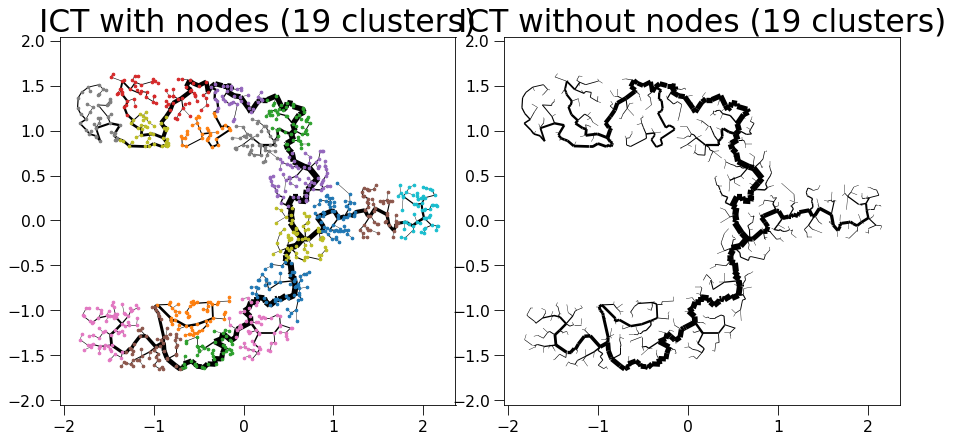

sklearn is done: 0.12905049324035645
My own part is done: 0.0007991790771484375


  0%|          | 0/20 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/281 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/281 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 281 -> 252
update Arr 252 -> 213
update Arr 213 -> 189
update Arr 189 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 71
update Arr 71 -> 62
update Arr 62 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/463 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/463 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 463 -> 412
update Arr 412 -> 368
update Arr 368 -> 333
update Arr 333 -> 292
update Arr 292 -> 261
update Arr 261 -> 237
update Arr 237 -> 212
update Arr 212 -> 187
update Arr 187 -> 167
update Arr 167 -> 150
update Arr 150 -> 133
update Arr 133 -> 115
update Arr 115 -> 101
update Arr 101 -> 89
update Arr 89 -> 77
update Arr 77 -> 75
update Arr 75 -> 72
update Arr 72 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 397 -> 358
update Arr 358 -> 321
update Arr 321 -> 286
update Arr 286 -> 259
update Arr 259 -> 233
update Arr 233 -> 208
update Arr 208 -> 189
update Arr 189 -> 165
update Arr 165 -> 146
update Arr 146 -> 132
update Arr 132 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 71
update Arr 71 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/356 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/356 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 356 -> 323
update Arr 323 -> 284
update Arr 284 -> 256
update Arr 256 -> 228
update Arr 228 -> 201
update Arr 201 -> 178
update Arr 178 -> 161
update Arr 161 -> 143
update Arr 143 -> 127
update Arr 127 -> 114
update Arr 114 -> 98
update Arr 98 -> 89
update Arr 89 -> 74
update Arr 74 -> 62
update Arr 62 -> 59
update Arr 59 -> 55
update Arr 55 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/333 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/333 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 333 -> 297
update Arr 297 -> 265
update Arr 265 -> 239
update Arr 239 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 124
update Arr 124 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 307 -> 257
update Arr 257 -> 231
update Arr 231 -> 208
update Arr 208 -> 188
update Arr 188 -> 165
update Arr 165 -> 143
update Arr 143 -> 125
update Arr 125 -> 112
update Arr 112 -> 98
update Arr 98 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 56
update Arr 56 -> 52
update Arr 52 -> 48
update Arr 48 -> 46
Final k: 11


create edgeId array:   0%|          | 0/382 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/382 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 382 -> 343
update Arr 343 -> 311
update Arr 311 -> 280
update Arr 280 -> 249
update Arr 249 -> 222
update Arr 222 -> 198
update Arr 198 -> 173
update Arr 173 -> 155
update Arr 155 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 97
update Arr 97 -> 79
update Arr 79 -> 65
update Arr 65 -> 63
update Arr 63 -> 63
update Arr 63 -> 61
update Arr 61 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 319 -> 289
update Arr 289 -> 241
update Arr 241 -> 219
update Arr 219 -> 195
update Arr 195 -> 177
update Arr 177 -> 153
update Arr 153 -> 137
update Arr 137 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 62
update Arr 62 -> 57
update Arr 57 -> 52
update Arr 52 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/385 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/385 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 385 -> 335
update Arr 335 -> 302
update Arr 302 -> 261
update Arr 261 -> 233
update Arr 233 -> 207
update Arr 207 -> 188
update Arr 188 -> 166
update Arr 166 -> 145
update Arr 145 -> 129
update Arr 129 -> 113
update Arr 113 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 65
update Arr 65 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 383 -> 335
update Arr 335 -> 288
update Arr 288 -> 261
update Arr 261 -> 231
update Arr 231 -> 205
update Arr 205 -> 186
update Arr 186 -> 164
update Arr 164 -> 147
update Arr 147 -> 132
update Arr 132 -> 111
update Arr 111 -> 95
update Arr 95 -> 85
update Arr 85 -> 75
update Arr 75 -> 69
update Arr 69 -> 62
update Arr 62 -> 61
update Arr 61 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 204 -> 183
update Arr 183 -> 161
update Arr 161 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 100
update Arr 100 -> 85
update Arr 85 -> 76
update Arr 76 -> 64
update Arr 64 -> 58
update Arr 58 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 250 -> 221
update Arr 221 -> 199
update Arr 199 -> 177
update Arr 177 -> 154
update Arr 154 -> 135
update Arr 135 -> 120
update Arr 120 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 307 -> 261
update Arr 261 -> 230
update Arr 230 -> 205
update Arr 205 -> 183
update Arr 183 -> 165
update Arr 165 -> 147
update Arr 147 -> 131
update Arr 131 -> 115
update Arr 115 -> 101
update Arr 101 -> 86
update Arr 86 -> 77
update Arr 77 -> 67
update Arr 67 -> 56
update Arr 56 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 274 -> 235
update Arr 235 -> 203
update Arr 203 -> 178
update Arr 178 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 73
update Arr 73 -> 59
update Arr 59 -> 53
update Arr 53 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
Final k: 11


create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 318 -> 281
update Arr 281 -> 248
update Arr 248 -> 225
update Arr 225 -> 199
update Arr 199 -> 179
update Arr 179 -> 157
update Arr 157 -> 140
update Arr 140 -> 126
update Arr 126 -> 106
update Arr 106 -> 93
update Arr 93 -> 81
update Arr 81 -> 64
update Arr 64 -> 57
update Arr 57 -> 53
update Arr 53 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/330 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/330 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 330 -> 297
update Arr 297 -> 264
update Arr 264 -> 239
update Arr 239 -> 216
update Arr 216 -> 194
update Arr 194 -> 176
update Arr 176 -> 151
update Arr 151 -> 137
update Arr 137 -> 122
update Arr 122 -> 101
update Arr 101 -> 85
update Arr 85 -> 76
update Arr 76 -> 63
update Arr 63 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
update Arr 49 -> 49
Final k: 11


create edgeId array:   0%|          | 0/232 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/232 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 232 -> 205
update Arr 205 -> 182
update Arr 182 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 95
update Arr 95 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 36
update Arr 36 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 276 -> 242
update Arr 242 -> 213
update Arr 213 -> 186
update Arr 186 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 119
update Arr 119 -> 102
update Arr 102 -> 89
update Arr 89 -> 80
update Arr 80 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 355 -> 311
update Arr 311 -> 265
update Arr 265 -> 238
update Arr 238 -> 216
update Arr 216 -> 194
update Arr 194 -> 175
update Arr 175 -> 152
update Arr 152 -> 135
update Arr 135 -> 119
update Arr 119 -> 98
update Arr 98 -> 86
update Arr 86 -> 74
update Arr 74 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/399 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/399 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 399 -> 359
update Arr 359 -> 316
update Arr 316 -> 271
update Arr 271 -> 241
update Arr 241 -> 215
update Arr 215 -> 191
update Arr 191 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 111
update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 59
update Arr 59 -> 58


Patching the components together:   0%|          | 0/20 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1033 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1033 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1033 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


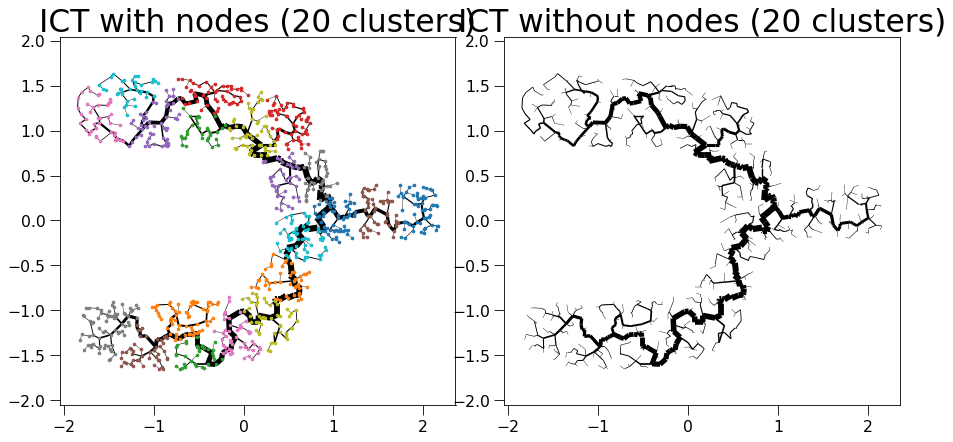

sklearn is done: 0.13003039360046387
My own part is done: 0.0008990764617919922


  0%|          | 0/21 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/372 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/372 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 372 -> 337
update Arr 337 -> 289
update Arr 289 -> 248
update Arr 248 -> 223
update Arr 223 -> 202
update Arr 202 -> 179
update Arr 179 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 100
update Arr 100 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 62
update Arr 62 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/402 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/402 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 402 -> 361
update Arr 361 -> 326
update Arr 326 -> 290
update Arr 290 -> 260
update Arr 260 -> 226
update Arr 226 -> 200
update Arr 200 -> 176
update Arr 176 -> 153
update Arr 153 -> 134
update Arr 134 -> 120
update Arr 120 -> 104
update Arr 104 -> 87
update Arr 87 -> 77
update Arr 77 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/351 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/351 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 351 -> 316
update Arr 316 -> 284
update Arr 284 -> 255
update Arr 255 -> 228
update Arr 228 -> 202
update Arr 202 -> 181
update Arr 181 -> 153
update Arr 153 -> 138
update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 86
update Arr 86 -> 75
update Arr 75 -> 64
update Arr 64 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 262 -> 229
update Arr 229 -> 204
update Arr 204 -> 179
update Arr 179 -> 160
update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 74
update Arr 74 -> 65
update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 235 -> 196
update Arr 196 -> 177
update Arr 177 -> 158
update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 51
update Arr 51 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/368 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/368 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 368 -> 313
update Arr 313 -> 284
update Arr 284 -> 256
update Arr 256 -> 227
update Arr 227 -> 202
update Arr 202 -> 176
update Arr 176 -> 157
update Arr 157 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 80
update Arr 80 -> 69
update Arr 69 -> 63
update Arr 63 -> 62
update Arr 62 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 147
update Arr 147 -> 130
update Arr 130 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 270 -> 238
update Arr 238 -> 204
update Arr 204 -> 181
update Arr 181 -> 156
update Arr 156 -> 139
update Arr 139 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 66
update Arr 66 -> 58
update Arr 58 -> 52
update Arr 52 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/303 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/303 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 303 -> 261
update Arr 261 -> 225
update Arr 225 -> 199
update Arr 199 -> 178
update Arr 178 -> 161
update Arr 161 -> 145
update Arr 145 -> 129
update Arr 129 -> 113
update Arr 113 -> 99
update Arr 99 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/372 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/372 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 372 -> 330
update Arr 330 -> 282
update Arr 282 -> 254
update Arr 254 -> 224
update Arr 224 -> 201
update Arr 201 -> 176
update Arr 176 -> 156
update Arr 156 -> 138
update Arr 138 -> 121
update Arr 121 -> 108
update Arr 108 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 66
update Arr 66 -> 60
update Arr 60 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/314 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/314 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 314 -> 274
update Arr 274 -> 244
update Arr 244 -> 218
update Arr 218 -> 196
update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 141
update Arr 141 -> 122
update Arr 122 -> 103
update Arr 103 -> 93
update Arr 93 -> 79
update Arr 79 -> 66
update Arr 66 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/445 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/445 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 445 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 295
update Arr 295 -> 264
update Arr 264 -> 239
update Arr 239 -> 214
update Arr 214 -> 190
update Arr 190 -> 169
update Arr 169 -> 153
update Arr 153 -> 135
update Arr 135 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 78
update Arr 78 -> 73
update Arr 73 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/248 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/248 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 248 -> 223
update Arr 223 -> 196
update Arr 196 -> 168
update Arr 168 -> 150
update Arr 150 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 48
update Arr 48 -> 46
update Arr 46 -> 41
update Arr 41 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/399 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/399 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 399 -> 359
update Arr 359 -> 316
update Arr 316 -> 271
update Arr 271 -> 241
update Arr 241 -> 215
update Arr 215 -> 191
update Arr 191 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 111
update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/232 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/232 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 232 -> 201
update Arr 201 -> 177
update Arr 177 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 109
update Arr 109 -> 95
update Arr 95 -> 80
update Arr 80 -> 67
update Arr 67 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/334 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/334 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 334 -> 289
update Arr 289 -> 261
update Arr 261 -> 231
update Arr 231 -> 209
update Arr 209 -> 187
update Arr 187 -> 168
update Arr 168 -> 148
update Arr 148 -> 131
update Arr 131 -> 116
update Arr 116 -> 101
update Arr 101 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 56
update Arr 56 -> 56
update Arr 56 -> 51
update Arr 51 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 128
update Arr 128 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/310 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/310 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 310 -> 266
update Arr 266 -> 228
update Arr 228 -> 206
update Arr 206 -> 187
update Arr 187 -> 167
update Arr 167 -> 146
update Arr 146 -> 129
update Arr 129 -> 114
update Arr 114 -> 99
update Arr 99 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 52
update Arr 52 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 228
update Arr 228 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/327 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/327 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 327 -> 297
update Arr 297 -> 248
update Arr 248 -> 225
update Arr 225 -> 199
update Arr 199 -> 178
update Arr 178 -> 161
update Arr 161 -> 140
update Arr 140 -> 126
update Arr 126 -> 111
update Arr 111 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 63
update Arr 63 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49


Patching the components together:   0%|          | 0/21 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1039 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1039 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1039 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


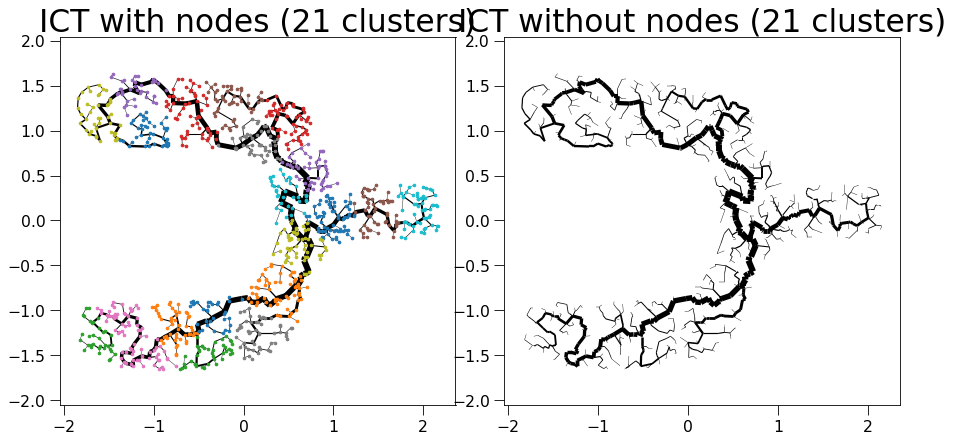

sklearn is done: 0.13155579566955566
My own part is done: 0.0009033679962158203


  0%|          | 0/22 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 307 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 54
update Arr 54 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/470 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/470 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 470 -> 421
update Arr 421 -> 377
update Arr 377 -> 342
update Arr 342 -> 305
update Arr 305 -> 277
update Arr 277 -> 246
update Arr 246 -> 220
update Arr 220 -> 197
update Arr 197 -> 174
update Arr 174 -> 154
update Arr 154 -> 134
update Arr 134 -> 116
update Arr 116 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 76
update Arr 76 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/440 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/440 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 440 -> 395
update Arr 395 -> 336
update Arr 336 -> 305
update Arr 305 -> 274
update Arr 274 -> 248
update Arr 248 -> 224
update Arr 224 -> 197
update Arr 197 -> 175
update Arr 175 -> 157
update Arr 157 -> 135
update Arr 135 -> 122
update Arr 122 -> 109
update Arr 109 -> 99
update Arr 99 -> 83
update Arr 83 -> 73
update Arr 73 -> 71
update Arr 71 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 244 -> 206
update Arr 206 -> 183
update Arr 183 -> 159
update Arr 159 -> 143
update Arr 143 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 321 -> 280
update Arr 280 -> 247
update Arr 247 -> 215
update Arr 215 -> 191
update Arr 191 -> 171
update Arr 171 -> 154
update Arr 154 -> 133
update Arr 133 -> 120
update Arr 120 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 147
update Arr 147 -> 130
update Arr 130 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/372 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/372 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 372 -> 332
update Arr 332 -> 288
update Arr 288 -> 261
update Arr 261 -> 235
update Arr 235 -> 207
update Arr 207 -> 186
update Arr 186 -> 164
update Arr 164 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 101
update Arr 101 -> 88
update Arr 88 -> 68
update Arr 68 -> 66
update Arr 66 -> 66
update Arr 66 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 233
update Arr 233 -> 206
update Arr 206 -> 185
update Arr 185 -> 166
update Arr 166 -> 149
update Arr 149 -> 130
update Arr 130 -> 115
update Arr 115 -> 97
update Arr 97 -> 74
update Arr 74 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 40
update Arr 40 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 313 -> 283
update Arr 283 -> 235
update Arr 235 -> 201
update Arr 201 -> 180
update Arr 180 -> 162
update Arr 162 -> 145
update Arr 145 -> 130
update Arr 130 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 56
update Arr 56 -> 51
update Arr 51 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/357 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/357 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 357 -> 324
update Arr 324 -> 279
update Arr 279 -> 249
update Arr 249 -> 223
update Arr 223 -> 200
update Arr 200 -> 177
update Arr 177 -> 158
update Arr 158 -> 140
update Arr 140 -> 119
update Arr 119 -> 107
update Arr 107 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 63
update Arr 63 -> 58
update Arr 58 -> 55
update Arr 55 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 258 -> 225
update Arr 225 -> 196
update Arr 196 -> 177
update Arr 177 -> 158
update Arr 158 -> 142
update Arr 142 -> 127
update Arr 127 -> 112
update Arr 112 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 58
update Arr 58 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/373 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/373 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 373 -> 332
update Arr 332 -> 282
update Arr 282 -> 256
update Arr 256 -> 230
update Arr 230 -> 208
update Arr 208 -> 187
update Arr 187 -> 166
update Arr 166 -> 149
update Arr 149 -> 131
update Arr 131 -> 119
update Arr 119 -> 101
update Arr 101 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 64
update Arr 64 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 243 -> 218
update Arr 218 -> 191
update Arr 191 -> 162
update Arr 162 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 71
update Arr 71 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 228
update Arr 228 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 197
update Arr 197 -> 176
update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 280 -> 254
update Arr 254 -> 219
update Arr 219 -> 196
update Arr 196 -> 170
update Arr 170 -> 152
update Arr 152 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 68
update Arr 68 -> 61
update Arr 61 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/289 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/289 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 289 -> 255
update Arr 255 -> 231
update Arr 231 -> 207
update Arr 207 -> 187
update Arr 187 -> 169
update Arr 169 -> 153
update Arr 153 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 79
update Arr 79 -> 66
update Arr 66 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 45
Final k: 11


create edgeId array:   0%|          | 0/310 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/310 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 310 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 197
update Arr 197 -> 176
update Arr 176 -> 159
update Arr 159 -> 137
update Arr 137 -> 122
update Arr 122 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 139
update Arr 139 -> 122
update Arr 122 -> 106
update Arr 106 -> 93
update Arr 93 -> 80
update Arr 80 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 39
update Arr 39 -> 36
update Arr 36 -> 35
update Arr 35 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 280 -> 249
update Arr 249 -> 221
update Arr 221 -> 200
update Arr 200 -> 179
update Arr 179 -> 158
update Arr 158 -> 141
update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 86
update Arr 86 -> 78
update Arr 78 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 41


Patching the components together:   0%|          | 0/22 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/6 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1048 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1048 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1048 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early


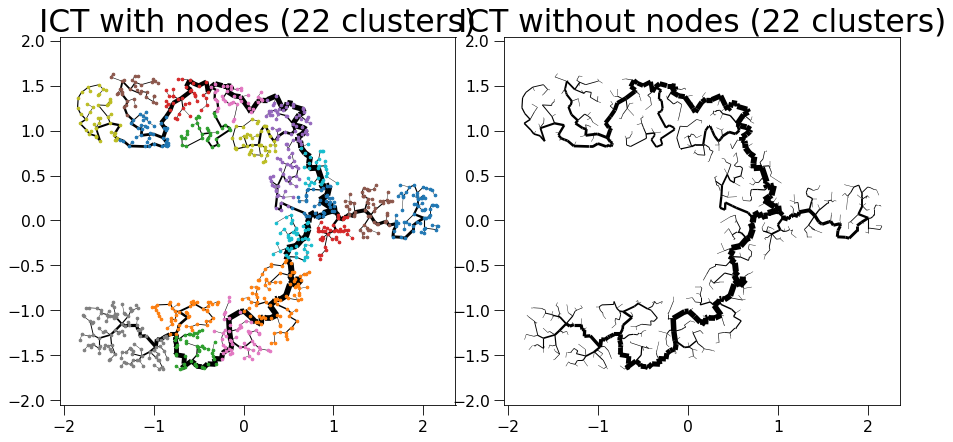

sklearn is done: 0.12446880340576172
My own part is done: 0.0007197856903076172


  0%|          | 0/23 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 201
update Arr 201 -> 177
update Arr 177 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 99
update Arr 99 -> 87
update Arr 87 -> 73
update Arr 73 -> 62
update Arr 62 -> 54
update Arr 54 -> 42
update Arr 42 -> 36
update Arr 36 -> 35
update Arr 35 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 300 -> 247
update Arr 247 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 150
update Arr 150 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 148
update Arr 148 -> 128
update Arr 128 -> 116
update Arr 116 -> 97
update Arr 97 -> 78
update Arr 78 -> 67
update Arr 67 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 263 -> 234
update Arr 234 -> 205
update Arr 205 -> 185
update Arr 185 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 113
update Arr 113 -> 99
update Arr 99 -> 89
update Arr 89 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 42
update Arr 42 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/385 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/385 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 385 -> 335
update Arr 335 -> 302
update Arr 302 -> 261
update Arr 261 -> 233
update Arr 233 -> 207
update Arr 207 -> 188
update Arr 188 -> 166
update Arr 166 -> 145
update Arr 145 -> 129
update Arr 129 -> 113
update Arr 113 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 65
update Arr 65 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 307 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 54
update Arr 54 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 383 -> 343
update Arr 343 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 227
update Arr 227 -> 203
update Arr 203 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 69
update Arr 69 -> 67
update Arr 67 -> 67
update Arr 67 -> 64
update Arr 64 -> 60
update Arr 60 -> 57
Final k: 11


create edgeId array:   0%|          | 0/333 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/333 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 333 -> 297
update Arr 297 -> 265
update Arr 265 -> 239
update Arr 239 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 124
update Arr 124 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 200
update Arr 200 -> 171
update Arr 171 -> 140
update Arr 140 -> 122
update Arr 122 -> 108
update Arr 108 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/282 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/282 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 282 -> 236
update Arr 236 -> 211
update Arr 211 -> 187
update Arr 187 -> 167
update Arr 167 -> 148
update Arr 148 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 43
update Arr 43 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 264 -> 221
update Arr 221 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 130
update Arr 130 -> 116
update Arr 116 -> 97
update Arr 97 -> 88
update Arr 88 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/332 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/332 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 332 -> 276
update Arr 276 -> 250
update Arr 250 -> 225
update Arr 225 -> 202
update Arr 202 -> 180
update Arr 180 -> 160
update Arr 160 -> 143
update Arr 143 -> 126
update Arr 126 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 63
update Arr 63 -> 58
update Arr 58 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 274 -> 236
update Arr 236 -> 211
update Arr 211 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 100
update Arr 100 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/399 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/399 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 399 -> 359
update Arr 359 -> 316
update Arr 316 -> 271
update Arr 271 -> 241
update Arr 241 -> 215
update Arr 215 -> 191
update Arr 191 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 111
update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 218
update Arr 218 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 132
update Arr 132 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 80
update Arr 80 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 294 -> 267
update Arr 267 -> 242
update Arr 242 -> 206
update Arr 206 -> 187
update Arr 187 -> 167
update Arr 167 -> 147
update Arr 147 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 274 -> 235
update Arr 235 -> 203
update Arr 203 -> 178
update Arr 178 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 73
update Arr 73 -> 59
update Arr 59 -> 53
update Arr 53 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 250 -> 218
update Arr 218 -> 189
update Arr 189 -> 163
update Arr 163 -> 142
update Arr 142 -> 129
update Arr 129 -> 108
update Arr 108 -> 94
update Arr 94 -> 81
update Arr 81 -> 73
update Arr 73 -> 60
update Arr 60 -> 47
update Arr 47 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 251 -> 227
update Arr 227 -> 206
update Arr 206 -> 184
update Arr 184 -> 164
update Arr 164 -> 145
update Arr 145 -> 128
update Arr 128 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 79
update Arr 79 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 239
update Arr 239 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 52
update Arr 52 -> 49
update Arr 49 -> 44
update Arr 44 -> 43
update Arr 43 -> 43
Final k: 11


create edgeId array:   0%|          | 0/260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 260 -> 222
update Arr 222 -> 178
update Arr 178 -> 160
update Arr 160 -> 144
update Arr 144 -> 123
update Arr 123 -> 110
update Arr 110 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/385 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/385 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 385 -> 341
update Arr 341 -> 293
update Arr 293 -> 265
update Arr 265 -> 236
update Arr 236 -> 210
update Arr 210 -> 188
update Arr 188 -> 163
update Arr 163 -> 144
update Arr 144 -> 130
update Arr 130 -> 108
update Arr 108 -> 94
update Arr 94 -> 82
update Arr 82 -> 69
update Arr 69 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 168
update Arr 168 -> 150
update Arr 150 -> 132
update Arr 132 -> 107
update Arr 107 -> 97
update Arr 97 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29


Patching the components together:   0%|          | 0/23 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1040 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1040 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1040 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999


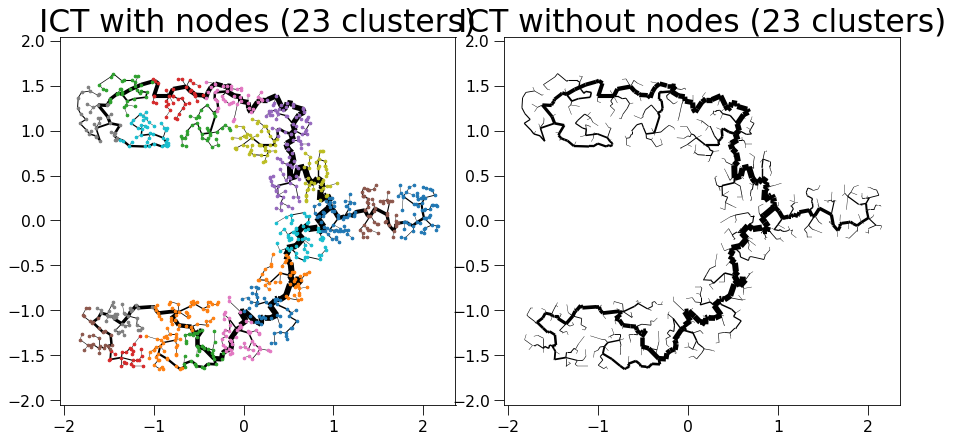

sklearn is done: 0.14444851875305176
My own part is done: 0.001203775405883789


  0%|          | 0/24 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/224 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/224 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 224 -> 203
update Arr 203 -> 165
update Arr 165 -> 149
update Arr 149 -> 127
update Arr 127 -> 113
update Arr 113 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 274 -> 236
update Arr 236 -> 211
update Arr 211 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 100
update Arr 100 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 263 -> 234
update Arr 234 -> 205
update Arr 205 -> 185
update Arr 185 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 113
update Arr 113 -> 99
update Arr 99 -> 89
update Arr 89 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 42
update Arr 42 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/344 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/344 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 344 -> 310
update Arr 310 -> 278
update Arr 278 -> 246
update Arr 246 -> 222
update Arr 222 -> 200
update Arr 200 -> 181
update Arr 181 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 117
update Arr 117 -> 99
update Arr 99 -> 86
update Arr 86 -> 72
update Arr 72 -> 62
update Arr 62 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 244 -> 209
update Arr 209 -> 184
update Arr 184 -> 165
update Arr 165 -> 147
update Arr 147 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 90
update Arr 90 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 41
update Arr 41 -> 36
update Arr 36 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 128
update Arr 128 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 263 -> 222
update Arr 222 -> 200
update Arr 200 -> 173
update Arr 173 -> 156
update Arr 156 -> 135
update Arr 135 -> 116
update Arr 116 -> 102
update Arr 102 -> 83
update Arr 83 -> 72
update Arr 72 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 228
update Arr 228 -> 187
update Arr 187 -> 168
update Arr 168 -> 150
update Arr 150 -> 136
update Arr 136 -> 123
update Arr 123 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 75
update Arr 75 -> 63
update Arr 63 -> 53
update Arr 53 -> 45
update Arr 45 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/365 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/365 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 365 -> 324
update Arr 324 -> 287
update Arr 287 -> 254
update Arr 254 -> 224
update Arr 224 -> 200
update Arr 200 -> 175
update Arr 175 -> 154
update Arr 154 -> 138
update Arr 138 -> 122
update Arr 122 -> 110
update Arr 110 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 63
update Arr 63 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/277 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/277 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 277 -> 251
update Arr 251 -> 223
update Arr 223 -> 190
update Arr 190 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 85
update Arr 85 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 48
update Arr 48 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 383 -> 343
update Arr 343 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 227
update Arr 227 -> 203
update Arr 203 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 69
update Arr 69 -> 67
update Arr 67 -> 67
update Arr 67 -> 64
update Arr 64 -> 60
update Arr 60 -> 57
Final k: 11


create edgeId array:   0%|          | 0/331 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/331 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 331 -> 298
update Arr 298 -> 265
update Arr 265 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 170
update Arr 170 -> 145
update Arr 145 -> 127
update Arr 127 -> 111
update Arr 111 -> 89
update Arr 89 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
update Arr 49 -> 49
Final k: 11


create edgeId array:   0%|          | 0/358 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/358 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 358 -> 323
update Arr 323 -> 292
update Arr 292 -> 263
update Arr 263 -> 238
update Arr 238 -> 213
update Arr 213 -> 190
update Arr 190 -> 171
update Arr 171 -> 150
update Arr 150 -> 131
update Arr 131 -> 114
update Arr 114 -> 98
update Arr 98 -> 89
update Arr 89 -> 74
update Arr 74 -> 63
update Arr 63 -> 60
update Arr 60 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 200
update Arr 200 -> 171
update Arr 171 -> 140
update Arr 140 -> 122
update Arr 122 -> 108
update Arr 108 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 123
update Arr 123 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/296 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/296 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 296 -> 252
update Arr 252 -> 227
update Arr 227 -> 205
update Arr 205 -> 182
update Arr 182 -> 162
update Arr 162 -> 143
update Arr 143 -> 127
update Arr 127 -> 108
update Arr 108 -> 98
update Arr 98 -> 83
update Arr 83 -> 70
update Arr 70 -> 61
update Arr 61 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/288 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/288 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 288 -> 253
update Arr 253 -> 219
update Arr 219 -> 191
update Arr 191 -> 167
update Arr 167 -> 149
update Arr 149 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 46
update Arr 46 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 268 -> 228
update Arr 228 -> 207
update Arr 207 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 115
update Arr 115 -> 96
update Arr 96 -> 82
update Arr 82 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 239
update Arr 239 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 52
update Arr 52 -> 49
update Arr 49 -> 44
update Arr 44 -> 43
update Arr 43 -> 43
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 253 -> 216
update Arr 216 -> 171
update Arr 171 -> 153
update Arr 153 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 50
update Arr 50 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 228
update Arr 228 -> 198
update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 142
update Arr 142 -> 117
update Arr 117 -> 104
update Arr 104 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39


Patching the components together:   0%|          | 0/24 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1041 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1041 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1041 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 3 edges early


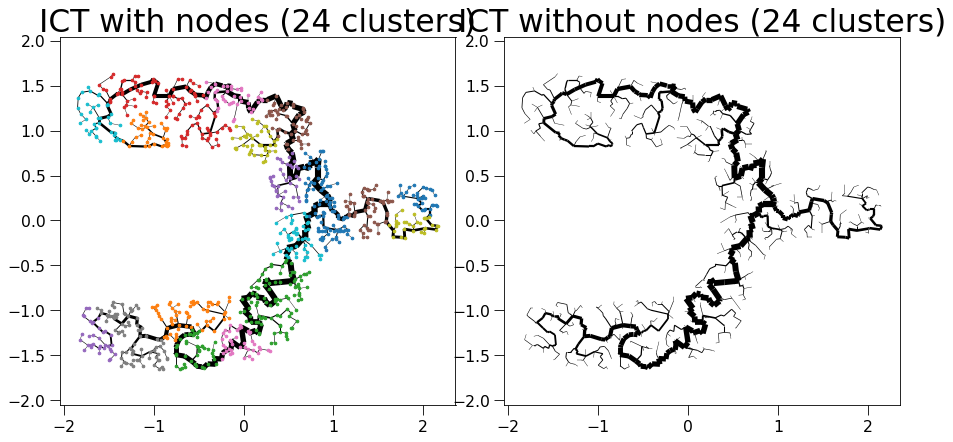

sklearn is done: 0.1598498821258545
My own part is done: 0.0010535717010498047


  0%|          | 0/25 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 128
update Arr 128 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 280 -> 249
update Arr 249 -> 220
update Arr 220 -> 192
update Arr 192 -> 170
update Arr 170 -> 145
update Arr 145 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 84
update Arr 84 -> 76
update Arr 76 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 39
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 147
update Arr 147 -> 130
update Arr 130 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 291 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 93
update Arr 93 -> 80
update Arr 80 -> 71
update Arr 71 -> 59
update Arr 59 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 250 -> 227
update Arr 227 -> 193
update Arr 193 -> 175
update Arr 175 -> 156
update Arr 156 -> 140
update Arr 140 -> 123
update Arr 123 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 43
update Arr 43 -> 40
update Arr 40 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 191 -> 159
update Arr 159 -> 138
update Arr 138 -> 124
update Arr 124 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 197
update Arr 197 -> 176
update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/277 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/277 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 277 -> 251
update Arr 251 -> 223
update Arr 223 -> 190
update Arr 190 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 85
update Arr 85 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 48
update Arr 48 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 318 -> 288
update Arr 288 -> 255
update Arr 255 -> 227
update Arr 227 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 135
update Arr 135 -> 119
update Arr 119 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 67
update Arr 67 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 319 -> 279
update Arr 279 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 171
update Arr 171 -> 155
update Arr 155 -> 138
update Arr 138 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/376 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/376 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 376 -> 335
update Arr 335 -> 287
update Arr 287 -> 258
update Arr 258 -> 228
update Arr 228 -> 207
update Arr 207 -> 186
update Arr 186 -> 163
update Arr 163 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 101
update Arr 101 -> 88
update Arr 88 -> 68
update Arr 68 -> 66
update Arr 66 -> 66
update Arr 66 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 243 -> 218
update Arr 218 -> 191
update Arr 191 -> 162
update Arr 162 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 71
update Arr 71 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 191
update Arr 191 -> 160
update Arr 160 -> 141
update Arr 141 -> 123
update Arr 123 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 228
update Arr 228 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 265 -> 234
update Arr 234 -> 209
update Arr 209 -> 187
update Arr 187 -> 169
update Arr 169 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 318 -> 282
update Arr 282 -> 250
update Arr 250 -> 225
update Arr 225 -> 204
update Arr 204 -> 174
update Arr 174 -> 154
update Arr 154 -> 134
update Arr 134 -> 115
update Arr 115 -> 90
update Arr 90 -> 74
update Arr 74 -> 67
update Arr 67 -> 56
update Arr 56 -> 53
update Arr 53 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 222 -> 184
update Arr 184 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 105
update Arr 105 -> 90
update Arr 90 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/224 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/224 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 224 -> 203
update Arr 203 -> 165
update Arr 165 -> 149
update Arr 149 -> 127
update Arr 127 -> 113
update Arr 113 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 239
update Arr 239 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 52
update Arr 52 -> 49
update Arr 49 -> 44
update Arr 44 -> 43
update Arr 43 -> 43
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 268 -> 228
update Arr 228 -> 207
update Arr 207 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 115
update Arr 115 -> 96
update Arr 96 -> 82
update Arr 82 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/317 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/317 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 317 -> 285
update Arr 285 -> 252
update Arr 252 -> 229
update Arr 229 -> 199
update Arr 199 -> 180
update Arr 180 -> 160
update Arr 160 -> 144
update Arr 144 -> 125
update Arr 125 -> 111
update Arr 111 -> 97
update Arr 97 -> 85
update Arr 85 -> 75
update Arr 75 -> 63
update Arr 63 -> 57
update Arr 57 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44


Patching the components together:   0%|          | 0/25 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1046 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1046 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1046 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 3 edges early


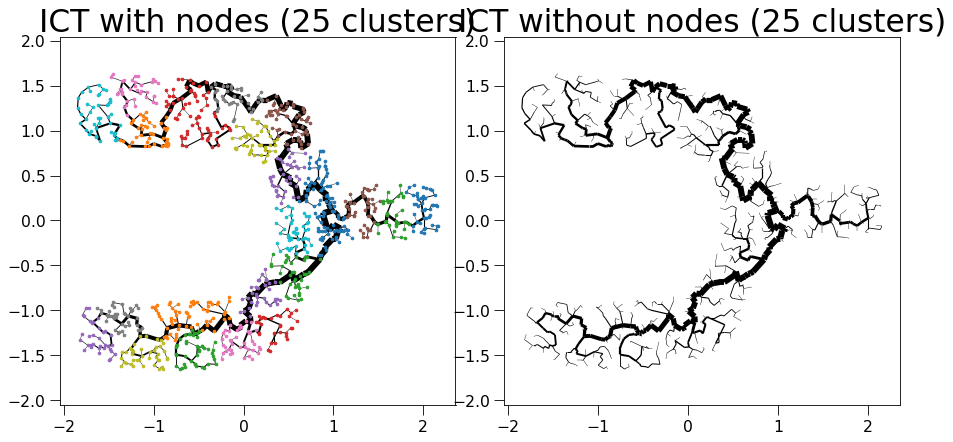

sklearn is done: 0.14935708045959473
My own part is done: 0.0012636184692382812


  0%|          | 0/26 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 264 -> 233
update Arr 233 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/354 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/354 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 354 -> 296
update Arr 296 -> 267
update Arr 267 -> 239
update Arr 239 -> 214
update Arr 214 -> 194
update Arr 194 -> 174
update Arr 174 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 63
update Arr 63 -> 63
update Arr 63 -> 60
update Arr 60 -> 56
update Arr 56 -> 53
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 147
update Arr 147 -> 130
update Arr 130 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 283 -> 238
update Arr 238 -> 202
update Arr 202 -> 181
update Arr 181 -> 164
update Arr 164 -> 149
update Arr 149 -> 130
update Arr 130 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 223
update Arr 223 -> 192
update Arr 192 -> 173
update Arr 173 -> 154
update Arr 154 -> 139
update Arr 139 -> 124
update Arr 124 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 249 -> 220
update Arr 220 -> 185
update Arr 185 -> 160
update Arr 160 -> 140
update Arr 140 -> 126
update Arr 126 -> 114
update Arr 114 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 258 -> 227
update Arr 227 -> 196
update Arr 196 -> 173
update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 122
update Arr 122 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 173
update Arr 173 -> 146
update Arr 146 -> 132
update Arr 132 -> 115
update Arr 115 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 255 -> 226
update Arr 226 -> 194
update Arr 194 -> 175
update Arr 175 -> 149
update Arr 149 -> 132
update Arr 132 -> 114
update Arr 114 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 243 -> 218
update Arr 218 -> 191
update Arr 191 -> 162
update Arr 162 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 71
update Arr 71 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 272 -> 228
update Arr 228 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 270 -> 244
update Arr 244 -> 214
update Arr 214 -> 190
update Arr 190 -> 170
update Arr 170 -> 145
update Arr 145 -> 128
update Arr 128 -> 114
update Arr 114 -> 101
update Arr 101 -> 90
update Arr 90 -> 75
update Arr 75 -> 66
update Arr 66 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 40
update Arr 40 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 128
update Arr 128 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 227 -> 200
update Arr 200 -> 170
update Arr 170 -> 150
update Arr 150 -> 134
update Arr 134 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 75
update Arr 75 -> 60
update Arr 60 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 123
update Arr 123 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 257 -> 222
update Arr 222 -> 187
update Arr 187 -> 169
update Arr 169 -> 148
update Arr 148 -> 129
update Arr 129 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 293 -> 250
update Arr 250 -> 218
update Arr 218 -> 198
update Arr 198 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 112
update Arr 112 -> 98
update Arr 98 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/358 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/358 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 358 -> 319
update Arr 319 -> 279
update Arr 279 -> 252
update Arr 252 -> 229
update Arr 229 -> 205
update Arr 205 -> 184
update Arr 184 -> 167
update Arr 167 -> 149
update Arr 149 -> 135
update Arr 135 -> 118
update Arr 118 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 74
update Arr 74 -> 60
update Arr 60 -> 56
update Arr 56 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 221
update Arr 221 -> 196
update Arr 196 -> 171
update Arr 171 -> 152
update Arr 152 -> 136
update Arr 136 -> 120
update Arr 120 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 81
update Arr 81 -> 70
update Arr 70 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 276 -> 246
update Arr 246 -> 211
update Arr 211 -> 187
update Arr 187 -> 167
update Arr 167 -> 146
update Arr 146 -> 129
update Arr 129 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 56
update Arr 56 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 265 -> 237
update Arr 237 -> 214
update Arr 214 -> 193
update Arr 193 -> 174
update Arr 174 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 42
update Arr 42 -> 41


Patching the components together:   0%|          | 0/26 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1048 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1048 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1048 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 6 edges early


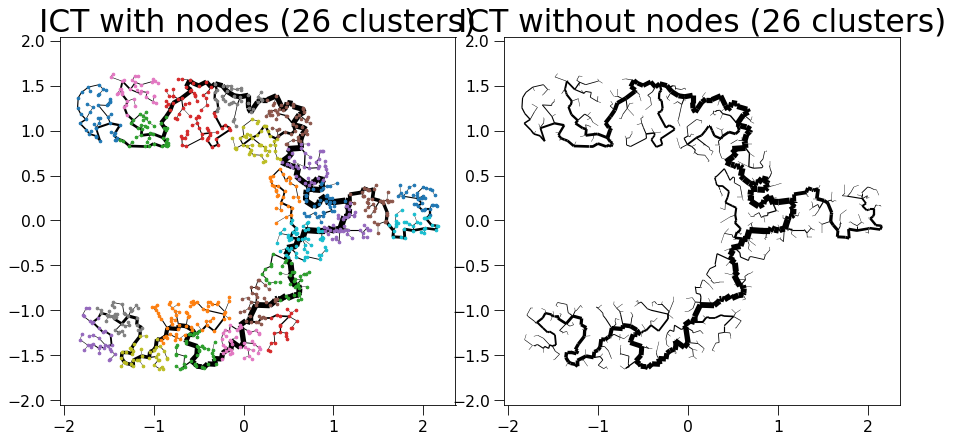

sklearn is done: 0.14436697959899902
My own part is done: 0.0009720325469970703


  0%|          | 0/27 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 228 -> 201
update Arr 201 -> 171
update Arr 171 -> 153
update Arr 153 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 95
update Arr 95 -> 81
update Arr 81 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 152
update Arr 152 -> 135
update Arr 135 -> 106
update Arr 106 -> 90
update Arr 90 -> 72
update Arr 72 -> 57
update Arr 57 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 245
update Arr 245 -> 221
update Arr 221 -> 197
update Arr 197 -> 178
update Arr 178 -> 158
update Arr 158 -> 140
update Arr 140 -> 120
update Arr 120 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 70
update Arr 70 -> 61
update Arr 61 -> 53
update Arr 53 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/345 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/345 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 345 -> 310
update Arr 310 -> 272
update Arr 272 -> 246
update Arr 246 -> 221
update Arr 221 -> 197
update Arr 197 -> 179
update Arr 179 -> 155
update Arr 155 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 63
update Arr 63 -> 61
update Arr 61 -> 61
update Arr 61 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 149
update Arr 149 -> 133
update Arr 133 -> 115
update Arr 115 -> 104
update Arr 104 -> 91
update Arr 91 -> 80
update Arr 80 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 81
update Arr 81 -> 70
update Arr 70 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 240 -> 211
update Arr 211 -> 183
update Arr 183 -> 162
update Arr 162 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 67
update Arr 67 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 198 -> 168
update Arr 168 -> 146
update Arr 146 -> 130
update Arr 130 -> 118
update Arr 118 -> 105
update Arr 105 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 276 -> 243
update Arr 243 -> 211
update Arr 211 -> 189
update Arr 189 -> 171
update Arr 171 -> 150
update Arr 150 -> 135
update Arr 135 -> 118
update Arr 118 -> 102
update Arr 102 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 200
update Arr 200 -> 176
update Arr 176 -> 151
update Arr 151 -> 137
update Arr 137 -> 119
update Arr 119 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 265 -> 237
update Arr 237 -> 214
update Arr 214 -> 193
update Arr 193 -> 174
update Arr 174 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 239
update Arr 239 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 52
update Arr 52 -> 49
update Arr 49 -> 44
update Arr 44 -> 43
update Arr 43 -> 43
Final k: 11


create edgeId array:   0%|          | 0/209 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/209 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 209 -> 171
update Arr 171 -> 147
update Arr 147 -> 123
update Arr 123 -> 107
update Arr 107 -> 93
update Arr 93 -> 67
update Arr 67 -> 54
update Arr 54 -> 48
update Arr 48 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 222 -> 194
update Arr 194 -> 168
update Arr 168 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 107
update Arr 107 -> 87
update Arr 87 -> 73
update Arr 73 -> 62
update Arr 62 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 154
update Arr 154 -> 139
update Arr 139 -> 125
update Arr 125 -> 92
update Arr 92 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/281 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/281 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 281 -> 246
update Arr 246 -> 200
update Arr 200 -> 178
update Arr 178 -> 146
update Arr 146 -> 130
update Arr 130 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 52
update Arr 52 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 293 -> 256
update Arr 256 -> 231
update Arr 231 -> 209
update Arr 209 -> 184
update Arr 184 -> 158
update Arr 158 -> 142
update Arr 142 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 78
update Arr 78 -> 66
update Arr 66 -> 52
update Arr 52 -> 49
update Arr 49 -> 48
update Arr 48 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 293 -> 255
update Arr 255 -> 227
update Arr 227 -> 202
update Arr 202 -> 180
update Arr 180 -> 158
update Arr 158 -> 143
update Arr 143 -> 125
update Arr 125 -> 110
update Arr 110 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 49
update Arr 49 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/337 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/337 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 337 -> 303
update Arr 303 -> 272
update Arr 272 -> 245
update Arr 245 -> 219
update Arr 219 -> 198
update Arr 198 -> 179
update Arr 179 -> 158
update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/302 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/302 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 302 -> 267
update Arr 267 -> 227
update Arr 227 -> 205
update Arr 205 -> 177
update Arr 177 -> 158
update Arr 158 -> 143
update Arr 143 -> 127
update Arr 127 -> 113
update Arr 113 -> 95
update Arr 95 -> 84
update Arr 84 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 49
update Arr 49 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 152
update Arr 152 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 49
update Arr 49 -> 40
update Arr 40 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 264 -> 233
update Arr 233 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 250 -> 225
update Arr 225 -> 204
update Arr 204 -> 181
update Arr 181 -> 160
update Arr 160 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 88
update Arr 88 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 46
update Arr 46 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
update Arr 37 -> 37
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 197
update Arr 197 -> 176
update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36


Patching the components together:   0%|          | 0/27 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1050 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1050 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1050 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


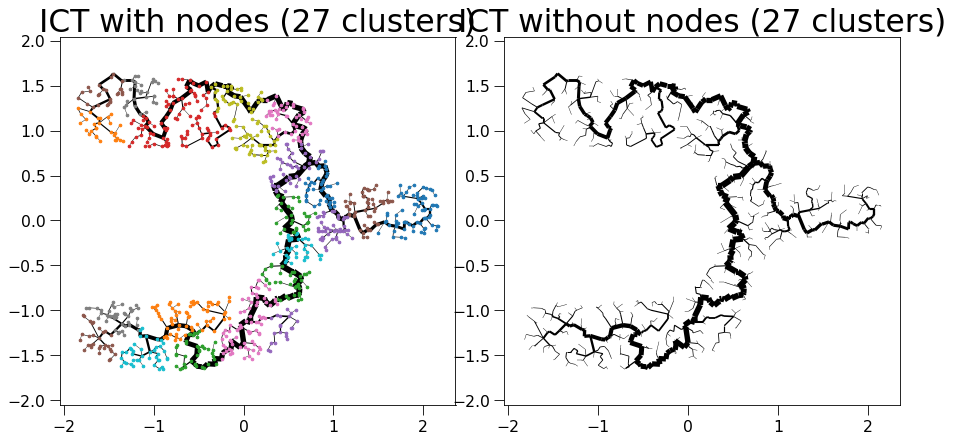

sklearn is done: 0.14379286766052246
My own part is done: 0.0006303787231445312


  0%|          | 0/28 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 264 -> 233
update Arr 233 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 197 -> 179
update Arr 179 -> 154
update Arr 154 -> 133
update Arr 133 -> 118
update Arr 118 -> 106
update Arr 106 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 59
update Arr 59 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 266 -> 238
update Arr 238 -> 201
update Arr 201 -> 180
update Arr 180 -> 157
update Arr 157 -> 137
update Arr 137 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 87
update Arr 87 -> 72
update Arr 72 -> 63
update Arr 63 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 319 -> 279
update Arr 279 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 171
update Arr 171 -> 155
update Arr 155 -> 138
update Arr 138 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/209 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/209 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 209 -> 171
update Arr 171 -> 147
update Arr 147 -> 123
update Arr 123 -> 107
update Arr 107 -> 93
update Arr 93 -> 67
update Arr 67 -> 54
update Arr 54 -> 48
update Arr 48 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 171
update Arr 171 -> 149
update Arr 149 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 91
update Arr 91 -> 79
update Arr 79 -> 68
update Arr 68 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 129
update Arr 129 -> 113
update Arr 113 -> 97
update Arr 97 -> 87
update Arr 87 -> 72
update Arr 72 -> 60
update Arr 60 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 183
update Arr 183 -> 161
update Arr 161 -> 145
update Arr 145 -> 131
update Arr 131 -> 118
update Arr 118 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 227 -> 196
update Arr 196 -> 164
update Arr 164 -> 149
update Arr 149 -> 129
update Arr 129 -> 109
update Arr 109 -> 93
update Arr 93 -> 84
update Arr 84 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 181
update Arr 181 -> 158
update Arr 158 -> 134
update Arr 134 -> 121
update Arr 121 -> 104
update Arr 104 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 225 -> 198
update Arr 198 -> 171
update Arr 171 -> 149
update Arr 149 -> 135
update Arr 135 -> 118
update Arr 118 -> 100
update Arr 100 -> 90
update Arr 90 -> 79
update Arr 79 -> 60
update Arr 60 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 268 -> 228
update Arr 228 -> 207
update Arr 207 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 115
update Arr 115 -> 96
update Arr 96 -> 82
update Arr 82 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/323 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/323 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 323 -> 286
update Arr 286 -> 241
update Arr 241 -> 217
update Arr 217 -> 191
update Arr 191 -> 169
update Arr 169 -> 146
update Arr 146 -> 131
update Arr 131 -> 113
update Arr 113 -> 102
update Arr 102 -> 86
update Arr 86 -> 75
update Arr 75 -> 65
update Arr 65 -> 59
update Arr 59 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 265 -> 234
update Arr 234 -> 209
update Arr 209 -> 187
update Arr 187 -> 169
update Arr 169 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 222 -> 184
update Arr 184 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 105
update Arr 105 -> 90
update Arr 90 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 236 -> 208
update Arr 208 -> 175
update Arr 175 -> 157
update Arr 157 -> 138
update Arr 138 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 78
update Arr 78 -> 66
update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 200
update Arr 200 -> 176
update Arr 176 -> 151
update Arr 151 -> 137
update Arr 137 -> 119
update Arr 119 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 254 -> 224
update Arr 224 -> 188
update Arr 188 -> 167
update Arr 167 -> 150
update Arr 150 -> 133
update Arr 133 -> 120
update Arr 120 -> 105
update Arr 105 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 39
update Arr 39 -> 38
update Arr 38 -> 38
Final k: 11


create edgeId array:   0%|          | 0/297 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/297 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 297 -> 263
update Arr 263 -> 216
update Arr 216 -> 190
update Arr 190 -> 171
update Arr 171 -> 147
update Arr 147 -> 131
update Arr 131 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 45
update Arr 45 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 201 -> 176
update Arr 176 -> 153
update Arr 153 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 87
update Arr 87 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 124
update Arr 124 -> 111
update Arr 111 -> 94
update Arr 94 -> 76
update Arr 76 -> 63
update Arr 63 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/317 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/317 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 317 -> 279
update Arr 279 -> 248
update Arr 248 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 90
update Arr 90 -> 78
update Arr 78 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 205 -> 177
update Arr 177 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 260 -> 234
update Arr 234 -> 201
update Arr 201 -> 178
update Arr 178 -> 161
update Arr 161 -> 145
update Arr 145 -> 126
update Arr 126 -> 112
update Arr 112 -> 99
update Arr 99 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 191 -> 159
update Arr 159 -> 138
update Arr 138 -> 124
update Arr 124 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 291 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 93
update Arr 93 -> 80
update Arr 80 -> 71
update Arr 71 -> 59
update Arr 59 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 171 -> 146
update Arr 146 -> 124
update Arr 124 -> 109
update Arr 109 -> 96
update Arr 96 -> 84
update Arr 84 -> 73
update Arr 73 -> 66
update Arr 66 -> 54
update Arr 54 -> 44
update Arr 44 -> 36
update Arr 36 -> 29
update Arr 29 -> 29
update Arr 29 -> 27
update Arr 27 -> 26


Patching the components together:   0%|          | 0/28 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1051 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1051 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1051 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


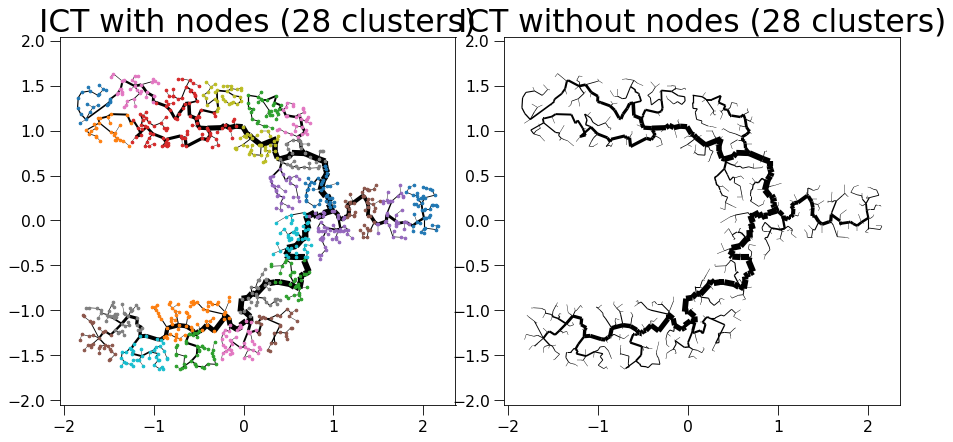

sklearn is done: 0.15110182762145996
My own part is done: 0.000820159912109375


  0%|          | 0/29 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 194 -> 165
update Arr 165 -> 148
update Arr 148 -> 134
update Arr 134 -> 117
update Arr 117 -> 106
update Arr 106 -> 90
update Arr 90 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 285 -> 252
update Arr 252 -> 224
update Arr 224 -> 202
update Arr 202 -> 178
update Arr 178 -> 155
update Arr 155 -> 135
update Arr 135 -> 122
update Arr 122 -> 107
update Arr 107 -> 93
update Arr 93 -> 72
update Arr 72 -> 63
update Arr 63 -> 57
update Arr 57 -> 54
update Arr 54 -> 50
update Arr 50 -> 46
update Arr 46 -> 44
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 195
update Arr 195 -> 177
update Arr 177 -> 158
update Arr 158 -> 125
update Arr 125 -> 111
update Arr 111 -> 100
update Arr 100 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 33
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/305 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/305 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 305 -> 277
update Arr 277 -> 245
update Arr 245 -> 216
update Arr 216 -> 190
update Arr 190 -> 166
update Arr 166 -> 150
update Arr 150 -> 136
update Arr 136 -> 120
update Arr 120 -> 107
update Arr 107 -> 96
update Arr 96 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 254 -> 224
update Arr 224 -> 188
update Arr 188 -> 167
update Arr 167 -> 150
update Arr 150 -> 133
update Arr 133 -> 120
update Arr 120 -> 105
update Arr 105 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 39
update Arr 39 -> 38
update Arr 38 -> 38
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 170
update Arr 170 -> 153
update Arr 153 -> 132
update Arr 132 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 56
update Arr 56 -> 50
update Arr 50 -> 44
update Arr 44 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 186
update Arr 186 -> 160
update Arr 160 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 93
update Arr 93 -> 83
update Arr 83 -> 64
update Arr 64 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 33
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 253 -> 211
update Arr 211 -> 191
update Arr 191 -> 171
update Arr 171 -> 154
update Arr 154 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 86
update Arr 86 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 268 -> 238
update Arr 238 -> 206
update Arr 206 -> 187
update Arr 187 -> 162
update Arr 162 -> 145
update Arr 145 -> 127
update Arr 127 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 76
update Arr 76 -> 61
update Arr 61 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 284 -> 254
update Arr 254 -> 217
update Arr 217 -> 196
update Arr 196 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 94
update Arr 94 -> 80
update Arr 80 -> 72
update Arr 72 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 183
update Arr 183 -> 162
update Arr 162 -> 147
update Arr 147 -> 128
update Arr 128 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 103
update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 57
update Arr 57 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 295 -> 266
update Arr 266 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 89
update Arr 89 -> 75
update Arr 75 -> 67
update Arr 67 -> 56
update Arr 56 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 176
update Arr 176 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 188 -> 165
update Arr 165 -> 143
update Arr 143 -> 125
update Arr 125 -> 111
update Arr 111 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 205
update Arr 205 -> 183
update Arr 183 -> 163
update Arr 163 -> 147
update Arr 147 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 255 -> 221
update Arr 221 -> 188
update Arr 188 -> 169
update Arr 169 -> 153
update Arr 153 -> 137
update Arr 137 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 86
update Arr 86 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 47
update Arr 47 -> 43
update Arr 43 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 274 -> 246
update Arr 246 -> 208
update Arr 208 -> 182
update Arr 182 -> 161
update Arr 161 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 90
update Arr 90 -> 74
update Arr 74 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 221
update Arr 221 -> 196
update Arr 196 -> 171
update Arr 171 -> 152
update Arr 152 -> 136
update Arr 136 -> 120
update Arr 120 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 173
update Arr 173 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 108
update Arr 108 -> 92
update Arr 92 -> 76
update Arr 76 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 267 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 169
update Arr 169 -> 153
update Arr 153 -> 134
update Arr 134 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 44
update Arr 44 -> 40
update Arr 40 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 245 -> 205
update Arr 205 -> 186
update Arr 186 -> 168
update Arr 168 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 211 -> 179
update Arr 179 -> 149
update Arr 149 -> 129
update Arr 129 -> 115
update Arr 115 -> 99
update Arr 99 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 54
update Arr 54 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 196 -> 156
update Arr 156 -> 139
update Arr 139 -> 117
update Arr 117 -> 102
update Arr 102 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 210 -> 171
update Arr 171 -> 149
update Arr 149 -> 130
update Arr 130 -> 110
update Arr 110 -> 95
update Arr 95 -> 77
update Arr 77 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29


Patching the components together:   0%|          | 0/29 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1048 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1048 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1048 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 3 edges early


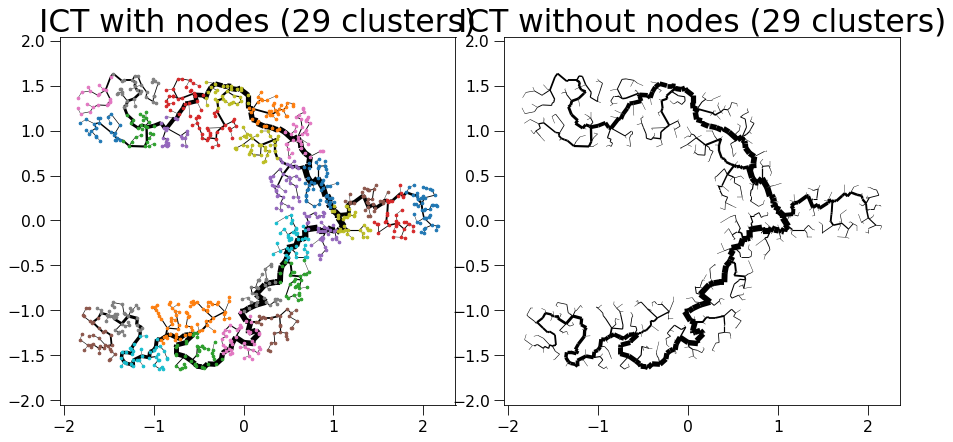

sklearn is done: 0.15791749954223633
My own part is done: 0.001116037368774414


  0%|          | 0/30 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 124
update Arr 124 -> 111
update Arr 111 -> 94
update Arr 94 -> 76
update Arr 76 -> 63
update Arr 63 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 245 -> 210
update Arr 210 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 164
update Arr 164 -> 148
update Arr 148 -> 131
update Arr 131 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 62
update Arr 62 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 195
update Arr 195 -> 173
update Arr 173 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 233 -> 209
update Arr 209 -> 185
update Arr 185 -> 165
update Arr 165 -> 146
update Arr 146 -> 127
update Arr 127 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 142
update Arr 142 -> 125
update Arr 125 -> 88
update Arr 88 -> 78
update Arr 78 -> 66
update Arr 66 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 242 -> 215
update Arr 215 -> 178
update Arr 178 -> 158
update Arr 158 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 84
update Arr 84 -> 68
update Arr 68 -> 60
update Arr 60 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 188 -> 148
update Arr 148 -> 132
update Arr 132 -> 113
update Arr 113 -> 97
update Arr 97 -> 84
update Arr 84 -> 72
update Arr 72 -> 64
update Arr 64 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 318 -> 284
update Arr 284 -> 257
update Arr 257 -> 226
update Arr 226 -> 202
update Arr 202 -> 180
update Arr 180 -> 161
update Arr 161 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 101
update Arr 101 -> 91
update Arr 91 -> 80
update Arr 80 -> 69
update Arr 69 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 219
update Arr 219 -> 193
update Arr 193 -> 175
update Arr 175 -> 155
update Arr 155 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 92
update Arr 92 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 226
update Arr 226 -> 194
update Arr 194 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 43
update Arr 43 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 233 -> 204
update Arr 204 -> 160
update Arr 160 -> 141
update Arr 141 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 35
update Arr 35 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 142 -> 122
update Arr 122 -> 109
update Arr 109 -> 94
update Arr 94 -> 77
update Arr 77 -> 63
update Arr 63 -> 45
update Arr 45 -> 38
update Arr 38 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 152
update Arr 152 -> 134
update Arr 134 -> 121
update Arr 121 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 51
update Arr 51 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 180
update Arr 180 -> 163
update Arr 163 -> 143
update Arr 143 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 198 -> 170
update Arr 170 -> 149
update Arr 149 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 96
update Arr 96 -> 83
update Arr 83 -> 75
update Arr 75 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 36
update Arr 36 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 171
update Arr 171 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 175 -> 146
update Arr 146 -> 131
update Arr 131 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 69
update Arr 69 -> 57
update Arr 57 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 186 -> 163
update Arr 163 -> 146
update Arr 146 -> 123
update Arr 123 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 43
update Arr 43 -> 34
update Arr 34 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 321 -> 286
update Arr 286 -> 249
update Arr 249 -> 225
update Arr 225 -> 204
update Arr 204 -> 184
update Arr 184 -> 167
update Arr 167 -> 150
update Arr 150 -> 133
update Arr 133 -> 113
update Arr 113 -> 97
update Arr 97 -> 85
update Arr 85 -> 77
update Arr 77 -> 66
update Arr 66 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 241 -> 217
update Arr 217 -> 190
update Arr 190 -> 167
update Arr 167 -> 149
update Arr 149 -> 126
update Arr 126 -> 114
update Arr 114 -> 100
update Arr 100 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 52
update Arr 52 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/209 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/209 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 209 -> 180
update Arr 180 -> 155
update Arr 155 -> 134
update Arr 134 -> 117
update Arr 117 -> 101
update Arr 101 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 219 -> 190
update Arr 190 -> 165
update Arr 165 -> 149
update Arr 149 -> 128
update Arr 128 -> 107
update Arr 107 -> 96
update Arr 96 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 262 -> 220
update Arr 220 -> 186
update Arr 186 -> 165
update Arr 165 -> 147
update Arr 147 -> 132
update Arr 132 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 56
update Arr 56 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 208
update Arr 208 -> 175
update Arr 175 -> 155
update Arr 155 -> 140
update Arr 140 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 78
update Arr 78 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 238 -> 212
update Arr 212 -> 179
update Arr 179 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 38
update Arr 38 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 240 -> 218
update Arr 218 -> 194
update Arr 194 -> 175
update Arr 175 -> 158
update Arr 158 -> 141
update Arr 141 -> 125
update Arr 125 -> 111
update Arr 111 -> 96
update Arr 96 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 49
update Arr 49 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 255 -> 231
update Arr 231 -> 208
update Arr 208 -> 186
update Arr 186 -> 166
update Arr 166 -> 145
update Arr 145 -> 128
update Arr 128 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 71
update Arr 71 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 250 -> 219
update Arr 219 -> 195
update Arr 195 -> 176
update Arr 176 -> 156
update Arr 156 -> 140
update Arr 140 -> 123
update Arr 123 -> 107
update Arr 107 -> 94
update Arr 94 -> 85
update Arr 85 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37


Patching the components together:   0%|          | 0/30 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1063 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


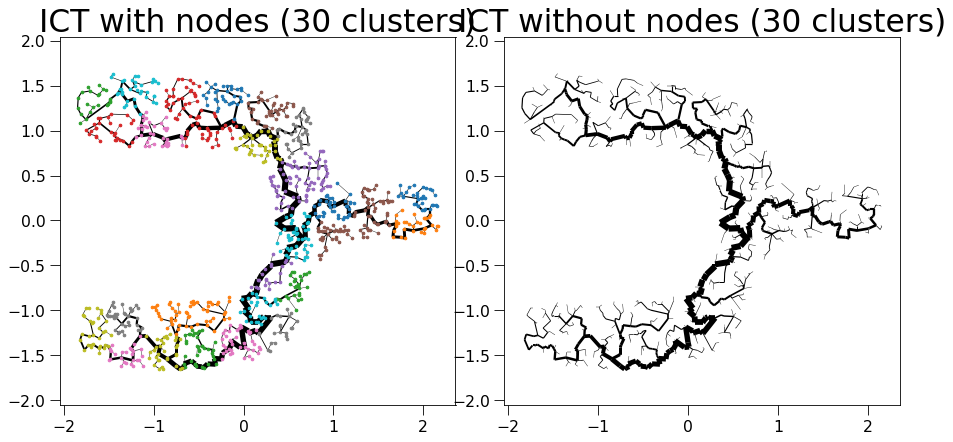

sklearn is done: 0.1587841510772705
My own part is done: 0.0012102127075195312


  0%|          | 0/31 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 201
update Arr 201 -> 171
update Arr 171 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 105
update Arr 105 -> 93
update Arr 93 -> 83
update Arr 83 -> 67
update Arr 67 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 268 -> 241
update Arr 241 -> 219
update Arr 219 -> 195
update Arr 195 -> 172
update Arr 172 -> 156
update Arr 156 -> 135
update Arr 135 -> 117
update Arr 117 -> 106
update Arr 106 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 42
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 201 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 166
update Arr 166 -> 138
update Arr 138 -> 123
update Arr 123 -> 109
update Arr 109 -> 93
update Arr 93 -> 83
update Arr 83 -> 73
update Arr 73 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 158
update Arr 158 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 190
update Arr 190 -> 170
update Arr 170 -> 154
update Arr 154 -> 136
update Arr 136 -> 122
update Arr 122 -> 102
update Arr 102 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 56
update Arr 56 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 240
update Arr 240 -> 212
update Arr 212 -> 190
update Arr 190 -> 168
update Arr 168 -> 152
update Arr 152 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 96
update Arr 96 -> 83
update Arr 83 -> 75
update Arr 75 -> 61
update Arr 61 -> 54
update Arr 54 -> 49
update Arr 49 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
Final k: 11


create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 215 -> 187
update Arr 187 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 103
update Arr 103 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 186
update Arr 186 -> 159
update Arr 159 -> 137
update Arr 137 -> 121
update Arr 121 -> 105
update Arr 105 -> 93
update Arr 93 -> 83
update Arr 83 -> 63
update Arr 63 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 211 -> 173
update Arr 173 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 82
update Arr 82 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 237 -> 203
update Arr 203 -> 177
update Arr 177 -> 160
update Arr 160 -> 145
update Arr 145 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 89
update Arr 89 -> 76
update Arr 76 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 152
update Arr 152 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 49
update Arr 49 -> 40
update Arr 40 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 191
update Arr 191 -> 172
update Arr 172 -> 154
update Arr 154 -> 132
update Arr 132 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/320 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/320 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 320 -> 280
update Arr 280 -> 235
update Arr 235 -> 213
update Arr 213 -> 188
update Arr 188 -> 168
update Arr 168 -> 149
update Arr 149 -> 129
update Arr 129 -> 113
update Arr 113 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 56
update Arr 56 -> 50
update Arr 50 -> 47
update Arr 47 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 240 -> 204
update Arr 204 -> 183
update Arr 183 -> 163
update Arr 163 -> 145
update Arr 145 -> 131
update Arr 131 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 204 -> 178
update Arr 178 -> 157
update Arr 157 -> 136
update Arr 136 -> 119
update Arr 119 -> 97
update Arr 97 -> 81
update Arr 81 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 266 -> 234
update Arr 234 -> 202
update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 130
update Arr 130 -> 117
update Arr 117 -> 99
update Arr 99 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 46
update Arr 46 -> 42
update Arr 42 -> 37
update Arr 37 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 249 -> 222
update Arr 222 -> 181
update Arr 181 -> 161
update Arr 161 -> 144
update Arr 144 -> 130
update Arr 130 -> 116
update Arr 116 -> 101
update Arr 101 -> 90
update Arr 90 -> 77
update Arr 77 -> 64
update Arr 64 -> 56
update Arr 56 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 171
update Arr 171 -> 149
update Arr 149 -> 133
update Arr 133 -> 112
update Arr 112 -> 96
update Arr 96 -> 83
update Arr 83 -> 69
update Arr 69 -> 60
update Arr 60 -> 45
update Arr 45 -> 40
update Arr 40 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 258 -> 216
update Arr 216 -> 190
update Arr 190 -> 162
update Arr 162 -> 143
update Arr 143 -> 122
update Arr 122 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 57
update Arr 57 -> 48
update Arr 48 -> 44
update Arr 44 -> 39
update Arr 39 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 205
update Arr 205 -> 178
update Arr 178 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 109
update Arr 109 -> 94
update Arr 94 -> 83
update Arr 83 -> 68
update Arr 68 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 143
update Arr 143 -> 129
update Arr 129 -> 114
update Arr 114 -> 74
update Arr 74 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 146
update Arr 146 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 175 -> 150
update Arr 150 -> 130
update Arr 130 -> 110
update Arr 110 -> 98
update Arr 98 -> 86
update Arr 86 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 45
update Arr 45 -> 36
update Arr 36 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 142
update Arr 142 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 75
update Arr 75 -> 61
update Arr 61 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 189 -> 154
update Arr 154 -> 134
update Arr 134 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 64
update Arr 64 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 164
update Arr 164 -> 140
update Arr 140 -> 123
update Arr 123 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 273 -> 243
update Arr 243 -> 217
update Arr 217 -> 194
update Arr 194 -> 170
update Arr 170 -> 153
update Arr 153 -> 138
update Arr 138 -> 117
update Arr 117 -> 106
update Arr 106 -> 93
update Arr 93 -> 78
update Arr 78 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 240 -> 211
update Arr 211 -> 183
update Arr 183 -> 162
update Arr 162 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 67
update Arr 67 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 163
update Arr 163 -> 142
update Arr 142 -> 119
update Arr 119 -> 106
update Arr 106 -> 96
update Arr 96 -> 81
update Arr 81 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 68
update Arr 68 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20


Patching the components together:   0%|          | 0/31 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1044 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1044 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1044 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


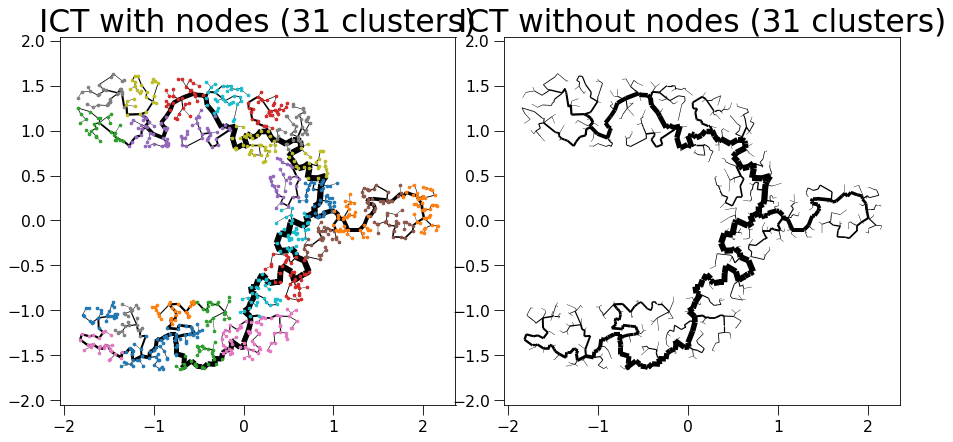

sklearn is done: 0.1591935157775879
My own part is done: 0.0012462139129638672


  0%|          | 0/32 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 205 -> 165
update Arr 165 -> 141
update Arr 141 -> 124
update Arr 124 -> 110
update Arr 110 -> 96
update Arr 96 -> 79
update Arr 79 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 170 -> 150
update Arr 150 -> 135
update Arr 135 -> 113
update Arr 113 -> 97
update Arr 97 -> 85
update Arr 85 -> 73
update Arr 73 -> 58
update Arr 58 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 265 -> 227
update Arr 227 -> 200
update Arr 200 -> 149
update Arr 149 -> 134
update Arr 134 -> 118
update Arr 118 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 71
update Arr 71 -> 59
update Arr 59 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 39
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 190 -> 171
update Arr 171 -> 141
update Arr 141 -> 120
update Arr 120 -> 107
update Arr 107 -> 95
update Arr 95 -> 85
update Arr 85 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 37
update Arr 37 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 270 -> 230
update Arr 230 -> 193
update Arr 193 -> 173
update Arr 173 -> 156
update Arr 156 -> 136
update Arr 136 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 65
update Arr 65 -> 56
update Arr 56 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/296 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/296 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 296 -> 258
update Arr 258 -> 233
update Arr 233 -> 210
update Arr 210 -> 182
update Arr 182 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 112
update Arr 112 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 178 -> 147
update Arr 147 -> 130
update Arr 130 -> 106
update Arr 106 -> 93
update Arr 93 -> 83
update Arr 83 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 253 -> 227
update Arr 227 -> 205
update Arr 205 -> 183
update Arr 183 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 110
update Arr 110 -> 97
update Arr 97 -> 75
update Arr 75 -> 65
update Arr 65 -> 58
update Arr 58 -> 49
update Arr 49 -> 44
update Arr 44 -> 41
update Arr 41 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 193 -> 161
update Arr 161 -> 141
update Arr 141 -> 127
update Arr 127 -> 113
update Arr 113 -> 95
update Arr 95 -> 86
update Arr 86 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 151
update Arr 151 -> 136
update Arr 136 -> 120
update Arr 120 -> 104
update Arr 104 -> 93
update Arr 93 -> 79
update Arr 79 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 148 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 238 -> 212
update Arr 212 -> 185
update Arr 185 -> 163
update Arr 163 -> 148
update Arr 148 -> 122
update Arr 122 -> 107
update Arr 107 -> 96
update Arr 96 -> 84
update Arr 84 -> 67
update Arr 67 -> 60
update Arr 60 -> 50
update Arr 50 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 238 -> 212
update Arr 212 -> 179
update Arr 179 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 38
update Arr 38 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 241 -> 211
update Arr 211 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 132
update Arr 132 -> 118
update Arr 118 -> 104
update Arr 104 -> 91
update Arr 91 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 36
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 238 -> 207
update Arr 207 -> 174
update Arr 174 -> 155
update Arr 155 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 96
update Arr 96 -> 78
update Arr 78 -> 66
update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 154
update Arr 154 -> 123
update Arr 123 -> 106
update Arr 106 -> 94
update Arr 94 -> 83
update Arr 83 -> 75
update Arr 75 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 147
update Arr 147 -> 126
update Arr 126 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 132
update Arr 132 -> 115
update Arr 115 -> 104
update Arr 104 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 49
update Arr 49 -> 44
update Arr 44 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 194
update Arr 194 -> 171
update Arr 171 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 264 -> 233
update Arr 233 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 84
update Arr 84 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 166
update Arr 166 -> 139
update Arr 139 -> 120
update Arr 120 -> 104
update Arr 104 -> 88
update Arr 88 -> 71
update Arr 71 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 241 -> 217
update Arr 217 -> 196
update Arr 196 -> 172
update Arr 172 -> 151
update Arr 151 -> 134
update Arr 134 -> 121
update Arr 121 -> 107
update Arr 107 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 184 -> 146
update Arr 146 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 56
update Arr 56 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 203 -> 182
update Arr 182 -> 158
update Arr 158 -> 132
update Arr 132 -> 118
update Arr 118 -> 105
update Arr 105 -> 95
update Arr 95 -> 83
update Arr 83 -> 64
update Arr 64 -> 56
update Arr 56 -> 50
update Arr 50 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 200
update Arr 200 -> 176
update Arr 176 -> 151
update Arr 151 -> 137
update Arr 137 -> 119
update Arr 119 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 138
update Arr 138 -> 123
update Arr 123 -> 105
update Arr 105 -> 93
update Arr 93 -> 83
update Arr 83 -> 69
update Arr 69 -> 59
update Arr 59 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/350 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/350 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 350 -> 313
update Arr 313 -> 284
update Arr 284 -> 253
update Arr 253 -> 227
update Arr 227 -> 205
update Arr 205 -> 181
update Arr 181 -> 162
update Arr 162 -> 145
update Arr 145 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 55
update Arr 55 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/32 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1047 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1047 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1047 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


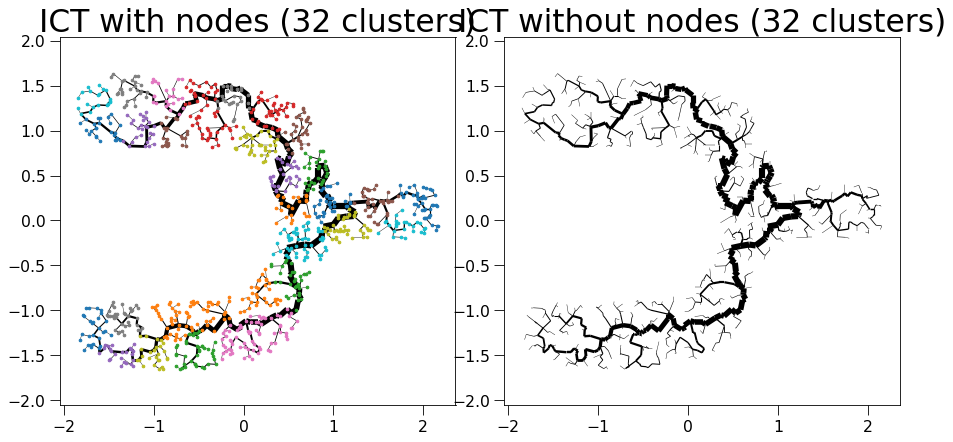

sklearn is done: 0.1650524139404297
My own part is done: 0.0010180473327636719


  0%|          | 0/33 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 161
update Arr 161 -> 142
update Arr 142 -> 128
update Arr 128 -> 111
update Arr 111 -> 97
update Arr 97 -> 87
update Arr 87 -> 75
update Arr 75 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/277 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/277 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 277 -> 243
update Arr 243 -> 211
update Arr 211 -> 171
update Arr 171 -> 146
update Arr 146 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 110
update Arr 110 -> 91
update Arr 91 -> 71
update Arr 71 -> 60
update Arr 60 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 205 -> 173
update Arr 173 -> 154
update Arr 154 -> 129
update Arr 129 -> 113
update Arr 113 -> 102
update Arr 102 -> 89
update Arr 89 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 123
update Arr 123 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 274 -> 246
update Arr 246 -> 208
update Arr 208 -> 182
update Arr 182 -> 161
update Arr 161 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 90
update Arr 90 -> 74
update Arr 74 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 156
update Arr 156 -> 133
update Arr 133 -> 117
update Arr 117 -> 101
update Arr 101 -> 86
update Arr 86 -> 75
update Arr 75 -> 67
update Arr 67 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 127
update Arr 127 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 155
update Arr 155 -> 138
update Arr 138 -> 120
update Arr 120 -> 107
update Arr 107 -> 89
update Arr 89 -> 73
update Arr 73 -> 63
update Arr 63 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 234
update Arr 234 -> 192
update Arr 192 -> 171
update Arr 171 -> 150
update Arr 150 -> 128
update Arr 128 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 41
update Arr 41 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 130
update Arr 130 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 75
update Arr 75 -> 65
update Arr 65 -> 58
update Arr 58 -> 48
update Arr 48 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 139
update Arr 139 -> 118
update Arr 118 -> 106
update Arr 106 -> 87
update Arr 87 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 147
update Arr 147 -> 129
update Arr 129 -> 109
update Arr 109 -> 91
update Arr 91 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 228
update Arr 228 -> 187
update Arr 187 -> 168
update Arr 168 -> 150
update Arr 150 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 63
update Arr 63 -> 53
update Arr 53 -> 45
update Arr 45 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 155
update Arr 155 -> 138
update Arr 138 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 72
update Arr 72 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 163
update Arr 163 -> 142
update Arr 142 -> 128
update Arr 128 -> 105
update Arr 105 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 119
update Arr 119 -> 107
update Arr 107 -> 93
update Arr 93 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 43
update Arr 43 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 21
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 235 -> 209
update Arr 209 -> 182
update Arr 182 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 106
update Arr 106 -> 93
update Arr 93 -> 78
update Arr 78 -> 67
update Arr 67 -> 60
update Arr 60 -> 50
update Arr 50 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 194
update Arr 194 -> 171
update Arr 171 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 97
update Arr 97 -> 87
update Arr 87 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 19
update Arr 19 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 175 -> 142
update Arr 142 -> 127
update Arr 127 -> 112
update Arr 112 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 68
update Arr 68 -> 56
update Arr 56 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 193 -> 163
update Arr 163 -> 146
update Arr 146 -> 129
update Arr 129 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 241 -> 211
update Arr 211 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 132
update Arr 132 -> 118
update Arr 118 -> 104
update Arr 104 -> 91
update Arr 91 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 36
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 268 -> 241
update Arr 241 -> 198
update Arr 198 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 109
update Arr 109 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 39
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 225 -> 200
update Arr 200 -> 169
update Arr 169 -> 149
update Arr 149 -> 133
update Arr 133 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 77
update Arr 77 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 204 -> 185
update Arr 185 -> 166
update Arr 166 -> 148
update Arr 148 -> 128
update Arr 128 -> 111
update Arr 111 -> 96
update Arr 96 -> 81
update Arr 81 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 142
update Arr 142 -> 125
update Arr 125 -> 88
update Arr 88 -> 78
update Arr 78 -> 66
update Arr 66 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 225 -> 204
update Arr 204 -> 185
update Arr 185 -> 162
update Arr 162 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 194 -> 152
update Arr 152 -> 127
update Arr 127 -> 108
update Arr 108 -> 95
update Arr 95 -> 78
update Arr 78 -> 54
update Arr 54 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 175 -> 143
update Arr 143 -> 126
update Arr 126 -> 111
update Arr 111 -> 91
update Arr 91 -> 76
update Arr 76 -> 65
update Arr 65 -> 54
update Arr 54 -> 47
update Arr 47 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 204 -> 164
update Arr 164 -> 144
update Arr 144 -> 124
update Arr 124 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 170
update Arr 170 -> 153
update Arr 153 -> 132
update Arr 132 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 56
update Arr 56 -> 50
update Arr 50 -> 44
update Arr 44 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34


Patching the components together:   0%|          | 0/33 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1055 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1055 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1055 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999


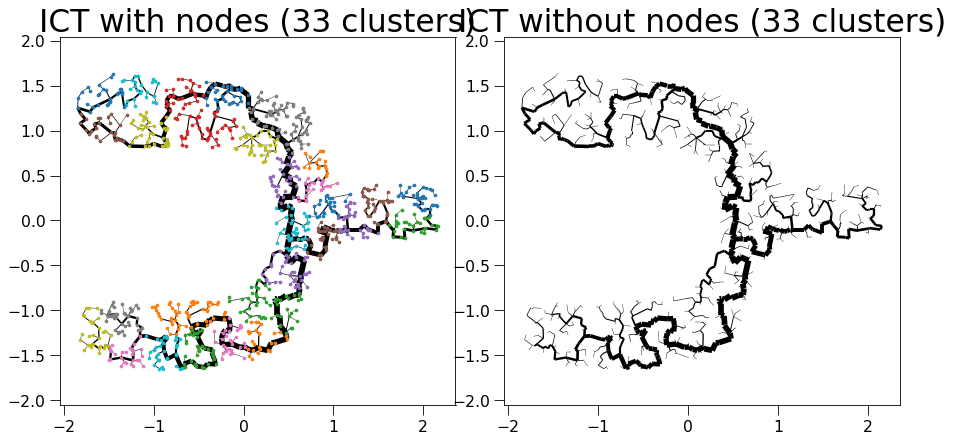

sklearn is done: 0.16861510276794434
My own part is done: 0.0013031959533691406


  0%|          | 0/34 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 207 -> 182
update Arr 182 -> 163
update Arr 163 -> 147
update Arr 147 -> 129
update Arr 129 -> 114
update Arr 114 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 135
update Arr 135 -> 119
update Arr 119 -> 102
update Arr 102 -> 87
update Arr 87 -> 76
update Arr 76 -> 69
update Arr 69 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 285 -> 256
update Arr 256 -> 228
update Arr 228 -> 207
update Arr 207 -> 186
update Arr 186 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 118
update Arr 118 -> 104
update Arr 104 -> 93
update Arr 93 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 48
update Arr 48 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 123
update Arr 123 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 268 -> 234
update Arr 234 -> 210
update Arr 210 -> 182
update Arr 182 -> 164
update Arr 164 -> 144
update Arr 144 -> 128
update Arr 128 -> 116
update Arr 116 -> 99
update Arr 99 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 201 -> 176
update Arr 176 -> 153
update Arr 153 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 87
update Arr 87 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 246 -> 220
update Arr 220 -> 182
update Arr 182 -> 162
update Arr 162 -> 140
update Arr 140 -> 125
update Arr 125 -> 109
update Arr 109 -> 99
update Arr 99 -> 82
update Arr 82 -> 65
update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 46
update Arr 46 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 184
update Arr 184 -> 160
update Arr 160 -> 145
update Arr 145 -> 129
update Arr 129 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 54
update Arr 54 -> 47
update Arr 47 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 188 -> 161
update Arr 161 -> 134
update Arr 134 -> 119
update Arr 119 -> 106
update Arr 106 -> 93
update Arr 93 -> 84
update Arr 84 -> 73
update Arr 73 -> 64
update Arr 64 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 30
update Arr 30 -> 28
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 79
update Arr 79 -> 68
update Arr 68 -> 59
update Arr 59 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 25
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 129
update Arr 129 -> 113
update Arr 113 -> 101
update Arr 101 -> 82
update Arr 82 -> 61
update Arr 61 -> 55
update Arr 55 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 200 -> 175
update Arr 175 -> 136
update Arr 136 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 58
update Arr 58 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 210 -> 181
update Arr 181 -> 151
update Arr 151 -> 135
update Arr 135 -> 119
update Arr 119 -> 107
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 191 -> 170
update Arr 170 -> 154
update Arr 154 -> 131
update Arr 131 -> 115
update Arr 115 -> 102
update Arr 102 -> 86
update Arr 86 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 175 -> 135
update Arr 135 -> 121
update Arr 121 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 78
update Arr 78 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 157
update Arr 157 -> 142
update Arr 142 -> 129
update Arr 129 -> 112
update Arr 112 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 151
update Arr 151 -> 135
update Arr 135 -> 116
update Arr 116 -> 99
update Arr 99 -> 89
update Arr 89 -> 76
update Arr 76 -> 69
update Arr 69 -> 58
update Arr 58 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 240 -> 204
update Arr 204 -> 184
update Arr 184 -> 149
update Arr 149 -> 133
update Arr 133 -> 115
update Arr 115 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 43
update Arr 43 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 34
update Arr 34 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 280 -> 252
update Arr 252 -> 223
update Arr 223 -> 201
update Arr 201 -> 176
update Arr 176 -> 158
update Arr 158 -> 135
update Arr 135 -> 113
update Arr 113 -> 101
update Arr 101 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 229 -> 200
update Arr 200 -> 178
update Arr 178 -> 159
update Arr 159 -> 140
update Arr 140 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 77
update Arr 77 -> 63
update Arr 63 -> 56
update Arr 56 -> 50
update Arr 50 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 150
update Arr 150 -> 134
update Arr 134 -> 119
update Arr 119 -> 107
update Arr 107 -> 93
update Arr 93 -> 84
update Arr 84 -> 67
update Arr 67 -> 53
update Arr 53 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 231 -> 197
update Arr 197 -> 164
update Arr 164 -> 144
update Arr 144 -> 128
update Arr 128 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 169
update Arr 169 -> 140
update Arr 140 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 241 -> 214
update Arr 214 -> 182
update Arr 182 -> 164
update Arr 164 -> 147
update Arr 147 -> 127
update Arr 127 -> 115
update Arr 115 -> 97
update Arr 97 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 227 -> 200
update Arr 200 -> 175
update Arr 175 -> 156
update Arr 156 -> 137
update Arr 137 -> 124
update Arr 124 -> 111
update Arr 111 -> 98
update Arr 98 -> 85
update Arr 85 -> 76
update Arr 76 -> 66
update Arr 66 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 130
update Arr 130 -> 106
update Arr 106 -> 94
update Arr 94 -> 81
update Arr 81 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 137
update Arr 137 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 117
update Arr 117 -> 105
update Arr 105 -> 90
update Arr 90 -> 79
update Arr 79 -> 65
update Arr 65 -> 54
update Arr 54 -> 44
update Arr 44 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 153
update Arr 153 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 97
update Arr 97 -> 86
update Arr 86 -> 71
update Arr 71 -> 61
update Arr 61 -> 53
update Arr 53 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24


Patching the components together:   0%|          | 0/34 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1065 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1065 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1065 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 3 edges early


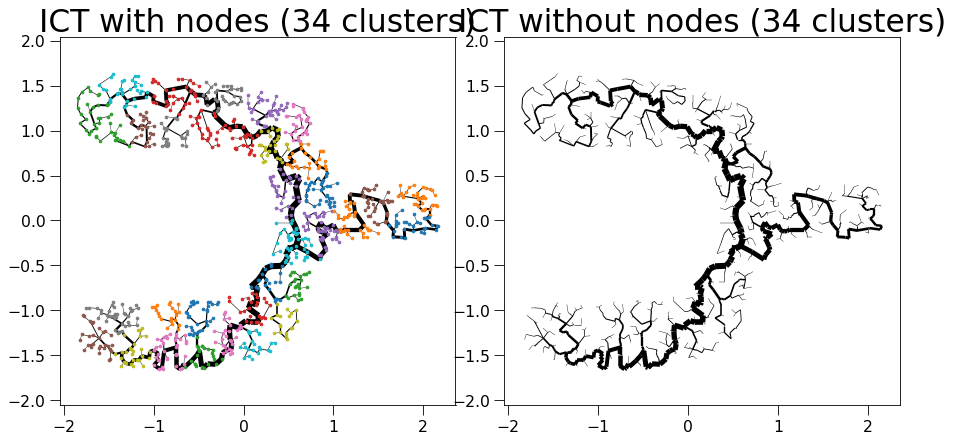

sklearn is done: 0.17739343643188477
My own part is done: 0.0011255741119384766


  0%|          | 0/35 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 145
update Arr 145 -> 123
update Arr 123 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 176 -> 145
update Arr 145 -> 130
update Arr 130 -> 116
update Arr 116 -> 96
update Arr 96 -> 80
update Arr 80 -> 70
update Arr 70 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 256 -> 228
update Arr 228 -> 187
update Arr 187 -> 168
update Arr 168 -> 150
update Arr 150 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 63
update Arr 63 -> 53
update Arr 53 -> 45
update Arr 45 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 189
update Arr 189 -> 169
update Arr 169 -> 150
update Arr 150 -> 130
update Arr 130 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 48
update Arr 48 -> 42
update Arr 42 -> 42
update Arr 42 -> 37
update Arr 37 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 215 -> 189
update Arr 189 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 104
update Arr 104 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 45
update Arr 45 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 164 -> 149
update Arr 149 -> 133
update Arr 133 -> 117
update Arr 117 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 65
update Arr 65 -> 57
update Arr 57 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 217 -> 194
update Arr 194 -> 167
update Arr 167 -> 141
update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 62
update Arr 62 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 226 -> 205
update Arr 205 -> 179
update Arr 179 -> 159
update Arr 159 -> 141
update Arr 141 -> 126
update Arr 126 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 117
update Arr 117 -> 91
update Arr 91 -> 82
update Arr 82 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 156
update Arr 156 -> 125
update Arr 125 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 206 -> 168
update Arr 168 -> 144
update Arr 144 -> 127
update Arr 127 -> 111
update Arr 111 -> 96
update Arr 96 -> 79
update Arr 79 -> 71
update Arr 71 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 203 -> 181
update Arr 181 -> 155
update Arr 155 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 100
update Arr 100 -> 86
update Arr 86 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 146
update Arr 146 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 280 -> 254
update Arr 254 -> 225
update Arr 225 -> 191
update Arr 191 -> 171
update Arr 171 -> 148
update Arr 148 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 91
update Arr 91 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/199 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/199 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 199 -> 180
update Arr 180 -> 156
update Arr 156 -> 139
update Arr 139 -> 117
update Arr 117 -> 100
update Arr 100 -> 86
update Arr 86 -> 74
update Arr 74 -> 66
update Arr 66 -> 56
update Arr 56 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 187 -> 165
update Arr 165 -> 145
update Arr 145 -> 131
update Arr 131 -> 118
update Arr 118 -> 105
update Arr 105 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 128
update Arr 128 -> 107
update Arr 107 -> 95
update Arr 95 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 191
update Arr 191 -> 167
update Arr 167 -> 148
update Arr 148 -> 134
update Arr 134 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 81
update Arr 81 -> 64
update Arr 64 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 249 -> 210
update Arr 210 -> 178
update Arr 178 -> 156
update Arr 156 -> 141
update Arr 141 -> 122
update Arr 122 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 73
update Arr 73 -> 66
update Arr 66 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 40
update Arr 40 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 91
update Arr 91 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 101
update Arr 101 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 142
update Arr 142 -> 124
update Arr 124 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 198 -> 172
update Arr 172 -> 139
update Arr 139 -> 122
update Arr 122 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 165
update Arr 165 -> 143
update Arr 143 -> 126
update Arr 126 -> 111
update Arr 111 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 138
update Arr 138 -> 125
update Arr 125 -> 90
update Arr 90 -> 75
update Arr 75 -> 66
update Arr 66 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 158
update Arr 158 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 89
update Arr 89 -> 80
update Arr 80 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 179 -> 155
update Arr 155 -> 136
update Arr 136 -> 117
update Arr 117 -> 100
update Arr 100 -> 89
update Arr 89 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 157
update Arr 157 -> 141
update Arr 141 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 235 -> 206
update Arr 206 -> 184
update Arr 184 -> 160
update Arr 160 -> 134
update Arr 134 -> 119
update Arr 119 -> 89
update Arr 89 -> 77
update Arr 77 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 42
update Arr 42 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 61
update Arr 61 -> 55
update Arr 55 -> 44
update Arr 44 -> 34
update Arr 34 -> 30
update Arr 30 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 139
update Arr 139 -> 118
update Arr 118 -> 104
update Arr 104 -> 91
update Arr 91 -> 76
update Arr 76 -> 65
update Arr 65 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25


Patching the components together:   0%|          | 0/35 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1061 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1061 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1061 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000


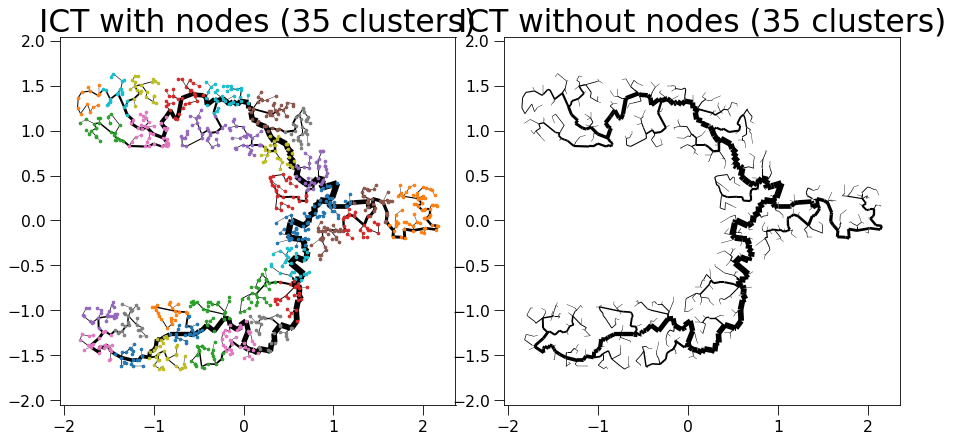

sklearn is done: 0.17652320861816406
My own part is done: 0.0013706684112548828


  0%|          | 0/36 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 52
update Arr 52 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 244 -> 219
update Arr 219 -> 194
update Arr 194 -> 166
update Arr 166 -> 150
update Arr 150 -> 132
update Arr 132 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 65
update Arr 65 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 221 -> 196
update Arr 196 -> 175
update Arr 175 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 99
update Arr 99 -> 88
update Arr 88 -> 76
update Arr 76 -> 68
update Arr 68 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 194 -> 164
update Arr 164 -> 144
update Arr 144 -> 124
update Arr 124 -> 111
update Arr 111 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 64
update Arr 64 -> 54
update Arr 54 -> 43
update Arr 43 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 163
update Arr 163 -> 145
update Arr 145 -> 129
update Arr 129 -> 114
update Arr 114 -> 101
update Arr 101 -> 90
update Arr 90 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 153
update Arr 153 -> 134
update Arr 134 -> 120
update Arr 120 -> 87
update Arr 87 -> 72
update Arr 72 -> 58
update Arr 58 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 179 -> 155
update Arr 155 -> 136
update Arr 136 -> 117
update Arr 117 -> 100
update Arr 100 -> 89
update Arr 89 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 273 -> 248
update Arr 248 -> 214
update Arr 214 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 77
update Arr 77 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 196 -> 178
update Arr 178 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 219 -> 183
update Arr 183 -> 163
update Arr 163 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 101
update Arr 101 -> 91
update Arr 91 -> 81
update Arr 81 -> 67
update Arr 67 -> 51
update Arr 51 -> 42
update Arr 42 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 188 -> 170
update Arr 170 -> 149
update Arr 149 -> 129
update Arr 129 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 57
update Arr 57 -> 51
update Arr 51 -> 39
update Arr 39 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 228 -> 192
update Arr 192 -> 171
update Arr 171 -> 153
update Arr 153 -> 132
update Arr 132 -> 112
update Arr 112 -> 95
update Arr 95 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 148
update Arr 148 -> 128
update Arr 128 -> 116
update Arr 116 -> 97
update Arr 97 -> 78
update Arr 78 -> 67
update Arr 67 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 158
update Arr 158 -> 141
update Arr 141 -> 128
update Arr 128 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 142
update Arr 142 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 82
update Arr 82 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 35
update Arr 35 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 168 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 106
update Arr 106 -> 96
update Arr 96 -> 80
update Arr 80 -> 67
update Arr 67 -> 60
update Arr 60 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 157
update Arr 157 -> 142
update Arr 142 -> 115
update Arr 115 -> 99
update Arr 99 -> 87
update Arr 87 -> 71
update Arr 71 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 134
update Arr 134 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 149
update Arr 149 -> 132
update Arr 132 -> 119
update Arr 119 -> 102
update Arr 102 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 204 -> 179
update Arr 179 -> 141
update Arr 141 -> 122
update Arr 122 -> 108
update Arr 108 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 42
update Arr 42 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 150
update Arr 150 -> 134
update Arr 134 -> 119
update Arr 119 -> 106
update Arr 106 -> 90
update Arr 90 -> 79
update Arr 79 -> 66
update Arr 66 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 168
update Arr 168 -> 150
update Arr 150 -> 132
update Arr 132 -> 107
update Arr 107 -> 97
update Arr 97 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 192 -> 166
update Arr 166 -> 145
update Arr 145 -> 124
update Arr 124 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 136
update Arr 136 -> 114
update Arr 114 -> 99
update Arr 99 -> 85
update Arr 85 -> 70
update Arr 70 -> 63
update Arr 63 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 195 -> 172
update Arr 172 -> 155
update Arr 155 -> 135
update Arr 135 -> 117
update Arr 117 -> 102
update Arr 102 -> 87
update Arr 87 -> 76
update Arr 76 -> 58
update Arr 58 -> 48
update Arr 48 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 260 -> 228
update Arr 228 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 130
update Arr 130 -> 116
update Arr 116 -> 103
update Arr 103 -> 88
update Arr 88 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 178 -> 152
update Arr 152 -> 117
update Arr 117 -> 98
update Arr 98 -> 82
update Arr 82 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 146
update Arr 146 -> 123
update Arr 123 -> 110
update Arr 110 -> 87
update Arr 87 -> 72
update Arr 72 -> 59
update Arr 59 -> 47
update Arr 47 -> 40
update Arr 40 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 215 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 133
update Arr 133 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 79
update Arr 79 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 187
update Arr 187 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 121
update Arr 121 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 145
update Arr 145 -> 127
update Arr 127 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 76
update Arr 76 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 57
update Arr 57 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 117
update Arr 117 -> 105
update Arr 105 -> 90
update Arr 90 -> 79
update Arr 79 -> 65
update Arr 65 -> 54
update Arr 54 -> 44
update Arr 44 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 148 -> 120
update Arr 120 -> 105
update Arr 105 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 44
update Arr 44 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 22


Patching the components together:   0%|          | 0/36 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1060 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1060 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1060 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 4 edges early


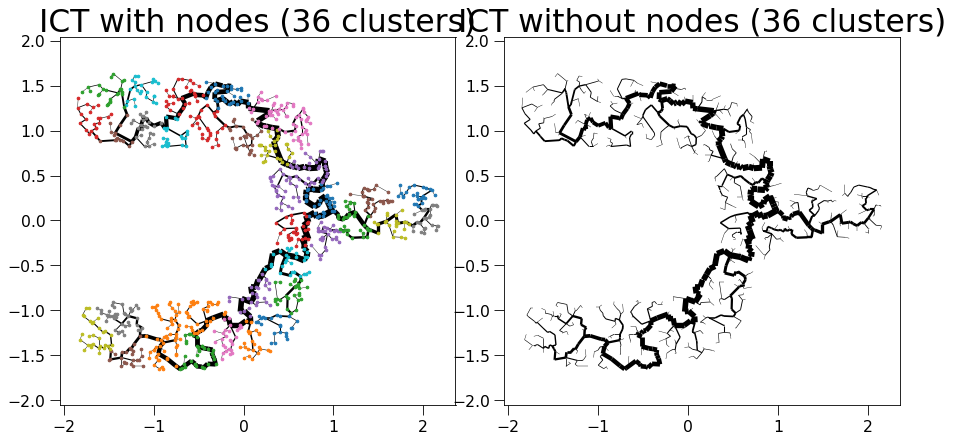

sklearn is done: 0.19010591506958008
My own part is done: 0.0014395713806152344


  0%|          | 0/37 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/297 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/297 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 297 -> 248
update Arr 248 -> 222
update Arr 222 -> 196
update Arr 196 -> 174
update Arr 174 -> 158
update Arr 158 -> 133
update Arr 133 -> 118
update Arr 118 -> 96
update Arr 96 -> 82
update Arr 82 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 159
update Arr 159 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 39
update Arr 39 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 107
update Arr 107 -> 93
update Arr 93 -> 84
update Arr 84 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 113
update Arr 113 -> 102
update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 38
update Arr 38 -> 31
update Arr 31 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 192 -> 166
update Arr 166 -> 145
update Arr 145 -> 124
update Arr 124 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/199 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/199 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 199 -> 179
update Arr 179 -> 160
update Arr 160 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 95
update Arr 95 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 176
update Arr 176 -> 159
update Arr 159 -> 140
update Arr 140 -> 127
update Arr 127 -> 111
update Arr 111 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 42
update Arr 42 -> 40
update Arr 40 -> 33
update Arr 33 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 194 -> 168
update Arr 168 -> 149
update Arr 149 -> 135
update Arr 135 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 78
update Arr 78 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 42
update Arr 42 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 222 -> 186
update Arr 186 -> 167
update Arr 167 -> 143
update Arr 143 -> 124
update Arr 124 -> 109
update Arr 109 -> 95
update Arr 95 -> 80
update Arr 80 -> 60
update Arr 60 -> 50
update Arr 50 -> 40
update Arr 40 -> 37
update Arr 37 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 202 -> 176
update Arr 176 -> 159
update Arr 159 -> 133
update Arr 133 -> 116
update Arr 116 -> 101
update Arr 101 -> 91
update Arr 91 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 164
update Arr 164 -> 142
update Arr 142 -> 116
update Arr 116 -> 103
update Arr 103 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 145
update Arr 145 -> 129
update Arr 129 -> 112
update Arr 112 -> 86
update Arr 86 -> 77
update Arr 77 -> 62
update Arr 62 -> 50
update Arr 50 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 150
update Arr 150 -> 126
update Arr 126 -> 113
update Arr 113 -> 94
update Arr 94 -> 81
update Arr 81 -> 64
update Arr 64 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 219 -> 183
update Arr 183 -> 163
update Arr 163 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 101
update Arr 101 -> 91
update Arr 91 -> 81
update Arr 81 -> 67
update Arr 67 -> 51
update Arr 51 -> 42
update Arr 42 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 141
update Arr 141 -> 125
update Arr 125 -> 105
update Arr 105 -> 94
update Arr 94 -> 83
update Arr 83 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 197 -> 150
update Arr 150 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 73
update Arr 73 -> 66
update Arr 66 -> 52
update Arr 52 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 75
update Arr 75 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 233 -> 209
update Arr 209 -> 185
update Arr 185 -> 165
update Arr 165 -> 146
update Arr 146 -> 127
update Arr 127 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 146
update Arr 146 -> 123
update Arr 123 -> 107
update Arr 107 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 60
update Arr 60 -> 44
update Arr 44 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 202 -> 170
update Arr 170 -> 147
update Arr 147 -> 131
update Arr 131 -> 119
update Arr 119 -> 104
update Arr 104 -> 94
update Arr 94 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 31
update Arr 31 -> 30
update Arr 30 -> 30
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 204 -> 175
update Arr 175 -> 158
update Arr 158 -> 143
update Arr 143 -> 123
update Arr 123 -> 109
update Arr 109 -> 97
update Arr 97 -> 79
update Arr 79 -> 70
update Arr 70 -> 60
update Arr 60 -> 46
update Arr 46 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 30
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 222 -> 192
update Arr 192 -> 174
update Arr 174 -> 154
update Arr 154 -> 133
update Arr 133 -> 117
update Arr 117 -> 106
update Arr 106 -> 85
update Arr 85 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 251 -> 226
update Arr 226 -> 198
update Arr 198 -> 176
update Arr 176 -> 158
update Arr 158 -> 142
update Arr 142 -> 127
update Arr 127 -> 112
update Arr 112 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 108
update Arr 108 -> 91
update Arr 91 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 44
update Arr 44 -> 33
update Arr 33 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 57
update Arr 57 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 157
update Arr 157 -> 141
update Arr 141 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 81
update Arr 81 -> 70
update Arr 70 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 175 -> 156
update Arr 156 -> 134
update Arr 134 -> 119
update Arr 119 -> 105
update Arr 105 -> 93
update Arr 93 -> 73
update Arr 73 -> 64
update Arr 64 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 159
update Arr 159 -> 144
update Arr 144 -> 128
update Arr 128 -> 107
update Arr 107 -> 91
update Arr 91 -> 80
update Arr 80 -> 67
update Arr 67 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28


Patching the components together:   0%|          | 0/37 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1061 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1061 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1061 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 999
added 4 edges early


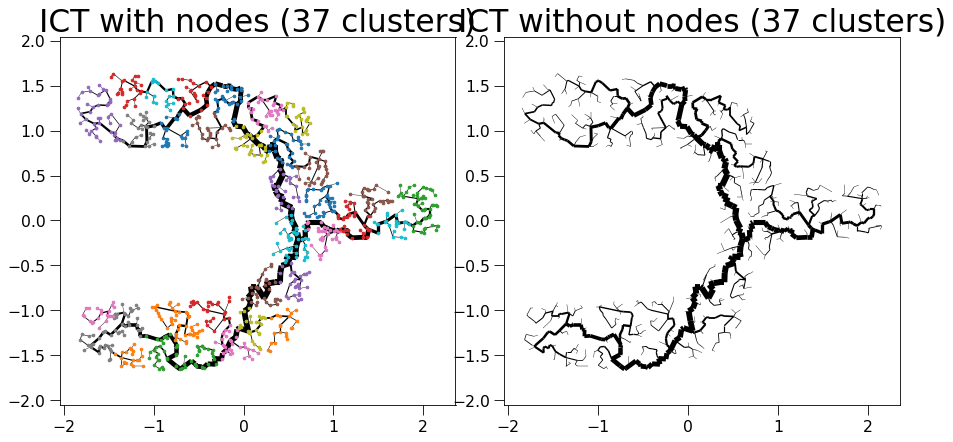

sklearn is done: 0.18772006034851074
My own part is done: 0.0011527538299560547


  0%|          | 0/38 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 101
update Arr 101 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 227 -> 199
update Arr 199 -> 179
update Arr 179 -> 161
update Arr 161 -> 144
update Arr 144 -> 127
update Arr 127 -> 114
update Arr 114 -> 99
update Arr 99 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 67
update Arr 67 -> 57
update Arr 57 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 196 -> 168
update Arr 168 -> 151
update Arr 151 -> 127
update Arr 127 -> 115
update Arr 115 -> 101
update Arr 101 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 52
update Arr 52 -> 47
update Arr 47 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 149
update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 105
update Arr 105 -> 93
update Arr 93 -> 73
update Arr 73 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 234 -> 200
update Arr 200 -> 168
update Arr 168 -> 148
update Arr 148 -> 131
update Arr 131 -> 116
update Arr 116 -> 101
update Arr 101 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 233 -> 204
update Arr 204 -> 160
update Arr 160 -> 141
update Arr 141 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 35
update Arr 35 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 106
update Arr 106 -> 94
update Arr 94 -> 85
update Arr 85 -> 73
update Arr 73 -> 56
update Arr 56 -> 47
update Arr 47 -> 37
update Arr 37 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 84
update Arr 84 -> 69
update Arr 69 -> 52
update Arr 52 -> 40
update Arr 40 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 90
update Arr 90 -> 69
update Arr 69 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 234 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 120
update Arr 120 -> 102
update Arr 102 -> 92
update Arr 92 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 245 -> 211
update Arr 211 -> 187
update Arr 187 -> 168
update Arr 168 -> 148
update Arr 148 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 105
update Arr 105 -> 90
update Arr 90 -> 80
update Arr 80 -> 72
update Arr 72 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 154
update Arr 154 -> 123
update Arr 123 -> 106
update Arr 106 -> 94
update Arr 94 -> 83
update Arr 83 -> 75
update Arr 75 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 133
update Arr 133 -> 114
update Arr 114 -> 102
update Arr 102 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 233 -> 209
update Arr 209 -> 185
update Arr 185 -> 165
update Arr 165 -> 146
update Arr 146 -> 127
update Arr 127 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 177 -> 149
update Arr 149 -> 131
update Arr 131 -> 116
update Arr 116 -> 103
update Arr 103 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 201
update Arr 201 -> 176
update Arr 176 -> 158
update Arr 158 -> 142
update Arr 142 -> 125
update Arr 125 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 62
update Arr 62 -> 56
update Arr 56 -> 44
update Arr 44 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 37
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 128
update Arr 128 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 75
update Arr 75 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
update Arr 66 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 188 -> 168
update Arr 168 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 109
update Arr 109 -> 94
update Arr 94 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 99
update Arr 99 -> 82
update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 164
update Arr 164 -> 137
update Arr 137 -> 124
update Arr 124 -> 100
update Arr 100 -> 84
update Arr 84 -> 72
update Arr 72 -> 61
update Arr 61 -> 51
update Arr 51 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 114
update Arr 114 -> 98
update Arr 98 -> 80
update Arr 80 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 35
update Arr 35 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 156
update Arr 156 -> 140
update Arr 140 -> 125
update Arr 125 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 176
update Arr 176 -> 159
update Arr 159 -> 140
update Arr 140 -> 127
update Arr 127 -> 111
update Arr 111 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 42
update Arr 42 -> 40
update Arr 40 -> 33
update Arr 33 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 196 -> 176
update Arr 176 -> 156
update Arr 156 -> 136
update Arr 136 -> 123
update Arr 123 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 65
update Arr 65 -> 59
update Arr 59 -> 46
update Arr 46 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 163
update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 106
update Arr 106 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 91
update Arr 91 -> 76
update Arr 76 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 141
update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 95
update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 122
update Arr 122 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 120
update Arr 120 -> 102
update Arr 102 -> 90
update Arr 90 -> 80
update Arr 80 -> 72
update Arr 72 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 196 -> 162
update Arr 162 -> 141
update Arr 141 -> 126
update Arr 126 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 72
update Arr 72 -> 63
update Arr 63 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30


Patching the components together:   0%|          | 0/38 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1072 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1072 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1072 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


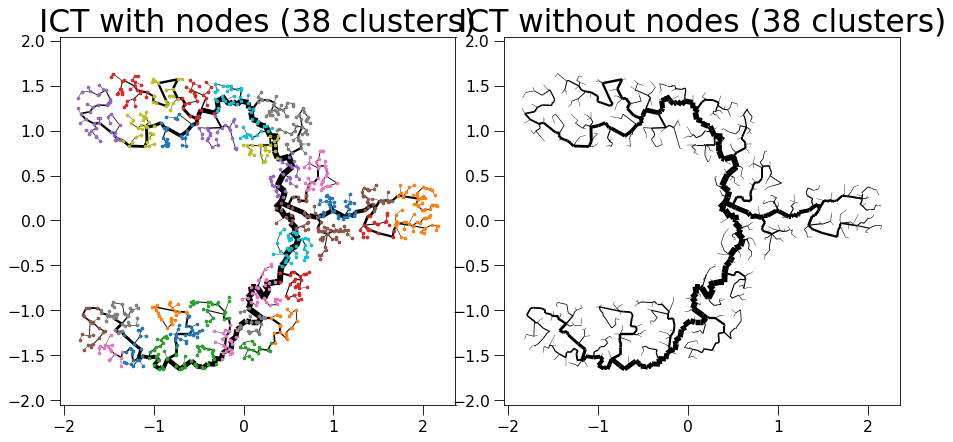

sklearn is done: 0.18851161003112793
My own part is done: 0.0014309883117675781


  0%|          | 0/39 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 143
update Arr 143 -> 129
update Arr 129 -> 114
update Arr 114 -> 74
update Arr 74 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 185 -> 158
update Arr 158 -> 142
update Arr 142 -> 127
update Arr 127 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 60
update Arr 60 -> 53
update Arr 53 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 270 -> 236
update Arr 236 -> 212
update Arr 212 -> 190
update Arr 190 -> 166
update Arr 166 -> 142
update Arr 142 -> 122
update Arr 122 -> 109
update Arr 109 -> 95
update Arr 95 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 41
update Arr 41 -> 39
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 167
update Arr 167 -> 150
update Arr 150 -> 136
update Arr 136 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 73
update Arr 73 -> 64
update Arr 64 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 207 -> 174
update Arr 174 -> 157
update Arr 157 -> 141
update Arr 141 -> 118
update Arr 118 -> 105
update Arr 105 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 169
update Arr 169 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 86
update Arr 86 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 203
update Arr 203 -> 173
update Arr 173 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 108
update Arr 108 -> 92
update Arr 92 -> 76
update Arr 76 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/232 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/232 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 232 -> 207
update Arr 207 -> 176
update Arr 176 -> 156
update Arr 156 -> 133
update Arr 133 -> 120
update Arr 120 -> 105
update Arr 105 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 148
update Arr 148 -> 131
update Arr 131 -> 119
update Arr 119 -> 102
update Arr 102 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 127
update Arr 127 -> 115
update Arr 115 -> 98
update Arr 98 -> 79
update Arr 79 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 158
update Arr 158 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 165 -> 144
update Arr 144 -> 128
update Arr 128 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 201 -> 166
update Arr 166 -> 148
update Arr 148 -> 134
update Arr 134 -> 119
update Arr 119 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 64
update Arr 64 -> 56
update Arr 56 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 123
update Arr 123 -> 103
update Arr 103 -> 92
update Arr 92 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 120
update Arr 120 -> 105
update Arr 105 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 57
update Arr 57 -> 48
update Arr 48 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 177 -> 145
update Arr 145 -> 126
update Arr 126 -> 114
update Arr 114 -> 100
update Arr 100 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 220 -> 194
update Arr 194 -> 167
update Arr 167 -> 146
update Arr 146 -> 128
update Arr 128 -> 115
update Arr 115 -> 99
update Arr 99 -> 86
update Arr 86 -> 75
update Arr 75 -> 67
update Arr 67 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 103
update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 57
update Arr 57 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 75
update Arr 75 -> 62
update Arr 62 -> 49
update Arr 49 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 142
update Arr 142 -> 127
update Arr 127 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 71
update Arr 71 -> 59
update Arr 59 -> 51
update Arr 51 -> 41
update Arr 41 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 96
update Arr 96 -> 82
update Arr 82 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 101
update Arr 101 -> 88
update Arr 88 -> 76
update Arr 76 -> 66
update Arr 66 -> 59
update Arr 59 -> 44
update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 185
update Arr 185 -> 160
update Arr 160 -> 142
update Arr 142 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 146
update Arr 146 -> 131
update Arr 131 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 163
update Arr 163 -> 134
update Arr 134 -> 118
update Arr 118 -> 99
update Arr 99 -> 83
update Arr 83 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 188 -> 156
update Arr 156 -> 141
update Arr 141 -> 122
update Arr 122 -> 106
update Arr 106 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 108
update Arr 108 -> 97
update Arr 97 -> 82
update Arr 82 -> 63
update Arr 63 -> 52
update Arr 52 -> 43
update Arr 43 -> 37
update Arr 37 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 127
update Arr 127 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 134
update Arr 134 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25


Patching the components together:   0%|          | 0/39 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1068 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1068 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1068 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 5 edges early


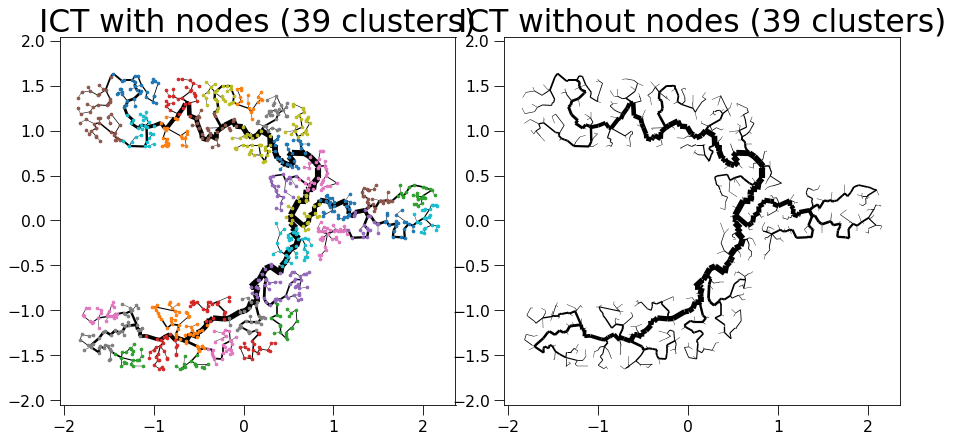

sklearn is done: 0.1932659149169922
My own part is done: 0.0014820098876953125


  0%|          | 0/40 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 154
update Arr 154 -> 136
update Arr 136 -> 119
update Arr 119 -> 108
update Arr 108 -> 92
update Arr 92 -> 83
update Arr 83 -> 75
update Arr 75 -> 61
update Arr 61 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 136
update Arr 136 -> 118
update Arr 118 -> 103
update Arr 103 -> 93
update Arr 93 -> 84
update Arr 84 -> 63
update Arr 63 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 155
update Arr 155 -> 140
update Arr 140 -> 119
update Arr 119 -> 103
update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 61
update Arr 61 -> 52
update Arr 52 -> 39
update Arr 39 -> 35
update Arr 35 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 243 -> 207
update Arr 207 -> 178
update Arr 178 -> 156
update Arr 156 -> 139
update Arr 139 -> 121
update Arr 121 -> 107
update Arr 107 -> 95
update Arr 95 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 119
update Arr 119 -> 107
update Arr 107 -> 93
update Arr 93 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 43
update Arr 43 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 21
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 175 -> 154
update Arr 154 -> 122
update Arr 122 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/248 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/248 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 248 -> 220
update Arr 220 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 74
update Arr 74 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 60
update Arr 60 -> 50
update Arr 50 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 195 -> 159
update Arr 159 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 168
update Arr 168 -> 148
update Arr 148 -> 132
update Arr 132 -> 114
update Arr 114 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 67
update Arr 67 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 142
update Arr 142 -> 115
update Arr 115 -> 104
update Arr 104 -> 89
update Arr 89 -> 77
update Arr 77 -> 64
update Arr 64 -> 51
update Arr 51 -> 43
update Arr 43 -> 35
update Arr 35 -> 33
update Arr 33 -> 26
update Arr 26 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 178
update Arr 178 -> 152
update Arr 152 -> 130
update Arr 130 -> 112
update Arr 112 -> 95
update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 49
update Arr 49 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 108
update Arr 108 -> 91
update Arr 91 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 44
update Arr 44 -> 33
update Arr 33 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 139
update Arr 139 -> 118
update Arr 118 -> 104
update Arr 104 -> 91
update Arr 91 -> 76
update Arr 76 -> 65
update Arr 65 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 167 -> 147
update Arr 147 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 52
update Arr 52 -> 40
update Arr 40 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 100
update Arr 100 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 146
update Arr 146 -> 127
update Arr 127 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 100
update Arr 100 -> 86
update Arr 86 -> 75
update Arr 75 -> 61
update Arr 61 -> 52
update Arr 52 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 122
update Arr 122 -> 109
update Arr 109 -> 91
update Arr 91 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 119
update Arr 119 -> 102
update Arr 102 -> 88
update Arr 88 -> 70
update Arr 70 -> 63
update Arr 63 -> 56
update Arr 56 -> 48
update Arr 48 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 194
update Arr 194 -> 172
update Arr 172 -> 152
update Arr 152 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 65
update Arr 65 -> 55
update Arr 55 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 36
update Arr 36 -> 35
update Arr 35 -> 35
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 81
update Arr 81 -> 66
update Arr 66 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 154
update Arr 154 -> 128
update Arr 128 -> 116
update Arr 116 -> 103
update Arr 103 -> 90
update Arr 90 -> 71
update Arr 71 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 152
update Arr 152 -> 135
update Arr 135 -> 118
update Arr 118 -> 106
update Arr 106 -> 87
update Arr 87 -> 78
update Arr 78 -> 63
update Arr 63 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 160
update Arr 160 -> 143
update Arr 143 -> 116
update Arr 116 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 179 -> 138
update Arr 138 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 71
update Arr 71 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 140
update Arr 140 -> 123
update Arr 123 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 72
update Arr 72 -> 64
update Arr 64 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 126
update Arr 126 -> 112
update Arr 112 -> 93
update Arr 93 -> 81
update Arr 81 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 109
update Arr 109 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 125
update Arr 125 -> 107
update Arr 107 -> 94
update Arr 94 -> 85
update Arr 85 -> 71
update Arr 71 -> 63
update Arr 63 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 165
update Arr 165 -> 141
update Arr 141 -> 128
update Arr 128 -> 114
update Arr 114 -> 102
update Arr 102 -> 88
update Arr 88 -> 79
update Arr 79 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 97
update Arr 97 -> 85
update Arr 85 -> 74
update Arr 74 -> 65
update Arr 65 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 112
update Arr 112 -> 96
update Arr 96 -> 77
update Arr 77 -> 59
update Arr 59 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 120
update Arr 120 -> 104
update Arr 104 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 49
update Arr 49 -> 36
update Arr 36 -> 32
update Arr 32 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 21


Patching the components together:   0%|          | 0/40 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1067 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1067 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1067 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early


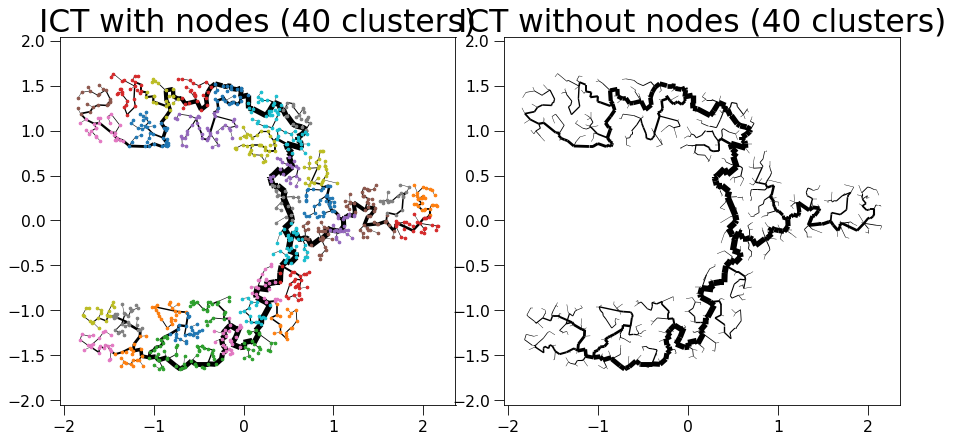

sklearn is done: 0.18629837036132812
My own part is done: 0.0013480186462402344


  0%|          | 0/41 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 97
update Arr 97 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 128
update Arr 128 -> 93
update Arr 93 -> 81
update Arr 81 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 22
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 219 -> 186
update Arr 186 -> 165
update Arr 165 -> 149
update Arr 149 -> 130
update Arr 130 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 57
update Arr 57 -> 45
update Arr 45 -> 44
update Arr 44 -> 44
update Arr 44 -> 39
update Arr 39 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 116
update Arr 116 -> 93
update Arr 93 -> 77
update Arr 77 -> 66
update Arr 66 -> 54
update Arr 54 -> 44
update Arr 44 -> 35
update Arr 35 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 75
update Arr 75 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 125
update Arr 125 -> 111
update Arr 111 -> 95
update Arr 95 -> 80
update Arr 80 -> 70
update Arr 70 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 143
update Arr 143 -> 126
update Arr 126 -> 110
update Arr 110 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 61
update Arr 61 -> 50
update Arr 50 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 158
update Arr 158 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 252 -> 215
update Arr 215 -> 192
update Arr 192 -> 169
update Arr 169 -> 148
update Arr 148 -> 133
update Arr 133 -> 114
update Arr 114 -> 100
update Arr 100 -> 87
update Arr 87 -> 70
update Arr 70 -> 55
update Arr 55 -> 49
update Arr 49 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 244 -> 201
update Arr 201 -> 176
update Arr 176 -> 153
update Arr 153 -> 137
update Arr 137 -> 121
update Arr 121 -> 105
update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 52
update Arr 52 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 141
update Arr 141 -> 123
update Arr 123 -> 110
update Arr 110 -> 95
update Arr 95 -> 77
update Arr 77 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 105
update Arr 105 -> 92
update Arr 92 -> 82
update Arr 82 -> 71
update Arr 71 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 162
update Arr 162 -> 141
update Arr 141 -> 128
update Arr 128 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 72
update Arr 72 -> 64
update Arr 64 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 81
update Arr 81 -> 66
update Arr 66 -> 57
update Arr 57 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 126
update Arr 126 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 185 -> 152
update Arr 152 -> 138
update Arr 138 -> 121
update Arr 121 -> 109
update Arr 109 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 53
update Arr 53 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 100
update Arr 100 -> 89
update Arr 89 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 221 -> 197
update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 129
update Arr 129 -> 115
update Arr 115 -> 99
update Arr 99 -> 85
update Arr 85 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 182 -> 161
update Arr 161 -> 138
update Arr 138 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 220 -> 192
update Arr 192 -> 168
update Arr 168 -> 141
update Arr 141 -> 128
update Arr 128 -> 108
update Arr 108 -> 94
update Arr 94 -> 81
update Arr 81 -> 64
update Arr 64 -> 56
update Arr 56 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 144
update Arr 144 -> 129
update Arr 129 -> 114
update Arr 114 -> 95
update Arr 95 -> 85
update Arr 85 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 146
update Arr 146 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 163
update Arr 163 -> 135
update Arr 135 -> 115
update Arr 115 -> 94
update Arr 94 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 139
update Arr 139 -> 104
update Arr 104 -> 92
update Arr 92 -> 77
update Arr 77 -> 66
update Arr 66 -> 54
update Arr 54 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 163
update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 106
update Arr 106 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 90
update Arr 90 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 35
update Arr 35 -> 27
update Arr 27 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 101
update Arr 101 -> 80
update Arr 80 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/199 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/199 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 199 -> 163
update Arr 163 -> 145
update Arr 145 -> 129
update Arr 129 -> 114
update Arr 114 -> 102
update Arr 102 -> 85
update Arr 85 -> 74
update Arr 74 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 131
update Arr 131 -> 119
update Arr 119 -> 83
update Arr 83 -> 75
update Arr 75 -> 62
update Arr 62 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 168 -> 142
update Arr 142 -> 120
update Arr 120 -> 101
update Arr 101 -> 90
update Arr 90 -> 79
update Arr 79 -> 64
update Arr 64 -> 57
update Arr 57 -> 44
update Arr 44 -> 35
update Arr 35 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 121
update Arr 121 -> 106
update Arr 106 -> 83
update Arr 83 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 35
update Arr 35 -> 29
update Arr 29 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 125
update Arr 125 -> 111
update Arr 111 -> 100
update Arr 100 -> 73
update Arr 73 -> 64
update Arr 64 -> 49
update Arr 49 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 96
update Arr 96 -> 75
update Arr 75 -> 65
update Arr 65 -> 55
update Arr 55 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/41 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1065 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1065 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1065 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


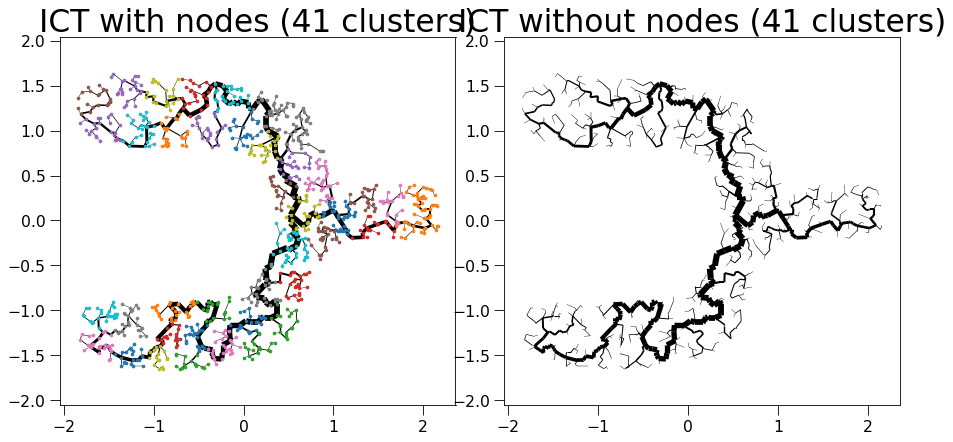

sklearn is done: 0.20459413528442383
My own part is done: 0.0013613700866699219


  0%|          | 0/42 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 146
update Arr 146 -> 127
update Arr 127 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 131
update Arr 131 -> 113
update Arr 113 -> 102
update Arr 102 -> 70
update Arr 70 -> 60
update Arr 60 -> 52
update Arr 52 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 206 -> 186
update Arr 186 -> 163
update Arr 163 -> 146
update Arr 146 -> 130
update Arr 130 -> 117
update Arr 117 -> 100
update Arr 100 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 86
update Arr 86 -> 60
update Arr 60 -> 51
update Arr 51 -> 45
update Arr 45 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 127
update Arr 127 -> 113
update Arr 113 -> 92
update Arr 92 -> 78
update Arr 78 -> 65
update Arr 65 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 169 -> 152
update Arr 152 -> 119
update Arr 119 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 141
update Arr 141 -> 123
update Arr 123 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 71
update Arr 71 -> 59
update Arr 59 -> 53
update Arr 53 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 91
update Arr 91 -> 76
update Arr 76 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 140
update Arr 140 -> 113
update Arr 113 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 48
update Arr 48 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 166
update Arr 166 -> 143
update Arr 143 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 83
update Arr 83 -> 71
update Arr 71 -> 62
update Arr 62 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 106
update Arr 106 -> 87
update Arr 87 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 97
update Arr 97 -> 78
update Arr 78 -> 66
update Arr 66 -> 52
update Arr 52 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 38
update Arr 38 -> 29
update Arr 29 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 164
update Arr 164 -> 146
update Arr 146 -> 126
update Arr 126 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 171
update Arr 171 -> 146
update Arr 146 -> 129
update Arr 129 -> 116
update Arr 116 -> 99
update Arr 99 -> 73
update Arr 73 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 161
update Arr 161 -> 144
update Arr 144 -> 130
update Arr 130 -> 114
update Arr 114 -> 102
update Arr 102 -> 89
update Arr 89 -> 75
update Arr 75 -> 66
update Arr 66 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 188 -> 159
update Arr 159 -> 144
update Arr 144 -> 123
update Arr 123 -> 109
update Arr 109 -> 77
update Arr 77 -> 65
update Arr 65 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 55
update Arr 55 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 101
update Arr 101 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 136
update Arr 136 -> 118
update Arr 118 -> 103
update Arr 103 -> 93
update Arr 93 -> 84
update Arr 84 -> 63
update Arr 63 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 129
update Arr 129 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 69
update Arr 69 -> 55
update Arr 55 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 171 -> 147
update Arr 147 -> 129
update Arr 129 -> 112
update Arr 112 -> 92
update Arr 92 -> 83
update Arr 83 -> 72
update Arr 72 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 122
update Arr 122 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 76
update Arr 76 -> 65
update Arr 65 -> 52
update Arr 52 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 203 -> 172
update Arr 172 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 95
update Arr 95 -> 85
update Arr 85 -> 74
update Arr 74 -> 63
update Arr 63 -> 47
update Arr 47 -> 38
update Arr 38 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 150
update Arr 150 -> 131
update Arr 131 -> 111
update Arr 111 -> 95
update Arr 95 -> 73
update Arr 73 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 99
update Arr 99 -> 77
update Arr 77 -> 61
update Arr 61 -> 48
update Arr 48 -> 39
update Arr 39 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 165 -> 138
update Arr 138 -> 110
update Arr 110 -> 92
update Arr 92 -> 81
update Arr 81 -> 69
update Arr 69 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 106
update Arr 106 -> 96
update Arr 96 -> 73
update Arr 73 -> 64
update Arr 64 -> 58
update Arr 58 -> 44
update Arr 44 -> 35
update Arr 35 -> 27
update Arr 27 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 253 -> 222
update Arr 222 -> 192
update Arr 192 -> 174
update Arr 174 -> 156
update Arr 156 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 94
update Arr 94 -> 83
update Arr 83 -> 69
update Arr 69 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 108
update Arr 108 -> 93
update Arr 93 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 103
update Arr 103 -> 89
update Arr 89 -> 61
update Arr 61 -> 55
update Arr 55 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 18


Patching the components together:   0%|          | 0/42 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1074 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1074 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1074 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


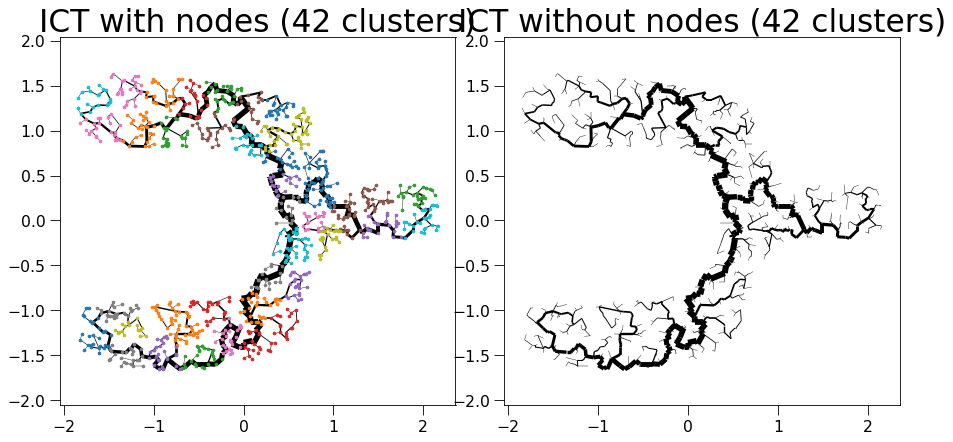

sklearn is done: 0.20055198669433594
My own part is done: 0.0011670589447021484


  0%|          | 0/43 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 81
update Arr 81 -> 66
update Arr 66 -> 52
update Arr 52 -> 47
update Arr 47 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 112
update Arr 112 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 103
update Arr 103 -> 90
update Arr 90 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 171 -> 140
update Arr 140 -> 123
update Arr 123 -> 109
update Arr 109 -> 97
update Arr 97 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 155
update Arr 155 -> 138
update Arr 138 -> 111
update Arr 111 -> 94
update Arr 94 -> 82
update Arr 82 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 86
update Arr 86 -> 60
update Arr 60 -> 51
update Arr 51 -> 45
update Arr 45 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 131
update Arr 131 -> 101
update Arr 101 -> 85
update Arr 85 -> 74
update Arr 74 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 97
update Arr 97 -> 73
update Arr 73 -> 63
update Arr 63 -> 52
update Arr 52 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 118
update Arr 118 -> 106
update Arr 106 -> 88
update Arr 88 -> 77
update Arr 77 -> 63
update Arr 63 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 185 -> 158
update Arr 158 -> 142
update Arr 142 -> 127
update Arr 127 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 60
update Arr 60 -> 53
update Arr 53 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 216 -> 193
update Arr 193 -> 163
update Arr 163 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 82
update Arr 82 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 130
update Arr 130 -> 113
update Arr 113 -> 101
update Arr 101 -> 82
update Arr 82 -> 65
update Arr 65 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 177 -> 159
update Arr 159 -> 144
update Arr 144 -> 128
update Arr 128 -> 110
update Arr 110 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 137
update Arr 137 -> 115
update Arr 115 -> 93
update Arr 93 -> 80
update Arr 80 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 185
update Arr 185 -> 158
update Arr 158 -> 137
update Arr 137 -> 119
update Arr 119 -> 106
update Arr 106 -> 90
update Arr 90 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 187 -> 155
update Arr 155 -> 136
update Arr 136 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 171 -> 147
update Arr 147 -> 129
update Arr 129 -> 112
update Arr 112 -> 92
update Arr 92 -> 83
update Arr 83 -> 72
update Arr 72 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 160
update Arr 160 -> 144
update Arr 144 -> 118
update Arr 118 -> 102
update Arr 102 -> 90
update Arr 90 -> 76
update Arr 76 -> 65
update Arr 65 -> 58
update Arr 58 -> 46
update Arr 46 -> 37
update Arr 37 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 163
update Arr 163 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 52
update Arr 52 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 120
update Arr 120 -> 109
update Arr 109 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 124
update Arr 124 -> 111
update Arr 111 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 152
update Arr 152 -> 135
update Arr 135 -> 113
update Arr 113 -> 101
update Arr 101 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 52
update Arr 52 -> 44
update Arr 44 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 48
update Arr 48 -> 38
update Arr 38 -> 34
update Arr 34 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 66
update Arr 66 -> 53
update Arr 53 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 26
update Arr 26 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 96
update Arr 96 -> 83
update Arr 83 -> 74
update Arr 74 -> 64
update Arr 64 -> 53
update Arr 53 -> 42
update Arr 42 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 122
update Arr 122 -> 98
update Arr 98 -> 85
update Arr 85 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 115
update Arr 115 -> 98
update Arr 98 -> 71
update Arr 71 -> 64
update Arr 64 -> 52
update Arr 52 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 127
update Arr 127 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 178 -> 153
update Arr 153 -> 131
update Arr 131 -> 111
update Arr 111 -> 96
update Arr 96 -> 87
update Arr 87 -> 76
update Arr 76 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 84
update Arr 84 -> 69
update Arr 69 -> 52
update Arr 52 -> 40
update Arr 40 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 126
update Arr 126 -> 113
update Arr 113 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 58
update Arr 58 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 106
update Arr 106 -> 89
update Arr 89 -> 78
update Arr 78 -> 57
update Arr 57 -> 44
update Arr 44 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 122
update Arr 122 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 196 -> 160
update Arr 160 -> 136
update Arr 136 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 84
update Arr 84 -> 72
update Arr 72 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 143
update Arr 143 -> 116
update Arr 116 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 60
update Arr 60 -> 51
update Arr 51 -> 45
update Arr 45 -> 32
update Arr 32 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 86
update Arr 86 -> 75
update Arr 75 -> 66
update Arr 66 -> 52
update Arr 52 -> 47
update Arr 47 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 156
update Arr 156 -> 140
update Arr 140 -> 125
update Arr 125 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 70
update Arr 70 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


Patching the components together:   0%|          | 0/43 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1078 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1078 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1078 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


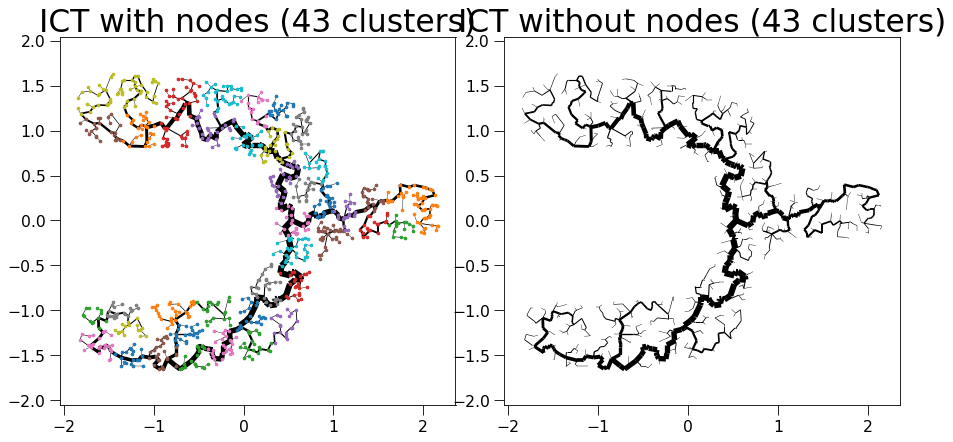

sklearn is done: 0.2086317539215088
My own part is done: 0.001283884048461914


  0%|          | 0/44 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 243 -> 215
update Arr 215 -> 193
update Arr 193 -> 161
update Arr 161 -> 144
update Arr 144 -> 129
update Arr 129 -> 117
update Arr 117 -> 99
update Arr 99 -> 89
update Arr 89 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 148
update Arr 148 -> 131
update Arr 131 -> 119
update Arr 119 -> 102
update Arr 102 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 50
update Arr 50 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/100 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/100 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 100 -> 75
update Arr 75 -> 66
update Arr 66 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 158
update Arr 158 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 133
update Arr 133 -> 116
update Arr 116 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 71
update Arr 71 -> 62
update Arr 62 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 170 -> 140
update Arr 140 -> 122
update Arr 122 -> 107
update Arr 107 -> 95
update Arr 95 -> 81
update Arr 81 -> 70
update Arr 70 -> 61
update Arr 61 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 162
update Arr 162 -> 143
update Arr 143 -> 118
update Arr 118 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 73
update Arr 73 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 138
update Arr 138 -> 122
update Arr 122 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 133
update Arr 133 -> 117
update Arr 117 -> 106
update Arr 106 -> 88
update Arr 88 -> 71
update Arr 71 -> 61
update Arr 61 -> 53
update Arr 53 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 153
update Arr 153 -> 134
update Arr 134 -> 120
update Arr 120 -> 87
update Arr 87 -> 72
update Arr 72 -> 58
update Arr 58 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 167 -> 147
update Arr 147 -> 132
update Arr 132 -> 115
update Arr 115 -> 103
update Arr 103 -> 87
update Arr 87 -> 79
update Arr 79 -> 61
update Arr 61 -> 51
update Arr 51 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 149
update Arr 149 -> 131
update Arr 131 -> 117
update Arr 117 -> 92
update Arr 92 -> 83
update Arr 83 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 157 -> 130
update Arr 130 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 135
update Arr 135 -> 118
update Arr 118 -> 106
update Arr 106 -> 89
update Arr 89 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 45
update Arr 45 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 177 -> 149
update Arr 149 -> 131
update Arr 131 -> 116
update Arr 116 -> 103
update Arr 103 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 166
update Arr 166 -> 138
update Arr 138 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 100
update Arr 100 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
update Arr 66 -> 53
update Arr 53 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 26
update Arr 26 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 146
update Arr 146 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 134
update Arr 134 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 35
update Arr 35 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 131
update Arr 131 -> 112
update Arr 112 -> 98
update Arr 98 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 141
update Arr 141 -> 123
update Arr 123 -> 101
update Arr 101 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 48
update Arr 48 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 94
update Arr 94 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 156 -> 136
update Arr 136 -> 122
update Arr 122 -> 109
update Arr 109 -> 97
update Arr 97 -> 82
update Arr 82 -> 71
update Arr 71 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 85
update Arr 85 -> 51
update Arr 51 -> 42
update Arr 42 -> 34
update Arr 34 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 132 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 72
update Arr 72 -> 63
update Arr 63 -> 54
update Arr 54 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 99
update Arr 99 -> 84
update Arr 84 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 94
update Arr 94 -> 83
update Arr 83 -> 75
update Arr 75 -> 64
update Arr 64 -> 53
update Arr 53 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 130
update Arr 130 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 107
update Arr 107 -> 86
update Arr 86 -> 76
update Arr 76 -> 62
update Arr 62 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 96
update Arr 96 -> 76
update Arr 76 -> 64
update Arr 64 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 141 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 83
update Arr 83 -> 60
update Arr 60 -> 44
update Arr 44 -> 38
update Arr 38 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 105
update Arr 105 -> 89
update Arr 89 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 42
update Arr 42 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 157
update Arr 157 -> 141
update Arr 141 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 73
update Arr 73 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 37
update Arr 37 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 63
update Arr 63 -> 49
update Arr 49 -> 41
update Arr 41 -> 30
update Arr 30 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13


Patching the components together:   0%|          | 0/44 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1068 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1068 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1068 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


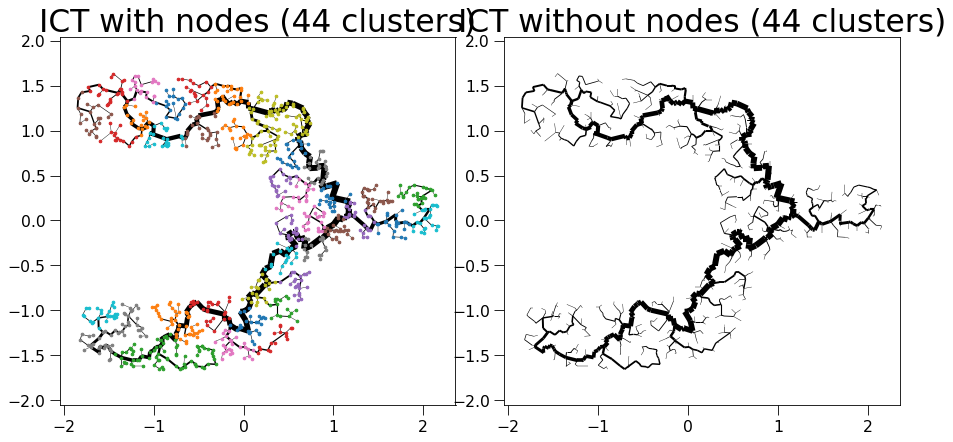

sklearn is done: 0.20955395698547363
My own part is done: 0.0010733604431152344


  0%|          | 0/42 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 151
update Arr 151 -> 121
update Arr 121 -> 109
update Arr 109 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 194 -> 156
update Arr 156 -> 127
update Arr 127 -> 114
update Arr 114 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 67
update Arr 67 -> 55
update Arr 55 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 125
update Arr 125 -> 106
update Arr 106 -> 94
update Arr 94 -> 79
update Arr 79 -> 65
update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 83
update Arr 83 -> 75
update Arr 75 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 100
update Arr 100 -> 90
update Arr 90 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 212 -> 183
update Arr 183 -> 161
update Arr 161 -> 145
update Arr 145 -> 131
update Arr 131 -> 118
update Arr 118 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 90
update Arr 90 -> 80
update Arr 80 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 192 -> 159
update Arr 159 -> 142
update Arr 142 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 177 -> 150
update Arr 150 -> 131
update Arr 131 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 213 -> 184
update Arr 184 -> 166
update Arr 166 -> 145
update Arr 145 -> 128
update Arr 128 -> 106
update Arr 106 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 201 -> 176
update Arr 176 -> 153
update Arr 153 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 87
update Arr 87 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 130
update Arr 130 -> 106
update Arr 106 -> 94
update Arr 94 -> 81
update Arr 81 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 126
update Arr 126 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 76
update Arr 76 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 33
update Arr 33 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 139 -> 114
update Arr 114 -> 89
update Arr 89 -> 65
update Arr 65 -> 57
update Arr 57 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 177 -> 147
update Arr 147 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 206 -> 178
update Arr 178 -> 159
update Arr 159 -> 123
update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 190 -> 166
update Arr 166 -> 147
update Arr 147 -> 132
update Arr 132 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 96
update Arr 96 -> 81
update Arr 81 -> 70
update Arr 70 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 116
update Arr 116 -> 100
update Arr 100 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 54
update Arr 54 -> 41
update Arr 41 -> 31
update Arr 31 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 38
update Arr 38 -> 28
update Arr 28 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 226 -> 205
update Arr 205 -> 184
update Arr 184 -> 160
update Arr 160 -> 139
update Arr 139 -> 125
update Arr 125 -> 110
update Arr 110 -> 88
update Arr 88 -> 79
update Arr 79 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 123
update Arr 123 -> 103
update Arr 103 -> 92
update Arr 92 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 141
update Arr 141 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 85
update Arr 85 -> 71
update Arr 71 -> 63
update Arr 63 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 148
update Arr 148 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 89
update Arr 89 -> 78
update Arr 78 -> 70
update Arr 70 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 139
update Arr 139 -> 122
update Arr 122 -> 107
update Arr 107 -> 92
update Arr 92 -> 78
update Arr 78 -> 68
update Arr 68 -> 52
update Arr 52 -> 44
update Arr 44 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 97
update Arr 97 -> 85
update Arr 85 -> 65
update Arr 65 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 138
update Arr 138 -> 105
update Arr 105 -> 92
update Arr 92 -> 77
update Arr 77 -> 67
update Arr 67 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 160
update Arr 160 -> 126
update Arr 126 -> 113
update Arr 113 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 65
update Arr 65 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 104
update Arr 104 -> 92
update Arr 92 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 34
update Arr 34 -> 25
update Arr 25 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 134
update Arr 134 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 136 -> 108
update Arr 108 -> 94
update Arr 94 -> 84
update Arr 84 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 163
update Arr 163 -> 143
update Arr 143 -> 128
update Arr 128 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 104
update Arr 104 -> 87
update Arr 87 -> 74
update Arr 74 -> 66
update Arr 66 -> 48
update Arr 48 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 141
update Arr 141 -> 118
update Arr 118 -> 107
update Arr 107 -> 91
update Arr 91 -> 81
update Arr 81 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28


Patching the components together:   0%|          | 0/42 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1073 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1073 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1073 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 7 edges early


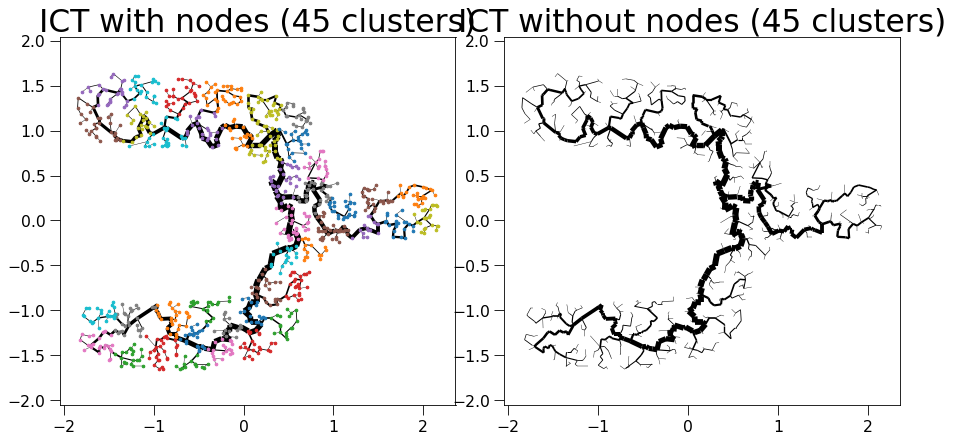

sklearn is done: 0.21588969230651855
My own part is done: 0.0015146732330322266


  0%|          | 0/45 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 103
update Arr 103 -> 93
update Arr 93 -> 84
update Arr 84 -> 70
update Arr 70 -> 62
update Arr 62 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 139
update Arr 139 -> 123
update Arr 123 -> 106
update Arr 106 -> 94
update Arr 94 -> 77
update Arr 77 -> 69
update Arr 69 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 130
update Arr 130 -> 118
update Arr 118 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 57
update Arr 57 -> 49
update Arr 49 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 89
update Arr 89 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 106
update Arr 106 -> 88
update Arr 88 -> 78
update Arr 78 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 139 -> 124
update Arr 124 -> 103
update Arr 103 -> 93
update Arr 93 -> 84
update Arr 84 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 160
update Arr 160 -> 143
update Arr 143 -> 116
update Arr 116 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 196 -> 169
update Arr 169 -> 151
update Arr 151 -> 132
update Arr 132 -> 117
update Arr 117 -> 102
update Arr 102 -> 88
update Arr 88 -> 78
update Arr 78 -> 65
update Arr 65 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 194 -> 164
update Arr 164 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 49
update Arr 49 -> 38
update Arr 38 -> 35
update Arr 35 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 98
update Arr 98 -> 86
update Arr 86 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 112
update Arr 112 -> 93
update Arr 93 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 30
update Arr 30 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 205 -> 175
update Arr 175 -> 154
update Arr 154 -> 135
update Arr 135 -> 119
update Arr 119 -> 108
update Arr 108 -> 88
update Arr 88 -> 79
update Arr 79 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 29
update Arr 29 -> 22
update Arr 22 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 87
update Arr 87 -> 76
update Arr 76 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 195 -> 177
update Arr 177 -> 156
update Arr 156 -> 138
update Arr 138 -> 121
update Arr 121 -> 107
update Arr 107 -> 95
update Arr 95 -> 75
update Arr 75 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 36
update Arr 36 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 109
update Arr 109 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 118
update Arr 118 -> 101
update Arr 101 -> 88
update Arr 88 -> 78
update Arr 78 -> 67
update Arr 67 -> 59
update Arr 59 -> 50
update Arr 50 -> 43
update Arr 43 -> 35
update Arr 35 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 142
update Arr 142 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 82
update Arr 82 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 35
update Arr 35 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 123
update Arr 123 -> 103
update Arr 103 -> 92
update Arr 92 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 134
update Arr 134 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 116
update Arr 116 -> 98
update Arr 98 -> 89
update Arr 89 -> 68
update Arr 68 -> 57
update Arr 57 -> 48
update Arr 48 -> 39
update Arr 39 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 108
update Arr 108 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 167
update Arr 167 -> 149
update Arr 149 -> 132
update Arr 132 -> 116
update Arr 116 -> 90
update Arr 90 -> 80
update Arr 80 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 71
update Arr 71 -> 56
update Arr 56 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 171
update Arr 171 -> 143
update Arr 143 -> 120
update Arr 120 -> 107
update Arr 107 -> 92
update Arr 92 -> 80
update Arr 80 -> 70
update Arr 70 -> 61
update Arr 61 -> 51
update Arr 51 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 109
update Arr 109 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 83
update Arr 83 -> 69
update Arr 69 -> 44
update Arr 44 -> 35
update Arr 35 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 139
update Arr 139 -> 121
update Arr 121 -> 102
update Arr 102 -> 86
update Arr 86 -> 77
update Arr 77 -> 61
update Arr 61 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 175 -> 154
update Arr 154 -> 135
update Arr 135 -> 118
update Arr 118 -> 104
update Arr 104 -> 93
update Arr 93 -> 77
update Arr 77 -> 63
update Arr 63 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 84
update Arr 84 -> 69
update Arr 69 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 142
update Arr 142 -> 120
update Arr 120 -> 109
update Arr 109 -> 97
update Arr 97 -> 85
update Arr 85 -> 75
update Arr 75 -> 66
update Arr 66 -> 56
update Arr 56 -> 50
update Arr 50 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 109
update Arr 109 -> 97
update Arr 97 -> 82
update Arr 82 -> 72
update Arr 72 -> 61
update Arr 61 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 125
update Arr 125 -> 110
update Arr 110 -> 95
update Arr 95 -> 83
update Arr 83 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 80
update Arr 80 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 123
update Arr 123 -> 110
update Arr 110 -> 92
update Arr 92 -> 83
update Arr 83 -> 69
update Arr 69 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
update Arr 24 -> 23


Patching the components together:   0%|          | 0/45 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1073 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1073 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1073 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


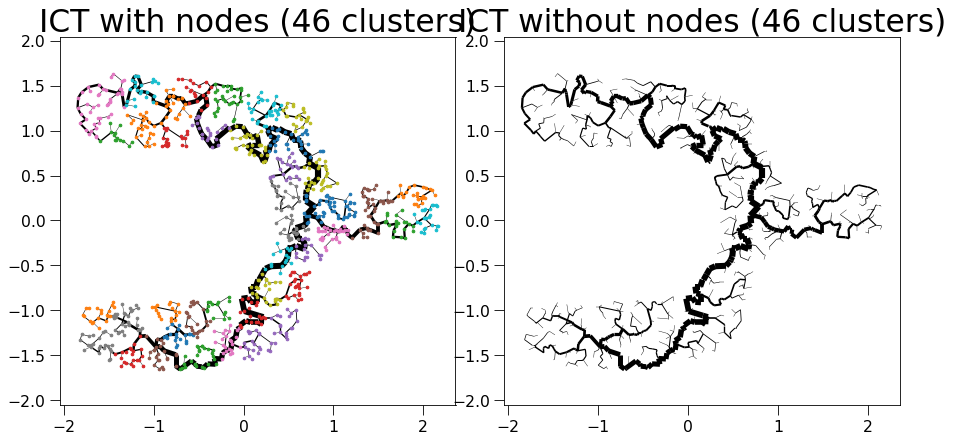

sklearn is done: 0.22689461708068848
My own part is done: 0.0013375282287597656


  0%|          | 0/45 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 152 -> 138
update Arr 138 -> 107
update Arr 107 -> 89
update Arr 89 -> 76
update Arr 76 -> 65
update Arr 65 -> 53
update Arr 53 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 146
update Arr 146 -> 132
update Arr 132 -> 115
update Arr 115 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 131
update Arr 131 -> 105
update Arr 105 -> 92
update Arr 92 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 197 -> 172
update Arr 172 -> 154
update Arr 154 -> 129
update Arr 129 -> 115
update Arr 115 -> 102
update Arr 102 -> 90
update Arr 90 -> 75
update Arr 75 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 145
update Arr 145 -> 119
update Arr 119 -> 99
update Arr 99 -> 88
update Arr 88 -> 73
update Arr 73 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 51
update Arr 51 -> 41
update Arr 41 -> 37
update Arr 37 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 101
update Arr 101 -> 86
update Arr 86 -> 78
update Arr 78 -> 55
update Arr 55 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 95
update Arr 95 -> 86
update Arr 86 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 128
update Arr 128 -> 116
update Arr 116 -> 98
update Arr 98 -> 88
update Arr 88 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 136
update Arr 136 -> 123
update Arr 123 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 70
update Arr 70 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 158 -> 129
update Arr 129 -> 112
update Arr 112 -> 94
update Arr 94 -> 81
update Arr 81 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 128
update Arr 128 -> 93
update Arr 93 -> 81
update Arr 81 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 22
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 105
update Arr 105 -> 92
update Arr 92 -> 82
update Arr 82 -> 71
update Arr 71 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 169 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 59
update Arr 59 -> 53
update Arr 53 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 233 -> 209
update Arr 209 -> 185
update Arr 185 -> 165
update Arr 165 -> 146
update Arr 146 -> 127
update Arr 127 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 174 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 107
update Arr 107 -> 81
update Arr 81 -> 72
update Arr 72 -> 63
update Arr 63 -> 54
update Arr 54 -> 42
update Arr 42 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 161 -> 133
update Arr 133 -> 117
update Arr 117 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 101
update Arr 101 -> 91
update Arr 91 -> 67
update Arr 67 -> 59
update Arr 59 -> 49
update Arr 49 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 142 -> 126
update Arr 126 -> 110
update Arr 110 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 118
update Arr 118 -> 103
update Arr 103 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 144
update Arr 144 -> 126
update Arr 126 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 70
update Arr 70 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
update Arr 34 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 148
update Arr 148 -> 130
update Arr 130 -> 113
update Arr 113 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 64
update Arr 64 -> 47
update Arr 47 -> 39
update Arr 39 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 105
update Arr 105 -> 89
update Arr 89 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 42
update Arr 42 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 115
update Arr 115 -> 102
update Arr 102 -> 87
update Arr 87 -> 72
update Arr 72 -> 64
update Arr 64 -> 54
update Arr 54 -> 49
update Arr 49 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 102
update Arr 102 -> 88
update Arr 88 -> 75
update Arr 75 -> 67
update Arr 67 -> 52
update Arr 52 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 67
update Arr 67 -> 56
update Arr 56 -> 44
update Arr 44 -> 35
update Arr 35 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 140
update Arr 140 -> 113
update Arr 113 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 48
update Arr 48 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 75
update Arr 75 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 158 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 114 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 30
update Arr 30 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 187 -> 164
update Arr 164 -> 149
update Arr 149 -> 122
update Arr 122 -> 107
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 54
update Arr 54 -> 47
update Arr 47 -> 36
update Arr 36 -> 33
update Arr 33 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 195 -> 163
update Arr 163 -> 145
update Arr 145 -> 128
update Arr 128 -> 105
update Arr 105 -> 94
update Arr 94 -> 74
update Arr 74 -> 64
update Arr 64 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 137
update Arr 137 -> 124
update Arr 124 -> 92
update Arr 92 -> 80
update Arr 80 -> 69
update Arr 69 -> 59
update Arr 59 -> 51
update Arr 51 -> 40
update Arr 40 -> 35
update Arr 35 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 103
update Arr 103 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 42
update Arr 42 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 81
update Arr 81 -> 72
update Arr 72 -> 58
update Arr 58 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 118
update Arr 118 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 38
update Arr 38 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20


Patching the components together:   0%|          | 0/45 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1074 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1074 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1074 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 999
added 7 edges early


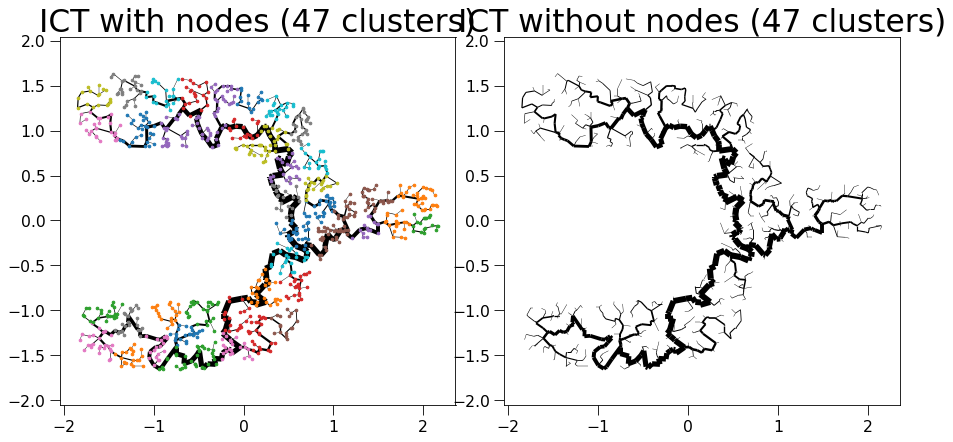

sklearn is done: 0.22763371467590332
My own part is done: 0.0013706684112548828


  0%|          | 0/47 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 78
update Arr 78 -> 64
update Arr 64 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 180
update Arr 180 -> 163
update Arr 163 -> 143
update Arr 143 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 37
update Arr 37 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 78
update Arr 78 -> 70
update Arr 70 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 167
update Arr 167 -> 149
update Arr 149 -> 132
update Arr 132 -> 116
update Arr 116 -> 90
update Arr 90 -> 80
update Arr 80 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 125 -> 110
update Arr 110 -> 87
update Arr 87 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 47
update Arr 47 -> 38
update Arr 38 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 105
update Arr 105 -> 89
update Arr 89 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 42
update Arr 42 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 83
update Arr 83 -> 63
update Arr 63 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 94
update Arr 94 -> 81
update Arr 81 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 24
update Arr 24 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 113
update Arr 113 -> 101
update Arr 101 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 55
update Arr 55 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 21
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 78
update Arr 78 -> 68
update Arr 68 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 147
update Arr 147 -> 126
update Arr 126 -> 110
update Arr 110 -> 99
update Arr 99 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 124
update Arr 124 -> 104
update Arr 104 -> 94
update Arr 94 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 127
update Arr 127 -> 110
update Arr 110 -> 98
update Arr 98 -> 84
update Arr 84 -> 64
update Arr 64 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 141
update Arr 141 -> 110
update Arr 110 -> 95
update Arr 95 -> 86
update Arr 86 -> 70
update Arr 70 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 105
update Arr 105 -> 80
update Arr 80 -> 67
update Arr 67 -> 60
update Arr 60 -> 52
update Arr 52 -> 42
update Arr 42 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 115
update Arr 115 -> 103
update Arr 103 -> 80
update Arr 80 -> 71
update Arr 71 -> 63
update Arr 63 -> 53
update Arr 53 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 149
update Arr 149 -> 129
update Arr 129 -> 110
update Arr 110 -> 89
update Arr 89 -> 75
update Arr 75 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 142
update Arr 142 -> 125
update Arr 125 -> 88
update Arr 88 -> 78
update Arr 78 -> 66
update Arr 66 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 97
update Arr 97 -> 76
update Arr 76 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 105 -> 84
update Arr 84 -> 70
update Arr 70 -> 58
update Arr 58 -> 49
update Arr 49 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 135
update Arr 135 -> 118
update Arr 118 -> 102
update Arr 102 -> 85
update Arr 85 -> 77
update Arr 77 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 178 -> 156
update Arr 156 -> 119
update Arr 119 -> 108
update Arr 108 -> 93
update Arr 93 -> 83
update Arr 83 -> 64
update Arr 64 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 51
update Arr 51 -> 41
update Arr 41 -> 37
update Arr 37 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 238 -> 212
update Arr 212 -> 179
update Arr 179 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 38
update Arr 38 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 158 -> 140
update Arr 140 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 80
update Arr 80 -> 72
update Arr 72 -> 61
update Arr 61 -> 50
update Arr 50 -> 39
update Arr 39 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 158
update Arr 158 -> 141
update Arr 141 -> 126
update Arr 126 -> 101
update Arr 101 -> 86
update Arr 86 -> 78
update Arr 78 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 131 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 59
update Arr 59 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 123
update Arr 123 -> 101
update Arr 101 -> 87
update Arr 87 -> 76
update Arr 76 -> 68
update Arr 68 -> 60
update Arr 60 -> 51
update Arr 51 -> 41
update Arr 41 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 96
update Arr 96 -> 75
update Arr 75 -> 65
update Arr 65 -> 55
update Arr 55 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 108
update Arr 108 -> 96
update Arr 96 -> 80
update Arr 80 -> 56
update Arr 56 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 100
update Arr 100 -> 83
update Arr 83 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 50
update Arr 50 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 102
update Arr 102 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 133
update Arr 133 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 46
update Arr 46 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 94
update Arr 94 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 111
update Arr 111 -> 96
update Arr 96 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 136 -> 108
update Arr 108 -> 94
update Arr 94 -> 84
update Arr 84 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 116
update Arr 116 -> 93
update Arr 93 -> 76
update Arr 76 -> 64
update Arr 64 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


Patching the components together:   0%|          | 0/47 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1077 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1077 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1077 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


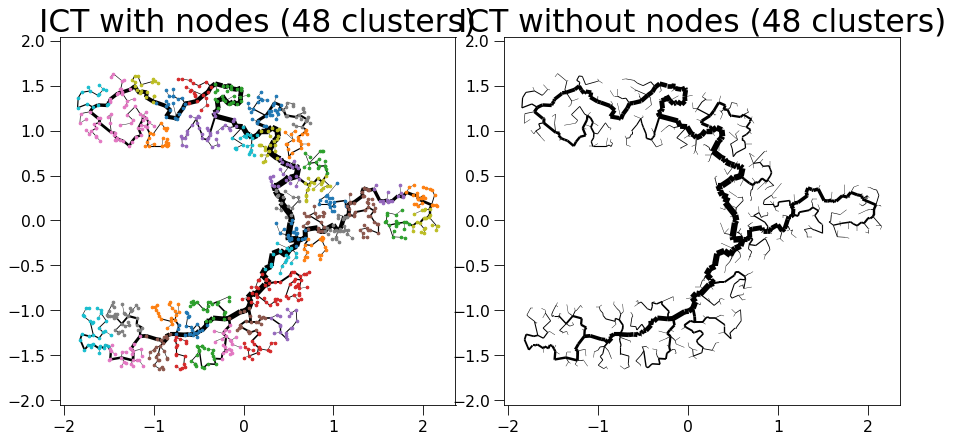

sklearn is done: 0.21683335304260254
My own part is done: 0.0013427734375


  0%|          | 0/46 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 104
update Arr 104 -> 91
update Arr 91 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 95
update Arr 95 -> 82
update Arr 82 -> 71
update Arr 71 -> 59
update Arr 59 -> 48
update Arr 48 -> 38
update Arr 38 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 97
update Arr 97 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 73
update Arr 73 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 37
update Arr 37 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 158
update Arr 158 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 51
update Arr 51 -> 43
update Arr 43 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 186 -> 160
update Arr 160 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 95
update Arr 95 -> 78
update Arr 78 -> 66
update Arr 66 -> 56
update Arr 56 -> 47
update Arr 47 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 228 -> 204
update Arr 204 -> 181
update Arr 181 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 94
update Arr 94 -> 85
update Arr 85 -> 74
update Arr 74 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 106
update Arr 106 -> 93
update Arr 93 -> 83
update Arr 83 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 133
update Arr 133 -> 114
update Arr 114 -> 99
update Arr 99 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 132
update Arr 132 -> 119
update Arr 119 -> 103
update Arr 103 -> 87
update Arr 87 -> 73
update Arr 73 -> 66
update Arr 66 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 151
update Arr 151 -> 121
update Arr 121 -> 109
update Arr 109 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 100
update Arr 100 -> 85
update Arr 85 -> 65
update Arr 65 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 91
update Arr 91 -> 80
update Arr 80 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 27
update Arr 27 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 128
update Arr 128 -> 116
update Arr 116 -> 98
update Arr 98 -> 88
update Arr 88 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 179 -> 148
update Arr 148 -> 128
update Arr 128 -> 116
update Arr 116 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 114
update Arr 114 -> 91
update Arr 91 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 38
update Arr 38 -> 29
update Arr 29 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 192 -> 161
update Arr 161 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 91
update Arr 91 -> 80
update Arr 80 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 163
update Arr 163 -> 147
update Arr 147 -> 118
update Arr 118 -> 106
update Arr 106 -> 95
update Arr 95 -> 83
update Arr 83 -> 70
update Arr 70 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 111
update Arr 111 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 106
update Arr 106 -> 88
update Arr 88 -> 78
update Arr 78 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 77
update Arr 77 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 148
update Arr 148 -> 129
update Arr 129 -> 117
update Arr 117 -> 102
update Arr 102 -> 89
update Arr 89 -> 78
update Arr 78 -> 70
update Arr 70 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 58
update Arr 58 -> 42
update Arr 42 -> 34
update Arr 34 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 192 -> 160
update Arr 160 -> 144
update Arr 144 -> 124
update Arr 124 -> 111
update Arr 111 -> 92
update Arr 92 -> 81
update Arr 81 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 206 -> 178
update Arr 178 -> 159
update Arr 159 -> 123
update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 105
update Arr 105 -> 93
update Arr 93 -> 77
update Arr 77 -> 64
update Arr 64 -> 55
update Arr 55 -> 42
update Arr 42 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 102
update Arr 102 -> 79
update Arr 79 -> 65
update Arr 65 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 86
update Arr 86 -> 65
update Arr 65 -> 49
update Arr 49 -> 37
update Arr 37 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 51
update Arr 51 -> 41
update Arr 41 -> 37
update Arr 37 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 99
update Arr 99 -> 89
update Arr 89 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 48
update Arr 48 -> 41
update Arr 41 -> 33
update Arr 33 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 109
update Arr 109 -> 97
update Arr 97 -> 82
update Arr 82 -> 72
update Arr 72 -> 61
update Arr 61 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 101
update Arr 101 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 149
update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 105
update Arr 105 -> 93
update Arr 93 -> 73
update Arr 73 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 136
update Arr 136 -> 116
update Arr 116 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 68
update Arr 68 -> 55
update Arr 55 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 81
update Arr 81 -> 65
update Arr 65 -> 53
update Arr 53 -> 43
update Arr 43 -> 30
update Arr 30 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 94
update Arr 94 -> 77
update Arr 77 -> 66
update Arr 66 -> 55
update Arr 55 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/46 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1079 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1079 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1079 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999


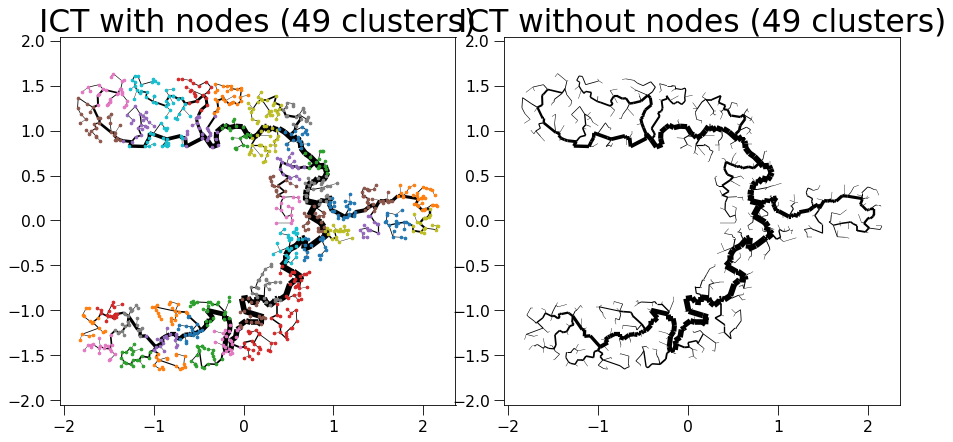

sklearn is done: 0.21837711334228516
My own part is done: 0.0015363693237304688


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 113
update Arr 113 -> 97
update Arr 97 -> 82
update Arr 82 -> 64
update Arr 64 -> 53
update Arr 53 -> 44
update Arr 44 -> 34
update Arr 34 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 124
update Arr 124 -> 110
update Arr 110 -> 93
update Arr 93 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 50
update Arr 50 -> 39
update Arr 39 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 69
update Arr 69 -> 53
update Arr 53 -> 41
update Arr 41 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 137
update Arr 137 -> 122
update Arr 122 -> 104
update Arr 104 -> 83
update Arr 83 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 27
update Arr 27 -> 26
update Arr 26 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 138
update Arr 138 -> 122
update Arr 122 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 63
update Arr 63 -> 46
update Arr 46 -> 41
update Arr 41 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 100
update Arr 100 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 81
update Arr 81 -> 69
update Arr 69 -> 60
update Arr 60 -> 44
update Arr 44 -> 30
update Arr 30 -> 24
update Arr 24 -> 24
update Arr 24 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 134
update Arr 134 -> 111
update Arr 111 -> 96
update Arr 96 -> 85
update Arr 85 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 80
update Arr 80 -> 70
update Arr 70 -> 52
update Arr 52 -> 45
update Arr 45 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 109
update Arr 109 -> 93
update Arr 93 -> 84
update Arr 84 -> 73
update Arr 73 -> 64
update Arr 64 -> 54
update Arr 54 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 91
update Arr 91 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 17
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 164 -> 149
update Arr 149 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 65
update Arr 65 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 124 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 74
update Arr 74 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 154
update Arr 154 -> 119
update Arr 119 -> 106
update Arr 106 -> 80
update Arr 80 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 122
update Arr 122 -> 101
update Arr 101 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 76
update Arr 76 -> 69
update Arr 69 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 104
update Arr 104 -> 91
update Arr 91 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 147
update Arr 147 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 137
update Arr 137 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 82
update Arr 82 -> 68
update Arr 68 -> 56
update Arr 56 -> 47
update Arr 47 -> 41
update Arr 41 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 162
update Arr 162 -> 131
update Arr 131 -> 119
update Arr 119 -> 100
update Arr 100 -> 80
update Arr 80 -> 66
update Arr 66 -> 56
update Arr 56 -> 42
update Arr 42 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 119 -> 99
update Arr 99 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 115
update Arr 115 -> 103
update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 59
update Arr 59 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 74
update Arr 74 -> 66
update Arr 66 -> 49
update Arr 49 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 122
update Arr 122 -> 108
update Arr 108 -> 92
update Arr 92 -> 80
update Arr 80 -> 65
update Arr 65 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 111 -> 95
update Arr 95 -> 85
update Arr 85 -> 67
update Arr 67 -> 56
update Arr 56 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 94
update Arr 94 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 46
update Arr 46 -> 36
update Arr 36 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 122
update Arr 122 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 103
update Arr 103 -> 89
update Arr 89 -> 77
update Arr 77 -> 59
update Arr 59 -> 49
update Arr 49 -> 44
update Arr 44 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 130
update Arr 130 -> 105
update Arr 105 -> 87
update Arr 87 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 76
update Arr 76 -> 66
update Arr 66 -> 49
update Arr 49 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 18
update Arr 18 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 177 -> 142
update Arr 142 -> 126
update Arr 126 -> 111
update Arr 111 -> 99
update Arr 99 -> 82
update Arr 82 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 36
update Arr 36 -> 34
update Arr 34 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 104
update Arr 104 -> 85
update Arr 85 -> 73
update Arr 73 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 149
update Arr 149 -> 128
update Arr 128 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 79
update Arr 79 -> 64
update Arr 64 -> 52
update Arr 52 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 102
update Arr 102 -> 84
update Arr 84 -> 75
update Arr 75 -> 63
update Arr 63 -> 52
update Arr 52 -> 47
update Arr 47 -> 36
update Arr 36 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 97
update Arr 97 -> 85
update Arr 85 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 65
update Arr 65 -> 56
update Arr 56 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 21
update Arr 21 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 85
update Arr 85 -> 68
update Arr 68 -> 54
update Arr 54 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 19
update Arr 19 -> 16
update Arr 16 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 121 -> 103
update Arr 103 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 108 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 57
update Arr 57 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 93
update Arr 93 -> 80
update Arr 80 -> 70
update Arr 70 -> 62
update Arr 62 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1084 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1084 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1084 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000


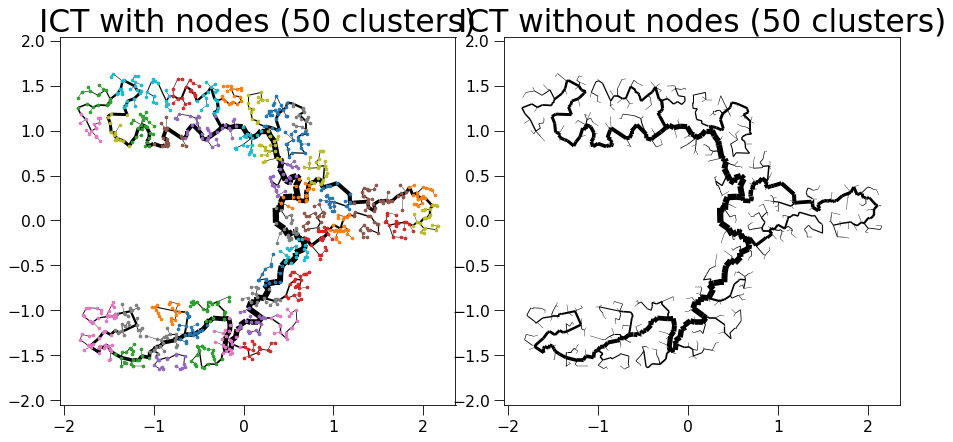

sklearn is done: 0.24006128311157227
My own part is done: 0.0014879703521728516


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 103
update Arr 103 -> 92
update Arr 92 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 101
update Arr 101 -> 80
update Arr 80 -> 69
update Arr 69 -> 56
update Arr 56 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 128
update Arr 128 -> 104
update Arr 104 -> 88
update Arr 88 -> 75
update Arr 75 -> 57
update Arr 57 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 217 -> 194
update Arr 194 -> 176
update Arr 176 -> 159
update Arr 159 -> 142
update Arr 142 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 86
update Arr 86 -> 75
update Arr 75 -> 64
update Arr 64 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 174 -> 145
update Arr 145 -> 128
update Arr 128 -> 116
update Arr 116 -> 100
update Arr 100 -> 88
update Arr 88 -> 76
update Arr 76 -> 62
update Arr 62 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 148 -> 122
update Arr 122 -> 101
update Arr 101 -> 87
update Arr 87 -> 74
update Arr 74 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 93
update Arr 93 -> 79
update Arr 79 -> 61
update Arr 61 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 137
update Arr 137 -> 118
update Arr 118 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 69
update Arr 69 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 69
update Arr 69 -> 62
update Arr 62 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 22
update Arr 22 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 171
update Arr 171 -> 146
update Arr 146 -> 129
update Arr 129 -> 116
update Arr 116 -> 100
update Arr 100 -> 82
update Arr 82 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 92
update Arr 92 -> 69
update Arr 69 -> 56
update Arr 56 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 126
update Arr 126 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 45
update Arr 45 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 87
update Arr 87 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 136
update Arr 136 -> 114
update Arr 114 -> 100
update Arr 100 -> 85
update Arr 85 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 92
update Arr 92 -> 81
update Arr 81 -> 70
update Arr 70 -> 58
update Arr 58 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 99
update Arr 99 -> 88
update Arr 88 -> 75
update Arr 75 -> 66
update Arr 66 -> 56
update Arr 56 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 88
update Arr 88 -> 75
update Arr 75 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 83
update Arr 83 -> 73
update Arr 73 -> 63
update Arr 63 -> 50
update Arr 50 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 48
update Arr 48 -> 40
update Arr 40 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 136
update Arr 136 -> 112
update Arr 112 -> 101
update Arr 101 -> 87
update Arr 87 -> 73
update Arr 73 -> 64
update Arr 64 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 104
update Arr 104 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 35
update Arr 35 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 104
update Arr 104 -> 91
update Arr 91 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 73
update Arr 73 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 37
update Arr 37 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 79
update Arr 79 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 75
update Arr 75 -> 66
update Arr 66 -> 53
update Arr 53 -> 46
update Arr 46 -> 35
update Arr 35 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 167 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 76
update Arr 76 -> 61
update Arr 61 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 86
update Arr 86 -> 74
update Arr 74 -> 65
update Arr 65 -> 52
update Arr 52 -> 47
update Arr 47 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 120
update Arr 120 -> 104
update Arr 104 -> 85
update Arr 85 -> 74
update Arr 74 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 103
update Arr 103 -> 86
update Arr 86 -> 78
update Arr 78 -> 64
update Arr 64 -> 56
update Arr 56 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 130
update Arr 130 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 84
update Arr 84 -> 76
update Arr 76 -> 61
update Arr 61 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 86
update Arr 86 -> 78
update Arr 78 -> 67
update Arr 67 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 106
update Arr 106 -> 89
update Arr 89 -> 80
update Arr 80 -> 60
update Arr 60 -> 50
update Arr 50 -> 35
update Arr 35 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 161
update Arr 161 -> 142
update Arr 142 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 59
update Arr 59 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 66
update Arr 66 -> 53
update Arr 53 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 132 -> 108
update Arr 108 -> 91
update Arr 91 -> 82
update Arr 82 -> 66
update Arr 66 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 23
update Arr 23 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 111
update Arr 111 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 115
update Arr 115 -> 101
update Arr 101 -> 80
update Arr 80 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 136
update Arr 136 -> 115
update Arr 115 -> 103
update Arr 103 -> 82
update Arr 82 -> 73
update Arr 73 -> 62
update Arr 62 -> 48
update Arr 48 -> 39
update Arr 39 -> 33
update Arr 33 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1089 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1089 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1089 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 999
added 10 edges early


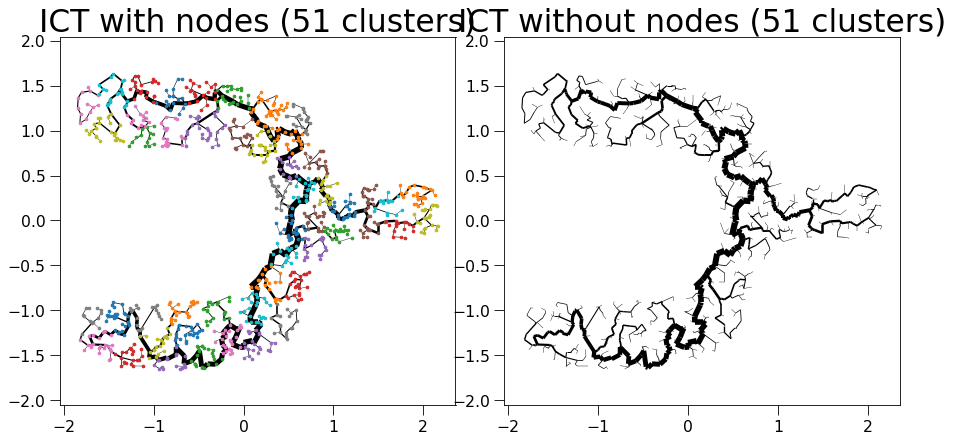

sklearn is done: 0.2375485897064209
My own part is done: 0.0016942024230957031


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 124
update Arr 124 -> 101
update Arr 101 -> 91
update Arr 91 -> 81
update Arr 81 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 155
update Arr 155 -> 137
update Arr 137 -> 120
update Arr 120 -> 93
update Arr 93 -> 84
update Arr 84 -> 66
update Arr 66 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 95
update Arr 95 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 86
update Arr 86 -> 66
update Arr 66 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 82
update Arr 82 -> 65
update Arr 65 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 85
update Arr 85 -> 73
update Arr 73 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 128
update Arr 128 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 75
update Arr 75 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 148
update Arr 148 -> 125
update Arr 125 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 32
update Arr 32 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 158 -> 143
update Arr 143 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 70
update Arr 70 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 122
update Arr 122 -> 98
update Arr 98 -> 85
update Arr 85 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 79
update Arr 79 -> 59
update Arr 59 -> 53
update Arr 53 -> 43
update Arr 43 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 61
update Arr 61 -> 54
update Arr 54 -> 37
update Arr 37 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 194 -> 151
update Arr 151 -> 135
update Arr 135 -> 110
update Arr 110 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 64
update Arr 64 -> 58
update Arr 58 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 108
update Arr 108 -> 87
update Arr 87 -> 78
update Arr 78 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 103
update Arr 103 -> 88
update Arr 88 -> 79
update Arr 79 -> 62
update Arr 62 -> 56
update Arr 56 -> 43
update Arr 43 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 73
update Arr 73 -> 61
update Arr 61 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 128
update Arr 128 -> 112
update Arr 112 -> 98
update Arr 98 -> 87
update Arr 87 -> 77
update Arr 77 -> 56
update Arr 56 -> 43
update Arr 43 -> 34
update Arr 34 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 75
update Arr 75 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 84
update Arr 84 -> 64
update Arr 64 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 137
update Arr 137 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 48
update Arr 48 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 152 -> 123
update Arr 123 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 38
update Arr 38 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 169 -> 140
update Arr 140 -> 126
update Arr 126 -> 111
update Arr 111 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 72
update Arr 72 -> 58
update Arr 58 -> 45
update Arr 45 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 45
update Arr 45 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 168 -> 142
update Arr 142 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 115
update Arr 115 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 26
update Arr 26 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 126
update Arr 126 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 67
update Arr 67 -> 56
update Arr 56 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 117
update Arr 117 -> 100
update Arr 100 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 100
update Arr 100 -> 89
update Arr 89 -> 73
update Arr 73 -> 57
update Arr 57 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 146 -> 130
update Arr 130 -> 117
update Arr 117 -> 103
update Arr 103 -> 90
update Arr 90 -> 79
update Arr 79 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 74
update Arr 74 -> 67
update Arr 67 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 141
update Arr 141 -> 123
update Arr 123 -> 108
update Arr 108 -> 98
update Arr 98 -> 78
update Arr 78 -> 68
update Arr 68 -> 56
update Arr 56 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 97
update Arr 97 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 102
update Arr 102 -> 86
update Arr 86 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 140 -> 108
update Arr 108 -> 92
update Arr 92 -> 83
update Arr 83 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 95
update Arr 95 -> 83
update Arr 83 -> 74
update Arr 74 -> 59
update Arr 59 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 131 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 59
update Arr 59 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 106
update Arr 106 -> 84
update Arr 84 -> 76
update Arr 76 -> 64
update Arr 64 -> 56
update Arr 56 -> 44
update Arr 44 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1093 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1093 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1093 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 3 edges early


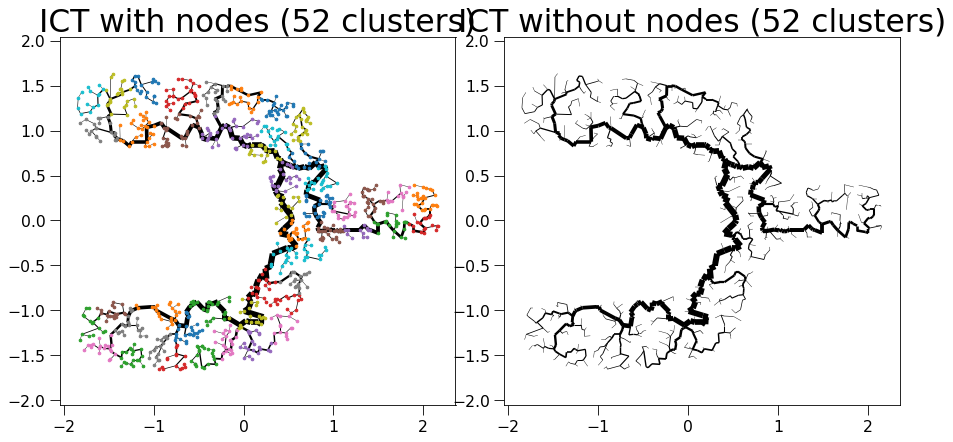

sklearn is done: 0.2389974594116211
My own part is done: 0.001377105712890625


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 36
update Arr 36 -> 29
update Arr 29 -> 24
update Arr 24 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 111
update Arr 111 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 110
update Arr 110 -> 97
update Arr 97 -> 79
update Arr 79 -> 64
update Arr 64 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 125
update Arr 125 -> 106
update Arr 106 -> 91
update Arr 91 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 18
update Arr 18 -> 15
update Arr 15 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 95
update Arr 95 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 106
update Arr 106 -> 96
update Arr 96 -> 73
update Arr 73 -> 64
update Arr 64 -> 58
update Arr 58 -> 44
update Arr 44 -> 35
update Arr 35 -> 27
update Arr 27 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 120
update Arr 120 -> 105
update Arr 105 -> 89
update Arr 89 -> 76
update Arr 76 -> 66
update Arr 66 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 80
update Arr 80 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 63
update Arr 63 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 103
update Arr 103 -> 92
update Arr 92 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 39
update Arr 39 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 98
update Arr 98 -> 86
update Arr 86 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 44
update Arr 44 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 114 -> 83
update Arr 83 -> 73
update Arr 73 -> 65
update Arr 65 -> 52
update Arr 52 -> 45
update Arr 45 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 115
update Arr 115 -> 92
update Arr 92 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 81
update Arr 81 -> 68
update Arr 68 -> 56
update Arr 56 -> 50
update Arr 50 -> 43
update Arr 43 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 182 -> 152
update Arr 152 -> 132
update Arr 132 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 72
update Arr 72 -> 65
update Arr 65 -> 56
update Arr 56 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/106 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/106 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 106 -> 81
update Arr 81 -> 72
update Arr 72 -> 65
update Arr 65 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 142 -> 126
update Arr 126 -> 109
update Arr 109 -> 93
update Arr 93 -> 80
update Arr 80 -> 69
update Arr 69 -> 59
update Arr 59 -> 50
update Arr 50 -> 43
update Arr 43 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 136
update Arr 136 -> 117
update Arr 117 -> 106
update Arr 106 -> 93
update Arr 93 -> 74
update Arr 74 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 101
update Arr 101 -> 89
update Arr 89 -> 79
update Arr 79 -> 69
update Arr 69 -> 54
update Arr 54 -> 41
update Arr 41 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 133
update Arr 133 -> 116
update Arr 116 -> 102
update Arr 102 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 24
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 136
update Arr 136 -> 112
update Arr 112 -> 101
update Arr 101 -> 87
update Arr 87 -> 73
update Arr 73 -> 64
update Arr 64 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 200 -> 175
update Arr 175 -> 136
update Arr 136 -> 112
update Arr 112 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 58
update Arr 58 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 94
update Arr 94 -> 81
update Arr 81 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 24
update Arr 24 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 122
update Arr 122 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 85
update Arr 85 -> 76
update Arr 76 -> 59
update Arr 59 -> 47
update Arr 47 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 130
update Arr 130 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 192 -> 158
update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 113
update Arr 113 -> 95
update Arr 95 -> 85
update Arr 85 -> 74
update Arr 74 -> 61
update Arr 61 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 102
update Arr 102 -> 78
update Arr 78 -> 65
update Arr 65 -> 57
update Arr 57 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 128
update Arr 128 -> 108
update Arr 108 -> 97
update Arr 97 -> 80
update Arr 80 -> 69
update Arr 69 -> 55
update Arr 55 -> 45
update Arr 45 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 49
update Arr 49 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 92
update Arr 92 -> 82
update Arr 82 -> 72
update Arr 72 -> 57
update Arr 57 -> 41
update Arr 41 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 108
update Arr 108 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 113
update Arr 113 -> 99
update Arr 99 -> 89
update Arr 89 -> 76
update Arr 76 -> 62
update Arr 62 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 114
update Arr 114 -> 98
update Arr 98 -> 86
update Arr 86 -> 78
update Arr 78 -> 64
update Arr 64 -> 55
update Arr 55 -> 43
update Arr 43 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 137
update Arr 137 -> 116
update Arr 116 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 98
update Arr 98 -> 86
update Arr 86 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 82
update Arr 82 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/199 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/199 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 199 -> 172
update Arr 172 -> 149
update Arr 149 -> 131
update Arr 131 -> 106
update Arr 106 -> 93
update Arr 93 -> 76
update Arr 76 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 135
update Arr 135 -> 121
update Arr 121 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 74
update Arr 74 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 126
update Arr 126 -> 114
update Arr 114 -> 102
update Arr 102 -> 87
update Arr 87 -> 73
update Arr 73 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1090 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1090 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1090 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


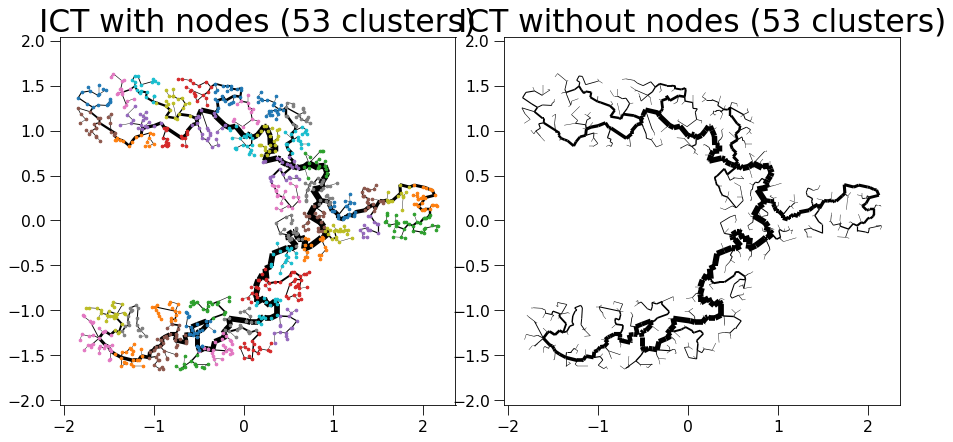

sklearn is done: 0.24071431159973145
My own part is done: 0.001523733139038086


  0%|          | 0/51 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 122
update Arr 122 -> 107
update Arr 107 -> 74
update Arr 74 -> 61
update Arr 61 -> 51
update Arr 51 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 128
update Arr 128 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 95
update Arr 95 -> 86
update Arr 86 -> 75
update Arr 75 -> 64
update Arr 64 -> 52
update Arr 52 -> 44
update Arr 44 -> 33
update Arr 33 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 122
update Arr 122 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 126 -> 105
update Arr 105 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 73
update Arr 73 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 100
update Arr 100 -> 89
update Arr 89 -> 63
update Arr 63 -> 47
update Arr 47 -> 38
update Arr 38 -> 27
update Arr 27 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 101
update Arr 101 -> 75
update Arr 75 -> 67
update Arr 67 -> 56
update Arr 56 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 97
update Arr 97 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 106
update Arr 106 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 46
update Arr 46 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 168 -> 131
update Arr 131 -> 115
update Arr 115 -> 100
update Arr 100 -> 89
update Arr 89 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 94
update Arr 94 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 132
update Arr 132 -> 117
update Arr 117 -> 95
update Arr 95 -> 82
update Arr 82 -> 73
update Arr 73 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 75
update Arr 75 -> 61
update Arr 61 -> 51
update Arr 51 -> 44
update Arr 44 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 137
update Arr 137 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 82
update Arr 82 -> 68
update Arr 68 -> 56
update Arr 56 -> 47
update Arr 47 -> 41
update Arr 41 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 74
update Arr 74 -> 67
update Arr 67 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 145
update Arr 145 -> 127
update Arr 127 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 76
update Arr 76 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 110
update Arr 110 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 85
update Arr 85 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 100
update Arr 100 -> 83
update Arr 83 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 59
update Arr 59 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 121
update Arr 121 -> 100
update Arr 100 -> 87
update Arr 87 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 83
update Arr 83 -> 74
update Arr 74 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/106 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/106 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 106 -> 81
update Arr 81 -> 72
update Arr 72 -> 65
update Arr 65 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 143
update Arr 143 -> 126
update Arr 126 -> 114
update Arr 114 -> 94
update Arr 94 -> 85
update Arr 85 -> 67
update Arr 67 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 49
update Arr 49 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 122
update Arr 122 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 58
update Arr 58 -> 48
update Arr 48 -> 39
update Arr 39 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 140 -> 108
update Arr 108 -> 92
update Arr 92 -> 83
update Arr 83 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 58
update Arr 58 -> 46
update Arr 46 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 52
update Arr 52 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 111
update Arr 111 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 73
update Arr 73 -> 61
update Arr 61 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 98
update Arr 98 -> 86
update Arr 86 -> 75
update Arr 75 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 82
update Arr 82 -> 63
update Arr 63 -> 53
update Arr 53 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
update Arr 26 -> 22
update Arr 22 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 100
update Arr 100 -> 90
update Arr 90 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 87
update Arr 87 -> 70
update Arr 70 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 122
update Arr 122 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 52
update Arr 52 -> 41
update Arr 41 -> 31
update Arr 31 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/51 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1084 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1084 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1084 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


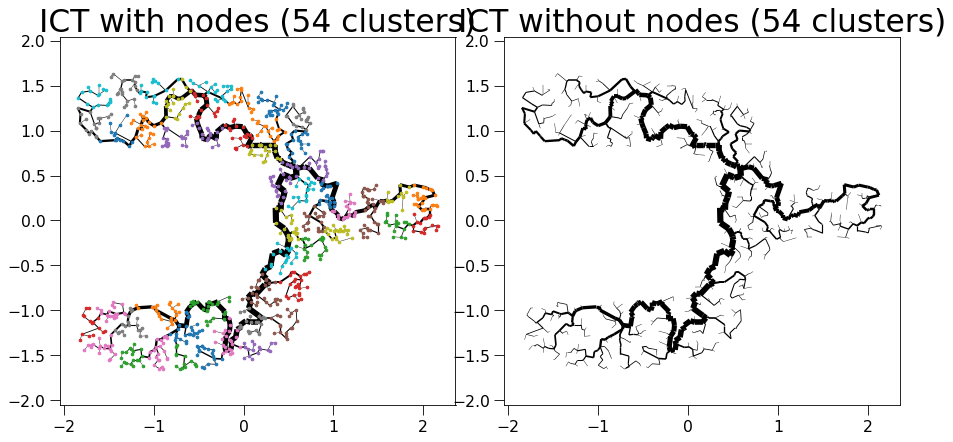

sklearn is done: 0.2584969997406006
My own part is done: 0.0016741752624511719


  0%|          | 0/52 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 145
update Arr 145 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 43
update Arr 43 -> 36
update Arr 36 -> 34
update Arr 34 -> 29
update Arr 29 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 143
update Arr 143 -> 128
update Arr 128 -> 114
update Arr 114 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 161 -> 142
update Arr 142 -> 119
update Arr 119 -> 86
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 35
update Arr 35 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 58
update Arr 58 -> 52
update Arr 52 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 71
update Arr 71 -> 41
update Arr 41 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 52
update Arr 52 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 90
update Arr 90 -> 77
update Arr 77 -> 66
update Arr 66 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 28
update Arr 28 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 105
update Arr 105 -> 89
update Arr 89 -> 80
update Arr 80 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 93
update Arr 93 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 46
update Arr 46 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 108
update Arr 108 -> 94
update Arr 94 -> 85
update Arr 85 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 63
update Arr 63 -> 49
update Arr 49 -> 42
update Arr 42 -> 33
update Arr 33 -> 28
update Arr 28 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 177 -> 156
update Arr 156 -> 137
update Arr 137 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 80
update Arr 80 -> 66
update Arr 66 -> 57
update Arr 57 -> 48
update Arr 48 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 96
update Arr 96 -> 86
update Arr 86 -> 70
update Arr 70 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 114
update Arr 114 -> 94
update Arr 94 -> 80
update Arr 80 -> 72
update Arr 72 -> 57
update Arr 57 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 97
update Arr 97 -> 74
update Arr 74 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 73
update Arr 73 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 138
update Arr 138 -> 115
update Arr 115 -> 99
update Arr 99 -> 73
update Arr 73 -> 62
update Arr 62 -> 56
update Arr 56 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 56
update Arr 56 -> 41
update Arr 41 -> 34
update Arr 34 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 144 -> 122
update Arr 122 -> 105
update Arr 105 -> 95
update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 130
update Arr 130 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 51
update Arr 51 -> 41
update Arr 41 -> 37
update Arr 37 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 123
update Arr 123 -> 106
update Arr 106 -> 90
update Arr 90 -> 77
update Arr 77 -> 65
update Arr 65 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 91
update Arr 91 -> 80
update Arr 80 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 27
update Arr 27 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 143
update Arr 143 -> 128
update Arr 128 -> 107
update Arr 107 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 83
update Arr 83 -> 72
update Arr 72 -> 60
update Arr 60 -> 51
update Arr 51 -> 42
update Arr 42 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 86
update Arr 86 -> 73
update Arr 73 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 95
update Arr 95 -> 84
update Arr 84 -> 69
update Arr 69 -> 62
update Arr 62 -> 53
update Arr 53 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 29
update Arr 29 -> 22
update Arr 22 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 132 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 56
update Arr 56 -> 44
update Arr 44 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 139 -> 110
update Arr 110 -> 97
update Arr 97 -> 85
update Arr 85 -> 77
update Arr 77 -> 66
update Arr 66 -> 58
update Arr 58 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 109
update Arr 109 -> 84
update Arr 84 -> 64
update Arr 64 -> 53
update Arr 53 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 24
update Arr 24 -> 18
update Arr 18 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 94
update Arr 94 -> 82
update Arr 82 -> 65
update Arr 65 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 68
update Arr 68 -> 48
update Arr 48 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 113
update Arr 113 -> 90
update Arr 90 -> 75
update Arr 75 -> 65
update Arr 65 -> 47
update Arr 47 -> 36
update Arr 36 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 92
update Arr 92 -> 78
update Arr 78 -> 70
update Arr 70 -> 58
update Arr 58 -> 49
update Arr 49 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 20
update Arr 20 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 112
update Arr 112 -> 98
update Arr 98 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 148 -> 119
update Arr 119 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 66
update Arr 66 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 84
update Arr 84 -> 70
update Arr 70 -> 61
update Arr 61 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 18
update Arr 18 -> 15
update Arr 15 -> 15
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 113
update Arr 113 -> 100
update Arr 100 -> 72
update Arr 72 -> 60
update Arr 60 -> 50
update Arr 50 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 105
update Arr 105 -> 90
update Arr 90 -> 78
update Arr 78 -> 65
update Arr 65 -> 54
update Arr 54 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 73
update Arr 73 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 127
update Arr 127 -> 111
update Arr 111 -> 93
update Arr 93 -> 77
update Arr 77 -> 69
update Arr 69 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 108
update Arr 108 -> 92
update Arr 92 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/52 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1089 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1089 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1089 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


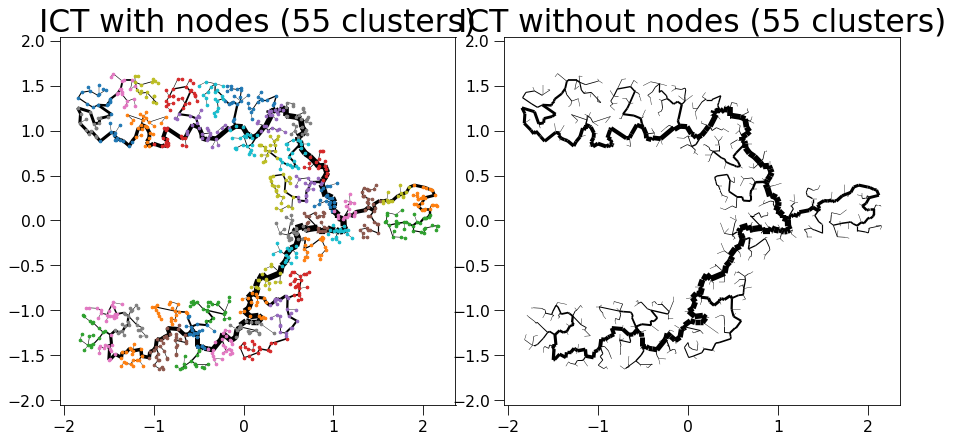

sklearn is done: 0.2589445114135742
My own part is done: 0.001980304718017578


  0%|          | 0/52 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 81
update Arr 81 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 39
update Arr 39 -> 27
update Arr 27 -> 26
update Arr 26 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 105
update Arr 105 -> 90
update Arr 90 -> 63
update Arr 63 -> 51
update Arr 51 -> 46
update Arr 46 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 29
update Arr 29 -> 22
update Arr 22 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 66
update Arr 66 -> 46
update Arr 46 -> 32
update Arr 32 -> 27
update Arr 27 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 14
update Arr 14 -> 13
update Arr 13 -> 13
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 110
update Arr 110 -> 92
update Arr 92 -> 79
update Arr 79 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 123
update Arr 123 -> 108
update Arr 108 -> 96
update Arr 96 -> 71
update Arr 71 -> 58
update Arr 58 -> 49
update Arr 49 -> 40
update Arr 40 -> 31
update Arr 31 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 137
update Arr 137 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 82
update Arr 82 -> 68
update Arr 68 -> 56
update Arr 56 -> 47
update Arr 47 -> 41
update Arr 41 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 90
update Arr 90 -> 64
update Arr 64 -> 51
update Arr 51 -> 41
update Arr 41 -> 31
update Arr 31 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 76
update Arr 76 -> 67
update Arr 67 -> 56
update Arr 56 -> 50
update Arr 50 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 59
update Arr 59 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 133
update Arr 133 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 65
update Arr 65 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 227 -> 195
update Arr 195 -> 175
update Arr 175 -> 157
update Arr 157 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 86
update Arr 86 -> 65
update Arr 65 -> 49
update Arr 49 -> 37
update Arr 37 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 172 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 92
update Arr 92 -> 80
update Arr 80 -> 66
update Arr 66 -> 58
update Arr 58 -> 46
update Arr 46 -> 36
update Arr 36 -> 33
update Arr 33 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 145
update Arr 145 -> 127
update Arr 127 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 76
update Arr 76 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 84
update Arr 84 -> 72
update Arr 72 -> 65
update Arr 65 -> 52
update Arr 52 -> 44
update Arr 44 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 123
update Arr 123 -> 110
update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 56
update Arr 56 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 26
update Arr 26 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 153 -> 139
update Arr 139 -> 119
update Arr 119 -> 104
update Arr 104 -> 93
update Arr 93 -> 82
update Arr 82 -> 61
update Arr 61 -> 55
update Arr 55 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 82
update Arr 82 -> 62
update Arr 62 -> 48
update Arr 48 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 17
update Arr 17 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 62
update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 135
update Arr 135 -> 119
update Arr 119 -> 107
update Arr 107 -> 87
update Arr 87 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 45
update Arr 45 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 130
update Arr 130 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 67
update Arr 67 -> 54
update Arr 54 -> 43
update Arr 43 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 57
update Arr 57 -> 44
update Arr 44 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 12
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 86
update Arr 86 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 121
update Arr 121 -> 106
update Arr 106 -> 94
update Arr 94 -> 84
update Arr 84 -> 73
update Arr 73 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 116
update Arr 116 -> 94
update Arr 94 -> 81
update Arr 81 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 95
update Arr 95 -> 82
update Arr 82 -> 71
update Arr 71 -> 59
update Arr 59 -> 48
update Arr 48 -> 38
update Arr 38 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 100
update Arr 100 -> 90
update Arr 90 -> 79
update Arr 79 -> 61
update Arr 61 -> 42
update Arr 42 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 126
update Arr 126 -> 111
update Arr 111 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 55
update Arr 55 -> 45
update Arr 45 -> 33
update Arr 33 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 13
update Arr 13 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 112
update Arr 112 -> 98
update Arr 98 -> 86
update Arr 86 -> 77
update Arr 77 -> 63
update Arr 63 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 112
update Arr 112 -> 97
update Arr 97 -> 88
update Arr 88 -> 71
update Arr 71 -> 64
update Arr 64 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 72
update Arr 72 -> 61
update Arr 61 -> 51
update Arr 51 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 143
update Arr 143 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 83
update Arr 83 -> 68
update Arr 68 -> 58
update Arr 58 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 107
update Arr 107 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 114 -> 98
update Arr 98 -> 83
update Arr 83 -> 73
update Arr 73 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 99
update Arr 99 -> 88
update Arr 88 -> 70
update Arr 70 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 16
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 103
update Arr 103 -> 89
update Arr 89 -> 74
update Arr 74 -> 64
update Arr 64 -> 54
update Arr 54 -> 46
update Arr 46 -> 34
update Arr 34 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 112
update Arr 112 -> 99
update Arr 99 -> 88
update Arr 88 -> 72
update Arr 72 -> 62
update Arr 62 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 70
update Arr 70 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 30
update Arr 30 -> 24
update Arr 24 -> 20
update Arr 20 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 110
update Arr 110 -> 92
update Arr 92 -> 81
update Arr 81 -> 63
update Arr 63 -> 50
update Arr 50 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 66
update Arr 66 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 122
update Arr 122 -> 100
update Arr 100 -> 84
update Arr 84 -> 70
update Arr 70 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 85
update Arr 85 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 133 -> 115
update Arr 115 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 66
update Arr 66 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/52 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1085 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1085 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1085 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 4 edges early


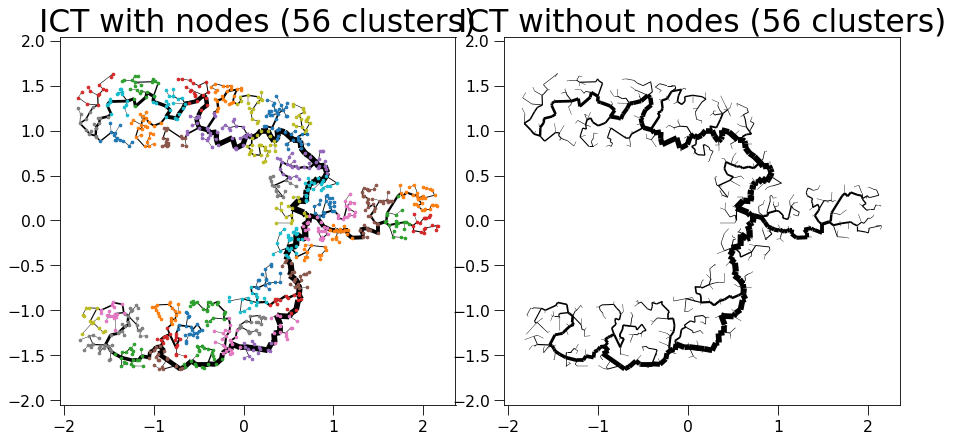

sklearn is done: 0.2504136562347412
My own part is done: 0.001791238784790039


  0%|          | 0/51 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 74
update Arr 74 -> 66
update Arr 66 -> 49
update Arr 49 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 95
update Arr 95 -> 58
update Arr 58 -> 46
update Arr 46 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 78
update Arr 78 -> 70
update Arr 70 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 127
update Arr 127 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 74
update Arr 74 -> 58
update Arr 58 -> 44
update Arr 44 -> 39
update Arr 39 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 147 -> 122
update Arr 122 -> 102
update Arr 102 -> 84
update Arr 84 -> 76
update Arr 76 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 45
update Arr 45 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 90
update Arr 90 -> 72
update Arr 72 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 35
update Arr 35 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 91
update Arr 91 -> 80
update Arr 80 -> 66
update Arr 66 -> 52
update Arr 52 -> 43
update Arr 43 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 187 -> 165
update Arr 165 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 64
update Arr 64 -> 57
update Arr 57 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 100
update Arr 100 -> 90
update Arr 90 -> 76
update Arr 76 -> 66
update Arr 66 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 79
update Arr 79 -> 61
update Arr 61 -> 51
update Arr 51 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 20
update Arr 20 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 211 -> 168
update Arr 168 -> 144
update Arr 144 -> 127
update Arr 127 -> 111
update Arr 111 -> 96
update Arr 96 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 56
update Arr 56 -> 46
update Arr 46 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 66
update Arr 66 -> 57
update Arr 57 -> 46
update Arr 46 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 114 -> 101
update Arr 101 -> 75
update Arr 75 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 18
update Arr 18 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 108
update Arr 108 -> 86
update Arr 86 -> 71
update Arr 71 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 65
update Arr 65 -> 57
update Arr 57 -> 41
update Arr 41 -> 34
update Arr 34 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 157
update Arr 157 -> 139
update Arr 139 -> 109
update Arr 109 -> 91
update Arr 91 -> 82
update Arr 82 -> 70
update Arr 70 -> 56
update Arr 56 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 71
update Arr 71 -> 41
update Arr 41 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 130 -> 104
update Arr 104 -> 79
update Arr 79 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 86
update Arr 86 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 88
update Arr 88 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 48
update Arr 48 -> 35
update Arr 35 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 130
update Arr 130 -> 117
update Arr 117 -> 103
update Arr 103 -> 93
update Arr 93 -> 70
update Arr 70 -> 61
update Arr 61 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 41
update Arr 41 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 73
update Arr 73 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 98
update Arr 98 -> 88
update Arr 88 -> 73
update Arr 73 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 104
update Arr 104 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 50
update Arr 50 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 54
update Arr 54 -> 48
update Arr 48 -> 34
update Arr 34 -> 29
update Arr 29 -> 22
update Arr 22 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 186 -> 159
update Arr 159 -> 138
update Arr 138 -> 124
update Arr 124 -> 109
update Arr 109 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 15
update Arr 15 -> 12
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 170 -> 147
update Arr 147 -> 130
update Arr 130 -> 117
update Arr 117 -> 105
update Arr 105 -> 86
update Arr 86 -> 77
update Arr 77 -> 63
update Arr 63 -> 41
update Arr 41 -> 35
update Arr 35 -> 33
update Arr 33 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 173 -> 146
update Arr 146 -> 127
update Arr 127 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 182 -> 158
update Arr 158 -> 139
update Arr 139 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 110
update Arr 110 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 62
update Arr 62 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 123
update Arr 123 -> 105
update Arr 105 -> 94
update Arr 94 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 81
update Arr 81 -> 63
update Arr 63 -> 53
update Arr 53 -> 43
update Arr 43 -> 35
update Arr 35 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 147
update Arr 147 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 98
update Arr 98 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 50
update Arr 50 -> 39
update Arr 39 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 120
update Arr 120 -> 104
update Arr 104 -> 92
update Arr 92 -> 78
update Arr 78 -> 69
update Arr 69 -> 56
update Arr 56 -> 50
update Arr 50 -> 42
update Arr 42 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 144
update Arr 144 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 35
update Arr 35 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 114
update Arr 114 -> 101
update Arr 101 -> 90
update Arr 90 -> 77
update Arr 77 -> 64
update Arr 64 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 120
update Arr 120 -> 107
update Arr 107 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 122
update Arr 122 -> 90
update Arr 90 -> 75
update Arr 75 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/51 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1078 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1078 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1078 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 6 edges early


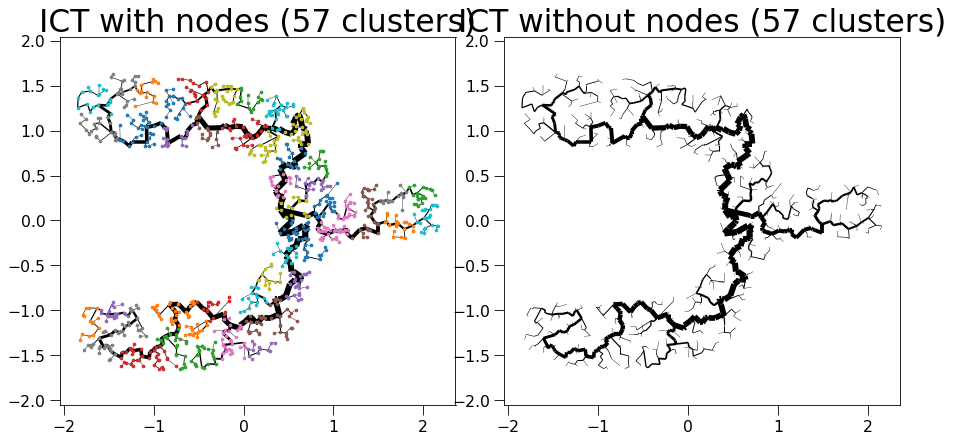

sklearn is done: 0.25049781799316406
My own part is done: 0.001397848129272461


  0%|          | 0/53 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 94
update Arr 94 -> 83
update Arr 83 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 78
update Arr 78 -> 60
update Arr 60 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 63
update Arr 63 -> 57
update Arr 57 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 16
update Arr 16 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 83
update Arr 83 -> 75
update Arr 75 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 101
update Arr 101 -> 86
update Arr 86 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 118
update Arr 118 -> 105
update Arr 105 -> 95
update Arr 95 -> 81
update Arr 81 -> 63
update Arr 63 -> 44
update Arr 44 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 212 -> 181
update Arr 181 -> 160
update Arr 160 -> 143
update Arr 143 -> 128
update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 54
update Arr 54 -> 43
update Arr 43 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 30
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 95
update Arr 95 -> 58
update Arr 58 -> 46
update Arr 46 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 49
update Arr 49 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 108 -> 85
update Arr 85 -> 71
update Arr 71 -> 63
update Arr 63 -> 49
update Arr 49 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 194 -> 164
update Arr 164 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 49
update Arr 49 -> 38
update Arr 38 -> 35
update Arr 35 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 122
update Arr 122 -> 106
update Arr 106 -> 88
update Arr 88 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 105
update Arr 105 -> 89
update Arr 89 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 42
update Arr 42 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 169 -> 146
update Arr 146 -> 127
update Arr 127 -> 109
update Arr 109 -> 92
update Arr 92 -> 67
update Arr 67 -> 53
update Arr 53 -> 47
update Arr 47 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 128
update Arr 128 -> 116
update Arr 116 -> 98
update Arr 98 -> 88
update Arr 88 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 20
update Arr 20 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 70
update Arr 70 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 95
update Arr 95 -> 79
update Arr 79 -> 65
update Arr 65 -> 59
update Arr 59 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 138
update Arr 138 -> 121
update Arr 121 -> 109
update Arr 109 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 77
update Arr 77 -> 60
update Arr 60 -> 52
update Arr 52 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 201 -> 172
update Arr 172 -> 153
update Arr 153 -> 139
update Arr 139 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 118
update Arr 118 -> 103
update Arr 103 -> 89
update Arr 89 -> 72
update Arr 72 -> 61
update Arr 61 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 93
update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 41
update Arr 41 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 96
update Arr 96 -> 82
update Arr 82 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 67
update Arr 67 -> 53
update Arr 53 -> 41
update Arr 41 -> 35
update Arr 35 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 52
update Arr 52 -> 42
update Arr 42 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 114 -> 101
update Arr 101 -> 75
update Arr 75 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 18
update Arr 18 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 181 -> 158
update Arr 158 -> 137
update Arr 137 -> 123
update Arr 123 -> 106
update Arr 106 -> 91
update Arr 91 -> 77
update Arr 77 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 94
update Arr 94 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 53
update Arr 53 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 34
update Arr 34 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 77
update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 47
update Arr 47 -> 37
update Arr 37 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 87
update Arr 87 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 38
update Arr 38 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 204 -> 161
update Arr 161 -> 145
update Arr 145 -> 118
update Arr 118 -> 101
update Arr 101 -> 91
update Arr 91 -> 80
update Arr 80 -> 65
update Arr 65 -> 59
update Arr 59 -> 44
update Arr 44 -> 36
update Arr 36 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 67
update Arr 67 -> 52
update Arr 52 -> 41
update Arr 41 -> 32
update Arr 32 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 62
update Arr 62 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 94
update Arr 94 -> 77
update Arr 77 -> 66
update Arr 66 -> 55
update Arr 55 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 113
update Arr 113 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 105
update Arr 105 -> 89
update Arr 89 -> 80
update Arr 80 -> 65
update Arr 65 -> 55
update Arr 55 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 89
update Arr 89 -> 76
update Arr 76 -> 61
update Arr 61 -> 46
update Arr 46 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 112
update Arr 112 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 68
update Arr 68 -> 59
update Arr 59 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 66
update Arr 66 -> 54
update Arr 54 -> 44
update Arr 44 -> 39
update Arr 39 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 65
update Arr 65 -> 49
update Arr 49 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 97
update Arr 97 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 115 -> 89
update Arr 89 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 32
update Arr 32 -> 26
update Arr 26 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 16


Patching the components together:   0%|          | 0/53 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1098 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1098 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1098 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 3 edges early


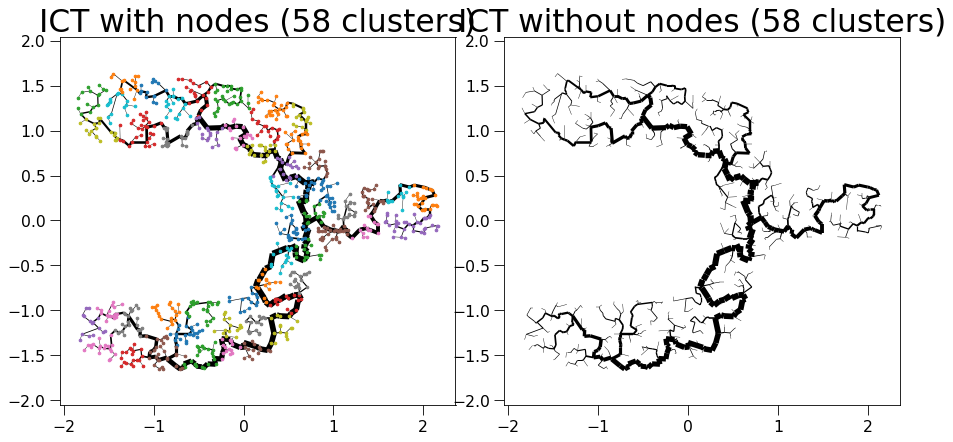

sklearn is done: 0.25849413871765137
My own part is done: 0.0013859272003173828


  0%|          | 0/49 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 140
update Arr 140 -> 119
update Arr 119 -> 105
update Arr 105 -> 95
update Arr 95 -> 86
update Arr 86 -> 68
update Arr 68 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 74
update Arr 74 -> 67
update Arr 67 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 71
update Arr 71 -> 57
update Arr 57 -> 48
update Arr 48 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 180 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 100
update Arr 100 -> 83
update Arr 83 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 171
update Arr 171 -> 146
update Arr 146 -> 131
update Arr 131 -> 107
update Arr 107 -> 96
update Arr 96 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 131 -> 106
update Arr 106 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 39
update Arr 39 -> 33
update Arr 33 -> 26
update Arr 26 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 190 -> 166
update Arr 166 -> 148
update Arr 148 -> 117
update Arr 117 -> 103
update Arr 103 -> 88
update Arr 88 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 79
update Arr 79 -> 71
update Arr 71 -> 63
update Arr 63 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 152 -> 133
update Arr 133 -> 113
update Arr 113 -> 101
update Arr 101 -> 86
update Arr 86 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 81
update Arr 81 -> 69
update Arr 69 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 66
update Arr 66 -> 58
update Arr 58 -> 51
update Arr 51 -> 34
update Arr 34 -> 26
update Arr 26 -> 23
update Arr 23 -> 19
update Arr 19 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 104
update Arr 104 -> 93
update Arr 93 -> 78
update Arr 78 -> 62
update Arr 62 -> 56
update Arr 56 -> 47
update Arr 47 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 112
update Arr 112 -> 95
update Arr 95 -> 83
update Arr 83 -> 71
update Arr 71 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 144
update Arr 144 -> 126
update Arr 126 -> 113
update Arr 113 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 67
update Arr 67 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 96
update Arr 96 -> 86
update Arr 86 -> 62
update Arr 62 -> 55
update Arr 55 -> 43
update Arr 43 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 84
update Arr 84 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 142
update Arr 142 -> 120
update Arr 120 -> 107
update Arr 107 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 128
update Arr 128 -> 111
update Arr 111 -> 97
update Arr 97 -> 78
update Arr 78 -> 61
update Arr 61 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/100 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/100 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 67
update Arr 67 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 106
update Arr 106 -> 87
update Arr 87 -> 72
update Arr 72 -> 52
update Arr 52 -> 46
update Arr 46 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
update Arr 85 -> 76
update Arr 76 -> 66
update Arr 66 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 188 -> 154
update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 63
update Arr 63 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 111
update Arr 111 -> 98
update Arr 98 -> 80
update Arr 80 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 136
update Arr 136 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 76
update Arr 76 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 32
update Arr 32 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 233 -> 210
update Arr 210 -> 184
update Arr 184 -> 165
update Arr 165 -> 141
update Arr 141 -> 125
update Arr 125 -> 109
update Arr 109 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 63
update Arr 63 -> 53
update Arr 53 -> 45
update Arr 45 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 122
update Arr 122 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 107
update Arr 107 -> 94
update Arr 94 -> 83
update Arr 83 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 44
update Arr 44 -> 36
update Arr 36 -> 32
update Arr 32 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 121
update Arr 121 -> 100
update Arr 100 -> 82
update Arr 82 -> 74
update Arr 74 -> 59
update Arr 59 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 129
update Arr 129 -> 114
update Arr 114 -> 101
update Arr 101 -> 86
update Arr 86 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 120
update Arr 120 -> 102
update Arr 102 -> 92
update Arr 92 -> 71
update Arr 71 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 158
update Arr 158 -> 134
update Arr 134 -> 119
update Arr 119 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 32
update Arr 32 -> 28
update Arr 28 -> 22
update Arr 22 -> 18
update Arr 18 -> 14
update Arr 14 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/92 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/92 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 92 -> 75
update Arr 75 -> 53
update Arr 53 -> 45
update Arr 45 -> 30
update Arr 30 -> 27
update Arr 27 -> 20
update Arr 20 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 159 -> 129
update Arr 129 -> 111
update Arr 111 -> 88
update Arr 88 -> 74
update Arr 74 -> 60
update Arr 60 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 97
update Arr 97 -> 87
update Arr 87 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 19
update Arr 19 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 93
update Arr 93 -> 82
update Arr 82 -> 68
update Arr 68 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 92
update Arr 92 -> 79
update Arr 79 -> 65
update Arr 65 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 98
update Arr 98 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 146
update Arr 146 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 84
update Arr 84 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 43
update Arr 43 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 23
update Arr 23 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 116
update Arr 116 -> 95
update Arr 95 -> 86
update Arr 86 -> 70
update Arr 70 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 99
update Arr 99 -> 87
update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 97
update Arr 97 -> 76
update Arr 76 -> 67
update Arr 67 -> 58
update Arr 58 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 90
update Arr 90 -> 77
update Arr 77 -> 69
update Arr 69 -> 47
update Arr 47 -> 39
update Arr 39 -> 33
update Arr 33 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


Patching the components together:   0%|          | 0/49 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1086 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1086 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1086 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 4 edges early


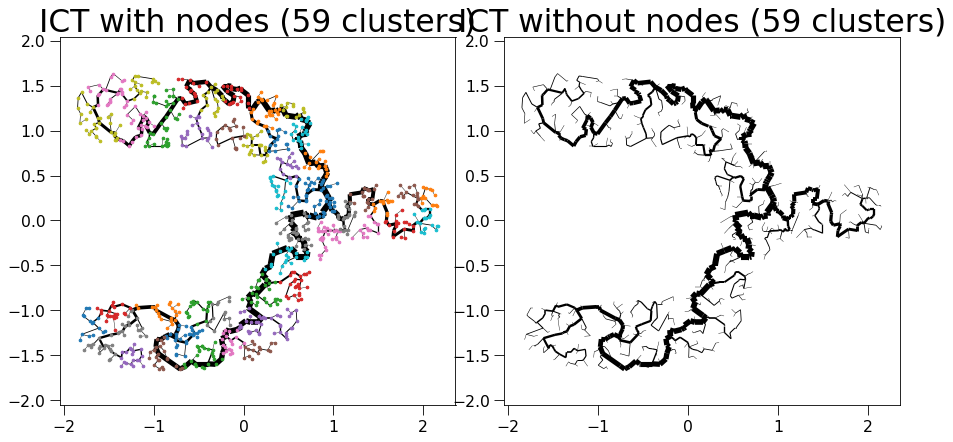

sklearn is done: 0.2581028938293457
My own part is done: 0.0013811588287353516


  0%|          | 0/53 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 92
update Arr 92 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 100
update Arr 100 -> 84
update Arr 84 -> 73
update Arr 73 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 170 -> 152
update Arr 152 -> 121
update Arr 121 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 65
update Arr 65 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 156 -> 128
update Arr 128 -> 115
update Arr 115 -> 95
update Arr 95 -> 83
update Arr 83 -> 71
update Arr 71 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 126
update Arr 126 -> 109
update Arr 109 -> 96
update Arr 96 -> 83
update Arr 83 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 45
update Arr 45 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 20
update Arr 20 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 42
update Arr 42 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 118
update Arr 118 -> 101
update Arr 101 -> 87
update Arr 87 -> 74
update Arr 74 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 105
update Arr 105 -> 93
update Arr 93 -> 77
update Arr 77 -> 69
update Arr 69 -> 54
update Arr 54 -> 44
update Arr 44 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 57
update Arr 57 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 96
update Arr 96 -> 75
update Arr 75 -> 65
update Arr 65 -> 55
update Arr 55 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 189 -> 166
update Arr 166 -> 147
update Arr 147 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 95
update Arr 95 -> 78
update Arr 78 -> 62
update Arr 62 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/97 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/97 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 97 -> 69
update Arr 69 -> 61
update Arr 61 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 77
update Arr 77 -> 66
update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 91
update Arr 91 -> 80
update Arr 80 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 65
update Arr 65 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 39
update Arr 39 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 15
update Arr 15 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 115
update Arr 115 -> 104
update Arr 104 -> 89
update Arr 89 -> 80
update Arr 80 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 39
update Arr 39 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 73
update Arr 73 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 174 -> 157
update Arr 157 -> 137
update Arr 137 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 82
update Arr 82 -> 69
update Arr 69 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 83
update Arr 83 -> 71
update Arr 71 -> 54
update Arr 54 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 17
update Arr 17 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 119
update Arr 119 -> 107
update Arr 107 -> 96
update Arr 96 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 121 -> 101
update Arr 101 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 87
update Arr 87 -> 75
update Arr 75 -> 67
update Arr 67 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 175 -> 154
update Arr 154 -> 139
update Arr 139 -> 121
update Arr 121 -> 108
update Arr 108 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 128
update Arr 128 -> 115
update Arr 115 -> 101
update Arr 101 -> 90
update Arr 90 -> 77
update Arr 77 -> 63
update Arr 63 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 112
update Arr 112 -> 99
update Arr 99 -> 69
update Arr 69 -> 61
update Arr 61 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 111
update Arr 111 -> 98
update Arr 98 -> 72
update Arr 72 -> 58
update Arr 58 -> 51
update Arr 51 -> 40
update Arr 40 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 74
update Arr 74 -> 59
update Arr 59 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 50
update Arr 50 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 14
update Arr 14 -> 12
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 101
update Arr 101 -> 82
update Arr 82 -> 73
update Arr 73 -> 58
update Arr 58 -> 47
update Arr 47 -> 33
update Arr 33 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 143
update Arr 143 -> 128
update Arr 128 -> 114
update Arr 114 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 134 -> 118
update Arr 118 -> 101
update Arr 101 -> 90
update Arr 90 -> 76
update Arr 76 -> 69
update Arr 69 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 21
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 114 -> 103
update Arr 103 -> 80
update Arr 80 -> 72
update Arr 72 -> 53
update Arr 53 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 98
update Arr 98 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 48
update Arr 48 -> 34
update Arr 34 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 219 -> 189
update Arr 189 -> 171
update Arr 171 -> 150
update Arr 150 -> 134
update Arr 134 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 98
update Arr 98 -> 80
update Arr 80 -> 72
update Arr 72 -> 61
update Arr 61 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 108
update Arr 108 -> 72
update Arr 72 -> 60
update Arr 60 -> 48
update Arr 48 -> 34
update Arr 34 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 114
update Arr 114 -> 93
update Arr 93 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 49
update Arr 49 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 152
update Arr 152 -> 138
update Arr 138 -> 121
update Arr 121 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 44
update Arr 44 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 115
update Arr 115 -> 104
update Arr 104 -> 83
update Arr 83 -> 66
update Arr 66 -> 54
update Arr 54 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 111
update Arr 111 -> 97
update Arr 97 -> 85
update Arr 85 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 104
update Arr 104 -> 80
update Arr 80 -> 61
update Arr 61 -> 52
update Arr 52 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 131 -> 110
update Arr 110 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 59
update Arr 59 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 76
update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 49
update Arr 49 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 57
update Arr 57 -> 45
update Arr 45 -> 36
update Arr 36 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 84
update Arr 84 -> 71
update Arr 71 -> 62
update Arr 62 -> 50
update Arr 50 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 24
update Arr 24 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 112
update Arr 112 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/53 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1082 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1082 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1082 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 7 edges early


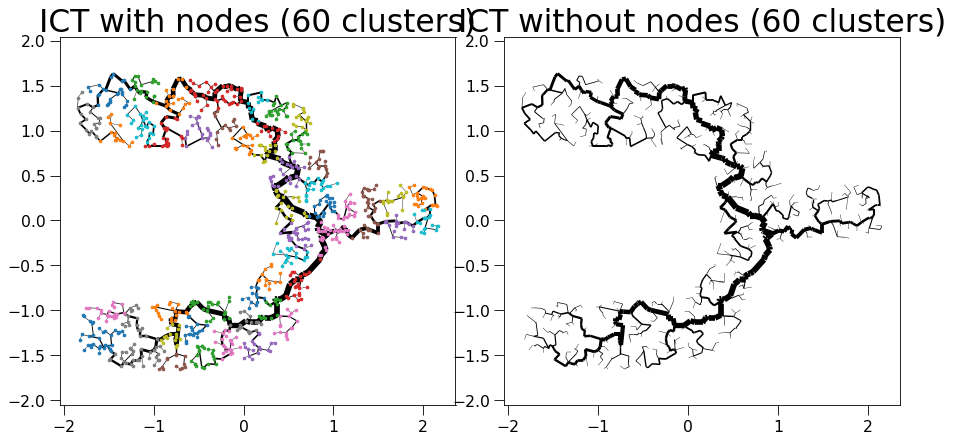

In [8]:
for k in range(1, 61):
    cluster_centers, cluster_labels = k_means_pp(k, position, return_labels=True)

    if small_behavior == "remove":
        cluster_centers, cluster_labels, (position, ) = cfilter(cluster_centers, cluster_labels, t=min_cluster_size, position_likes=[position])
        number_of_nodes = len(position)
    if small_behavior == "reassign":
        cluster_centers, cluster_labels = cassign(cluster_centers, cluster_labels, position, t=min_cluster_size)

    sub_ICTs, components = calculate_sub_ICTs(position, cluster_centers, cluster_labels, t=min_cluster_size)


    # plot the ICT forest
    ICT_forest = nk.graph.Graph(n=len(position), weighted=True)
    distances = pairwise_distances(position, position)
    for component, sub_ICT in zip(components, sub_ICTs):
        for u, v, w in sub_ICT.iterEdgesWeights():
            nodeA = component[u]
            nodeB = component[v]
            ICT_forest.addEdge(nodeA, nodeB, distances[nodeA, nodeB])

    ICT_forest.indexEdges()
    
    
    
    good_edges = []
    for u, v in ICT_forest.iterEdges():
        good_edges.append([u,v])
        
        
        

    G = patch_together(ICT_forest, position, bridges=4)

    ICT = calculate_ICT(G, algorithm_type=ICT_algorithm, cluster_centers=cluster_centers,
                                    zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
    ICT.indexEdges()
    
    # Plot the ICT
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    plot_points(position, f"ICT with nodes ({k} clusters)", axs[0], labels=np.array(cluster_labels), node_size=5)
    axs[0].get_legend().remove()
    plot_graph(ICT, position, f"ICT with nodes ({k} clusters)", axs[0], node_size=0, edge_scale=0.5)
    plot_graph(ICT, position, f"ICT without nodes ({k} clusters)", axs[1], node_size=0, edge_scale=0.5)
    name = str(k)
    plt.tight_layout()
    plt.savefig(f"Output/Images2/"+ name.zfill(5) + ".png")
    plt.show()